## Setup

### Imports

In [1]:
%load_ext autoreload
%autoreload 3 --print
# import os; os.environ['JAX_PLATFORM_NAME'] = 'cpu'
# import os; os.environ['XLA_PYTHON_CLIENT_MEM_FRACTION'] = '.95'

In [2]:
from shape_norm.project.paths import Project, create_model
from shape_norm.io import loaders
from shape_norm.models import joint
from shape_norm import config
from shape_norm.models import instantiation, setup, pose, morph, util as model_util
from shape_norm import fitting
from shape_norm.fitting import em
from shape_norm.io import alignment, features
from shape_norm.io.armature import Armature
from shape_norm.fitting import methods
from shape_norm.fitting import scans
from shape_norm.pca import fit_with_center, CenteredPCA, PCAData
from shape_norm.io.dataset import PytreeDataset
from shape_norm.io.dataset_refactor import Dataset, SessionMetadata
from shape_norm.models.morph.lowrank_affine import LRAParams, model as lra_model
from shape_norm import pca
from blscale_loader import loader, linear_skeletal as blscale_ls
import os, sys, shutil
import numpy as np
from pprint import pprint
from sklearn import metrics
from matplotlib import colors as mpl_col
import jax.numpy as jnp
from sklearn.linear_model import LogisticRegression, Ridge, LinearRegression, Lasso
import itertools as iit
import scipy.stats
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture
import seaborn as sns
from shape_norm import viz
import pandas as pd
from shape_norm.viz import styles
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from tensorflow_probability.substrates import jax as tfp
from ruamel.yaml import YAML
from bidict import bidict
import matplotlib.pyplot as plt
from collections import defaultdict
import os, re
import tqdm
from cmap import Colormap
import joblib as jl

from pathlib import Path
import logging
logging.getLogger().setLevel(logging.INFO)

### Supporting funcs

#### Datasets

In [3]:
def mouse_data_armature_meta():
    """Organize metadata on keypoints and skeleton of mouse data."""
    names = [
        'shldr', 'back', 'hips', 't_base','t_tip', 'head',
        'l_ear', 'r_ear', 'nose', 'lr_knee', 'lr_foot',
        'rr_knee', 'rr_foot', 'lf_foot', 'rf_foot']
    parents = dict(zip(names, [
        'back', 'hips', None, 'hips', 't_base', 'shldr',
        'head', 'head', 'head', 'hips', 'lr_knee',
        'hips', 'rr_knee', 'shldr', 'shldr']))
    keypt_ix = lambda name: names.index(name)
    bones = np.array([(keypt_ix(c), keypt_ix(p)) for c, p in parents.items() if p])
    root = keypt_ix("shldr")
    bones = blscale_ls.reroot(bones, root)
    bones = bones[np.argsort(bones[:, 0])]
    return names, parents, bones, root


def load_all_mouse_sessions(age_whitelist = None):
    data_root = '../../../data_explore/data'

    # Create mapping of session names (ie 3wk_m0) to keypoint data paths

    modata_npy_name_func = (lambda path, *a:
        match.group(1) if ((match := re.search(r"\d{2}_\d{2}_\d{2}_(\d+wk_m\d+)\.npy", path)) is not None) else None)
    session_paths = dict(filter(lambda x: x[0] is not None, [(modata_npy_name_func(m), str(Path(data_root) / m)) for m in os.listdir(data_root)]))
    # throw out 9-12 week
    session_ages = {s: s.split('_')[0].strip('wk') for s in session_paths}
    ages = set(session_ages.values())
    if age_whitelist is not None:
        ages = list(filter(lambda x: x in age_whitelist, ages))
    session_paths = {s: p for s, p in session_paths.items() if session_ages[s] in ages}
    session_bodies = {s: f'body-{session_ages[s]}wk' for s in session_paths}
    names, parents, _, _ = mouse_data_armature_meta()

    age_dates =  {
        "3" : "10_11_22",
        "5" : "10_24_22",
        "7" : "10_24_22",
        "24": "11_03_22",
        "52" : "11_03_22",
        "72" : "10_14_22",
    }

    print("sessions:", session_paths.keys())

    sesssion_kps = {
        s: np.load(p) for s, p in session_paths.items()
    }

    project_config_kws = {
        "session_names": list(sesssion_kps.keys()),
        "bodies": session_bodies,
        "keypoint_names": names,
        "keypoint_parents": parents,
    }

    return project_config_kws, sesssion_kps

#### Plotting

In [4]:
def getc(spec):
    try:
        from cmap import Colormap, Color
        try:
            return Color(spec)
        except ValueError as e:
            stop = spec.split(':')[-1]
            if stop.startswith('.'):
                stop = float(stop)
            else:
                stop = int(stop)
            cm = Colormap(':'.join(spec.split(':')[:-1]))
            return cm(stop)
    except ImportError:
        return spec

def plot_mouse_3d(
    frame,
    ax,
    armature,
    elev,
    rot,
    colors=None,
    bone_n=40,
    point_size=10,
    line_size=2,
    line_colors=None,
    point_kws={},
    line_kws={},
    boundary=True,
    set_aspect=True,
    label = None
):
    """all keys in point kws should be present in line kws"""

    if colors is None:
        import seaborn as sns

        colors = mpl_col.to_rgba(sns.color_palette("Blues", 10 + frame.shape[0])[10:])
    if line_colors is None:
        line_colors = colors
    colors = np.array([mpl_col.to_rgba(x) for x in colors])
    line_colors = np.array([mpl_col.to_rgba(x) for x in line_colors])
    point_kws = {
        **dict(
            linewidths=np.array([0] * armature.n_kpts),
        ),
        **point_kws,
    }
    line_kws = {
        **dict(
            linewidths=np.array([0] * armature.n_kpts),
        ),
        **line_kws,
    }

    # --- points

    x, y, z, c, s = [], [], [], [], []
    x.append(frame[:, 0])
    y.append(frame[:, 1])
    z.append(frame[:, 2])
    c.append(colors)
    s.append([point_size] * armature.n_kpts)
    kws = {k: [] for k in point_kws}
    concat_keys = []
    for k, v in point_kws.items():
        if np.array(v).shape[:1] == (armature.n_kpts,):
            concat_keys.append(k)
            kws[k].append(v)
        else:
            kws[k] = v

    x = np.concatenate(x)
    y = np.concatenate(y)
    z = np.concatenate(z)
    c = np.concatenate(c)
    s = np.concatenate(s)
    for k, v in kws.items():
        if k in concat_keys:
            kws[k] = np.concatenate(kws[k])
    point_artist = ax.scatter(x, y, z, c=c, s=s, depthshade=False, **kws)

    # --- "lines"

    x, y, z, c, s = [], [], [], [], []
    kws = {k: [] for k in line_kws}
    concat_keys = []
    for i, (ch, pa) in enumerate(armature.bones):
        x.append(np.linspace(frame[ch, 0], frame[pa, 0], bone_n)[1:-1])
        y.append(np.linspace(frame[ch, 1], frame[pa, 1], bone_n)[1:-1])
        z.append(np.linspace(frame[ch, 2], frame[pa, 2], bone_n)[1:-1])
        c.append(np.full([bone_n - 2, 4], line_colors[ch]))
        s.append(np.full([bone_n - 2], line_size))
        for k, v in line_kws.items():
            if np.array(v).shape[:1] == (armature.n_kpts,):
                concat_keys.append(k)
                kws[k].append(np.full((bone_n - 2,) + np.array(v).shape[1:], v[ch]))
            else:
                kws[k] = v
    x = np.concatenate(x)
    y = np.concatenate(y)
    z = np.concatenate(z)
    c = np.concatenate(c)
    s = np.concatenate(s)
    for k, v in kws.items():
        if k in concat_keys:
            kws[k] = np.concatenate(kws[k])

    line_artist = ax.scatter(x, y, z, c=c, s=s, depthshade=False, **kws)

    ax.view_init(elev, rot)

    ax.grid(False)
    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False
    ax.xaxis.set_ticks([])
    ax.yaxis.set_ticks([])
    ax.zaxis.set_ticks([])
    if not boundary:
        ax.xaxis.pane.set_linewidth(0)
        ax.yaxis.pane.set_linewidth(0)
        ax.zaxis.pane.set_linewidth(0)
        ax.xaxis.line.set_linewidth(0)
        ax.yaxis.line.set_linewidth(0)
        ax.zaxis.line.set_linewidth(0)

    
    # use a.set_box_aspect to make the aspect equal to the ratio of the limits
    if set_aspect:
        xrng = np.ptp(ax.get_xlim())
        yrng = np.ptp(ax.get_ylim())
        zrng = np.ptp(ax.get_zlim())
        ax.set_box_aspect([xrng, yrng, zrng])

    return point_artist, line_artist

#### Shape norm utilties

In [5]:
# model manipulation
def lra_anchor_poses(params: LRAParams, magnitudes=90):
    """
    Parameters:
    params (LRAParams):
        Parameters used for calculating anchor poses.
    magnitudes (float, numpy.ndarray):
        The magnitude value used in calculating anchor poses. If a float, the
        same magnitude is used for all anchors. If an array, the magnitude
        for each dimension is specified separately. Not applied to the centroid
        anchor.

    Returns, (array, shape (n_bodies, n_dims, n_modes + 1)):
    numpy.ndarray:
        The anchor poses in the canonical pose space.
    """

    L = params.n_dims

    if isinstance(magnitudes, (int, float)):
        magnitudes = magnitudes * np.ones(L)

    # (n_bodies, n_dims, 1)
    anchors = (params.offset + params.offset_updates).reshape(
        params.n_bodies, -1, 1
    )
    # (n_bodies, n_dims, n_modes + 1)
    anchors = np.concatenate(
        [
            anchors,
            anchors
            + magnitudes[None, None] * (params.modes + params.mode_updates),
        ],
        axis=-1,
    )

    return anchors


def anchor_keypoints(
    params: LRAParams,
    align_meta: dict,
    magnitudes=90,
    _inflate=None,
    config=None,
    session_meta: SessionMetadata = None,
):
    """
    Calculate and return the anchor poses from a model in the original keypoint
    space.

    This function computes anchor poses based on the provided parameters and
    alignment metadata, inflates the poses based on a given configuration (if
    any), and then applies inverse alignment scaling to return the poses in
    their original keypoint space.

    Parameters
    ----------
    params, dict:
        Parameters used for calculating anchor poses.
    session_meta, SessionMetadata, optional:
        Session metadata object (accessible via dataset.session_meta) for
        mapping body indices to session indices for rescaling. Required if
        align_meta is provided. If provided, first index of output is over
        session ids, not body ids.
    align_meta, dict:
        Metadata for alignment, optionally including scaling factors under the
        key `scale`.
    magnitudes, int, optional:
        The magnitude value used in calculating anchor poses. Defaults to 90.
    _inflate, function, optional:
        A custom function to inflate anchor poses. If None, a default inflation
        based on the 'features' configuration is used.
    config, dict, optional:
        Configuration dictionary that, if provided, is used to inflate the
        anchor poses using the '_inflate' function. It should contain a
        'features' key if'_inflate' is not provided.

    Returns
    -------
    numpy.ndarray, shape (n_bodies or n_sessions, n_anchor, n_keypt, n_spatial):
        The anchor poses in the original keypoint space after applying inverse
        alignment scaling. If session_meta is provided, the first index is over
        sessions instead of bodies.



    """
    if _inflate is None:
        _inflate = lambda x: features.inflate(x, config["features"])
    anchor_poses = lra_anchor_poses(
        params, magnitudes
    )  # (n_bodies, n_feat, n_anch)
    inflated = _inflate(anchor_poses.transpose(0, 2, 1))
    if session_meta is not None:
        inflated = jnp.array([
            inflated[session_meta.session_body_id(i)]
            for i in range(len(session_meta._session_ids))
        ])
        if "scale" in align_meta:
            inflated = alignment._inverse_align_scales(
                inflated, align_meta["scale"][:, None], stacked=True
            )
    return inflated


def unalign_scales(align_meta, dataset, split_meta = None, base_dataset = None):
    """
    Invert scaling alignment, potentially on a split dataset

    Parameters
    ----------
    align_meta : dict
        The alignment metadata, containing an array under key 'scale' whose
        $i$th element is the scale factor to be applied to sesssion with id $i$.
    dataset : Dataset
        The dataset to invert the scaling on.
    split_meta : tuple, optional
        Tuple whos second element (index 1) maps original session names (in
        `dataset`) to the names of sessions in `dataset`.
    base_dataset : Dataset, optional
        Dataset with session ids that match the indices of
        `align_meta['scale']`. Can be provided if `dataset` is a split dataset
        where alignment was already performed before splitting.
    """
    if base_dataset is not None:
        scan_align_meta = {'scale': np.array([-1. for _ in dataset.sessions])}
        for src_sess, splits in split_meta[1].items():
            for s in splits:
                scan_align_meta['scale'][dataset.session_id(s)] = align_meta['scale'][base_dataset.session_id(src_sess)]
        align_meta = scan_align_meta
    return alignment._inverse_align_scales(dataset, align_meta["scale"]), align_meta



def anchor_magnitudes(
    dataset: Dataset, params: LRAParams, q=0.9, canonicalized=False
):
    """
    Sample the `q`th percentile in absolute value from distributions of anchor
    pose coordinates.

    Parameters
    ----------
    dataset : Dataset
        Feature data, in canonical pose space if `canonicalized` is True.
    model : MorphModel
    params : LRAParams
        Parameters of the model.
    q : float, default 0.9
        The quantile to sample from.
    canonicalized : bool, default False
        Whether the dataset is already in canonical pose space (magnitudes are
        not session- or body-dependent)

    Returns
    -------
    magnitudes : array, shape (n_modes,)
        The selected magnitude in each morph mode.
    """
    if canonicalized:
        canonical = dataset.data
    else:
        canonical = model_util.apply_bodies(
            lra_model,
            params,
            dataset,
            {
                s: dataset.session_body_name(dataset.ref_session)
                for s in dataset.sessions
            },
        ).data

    coords = canonical @ params.modes  # (n_pts, n_modes)
    qix = jnp.argsort(coords, axis=0)[
        int(coords.shape[0] * q)
    ]  # argquantile
    selected_coord = coords[qix, jnp.arange(coords.shape[1])]
    return selected_coord

### Panel setup

#### Setup

In [23]:
project_config_kws, dataset_keypoints = load_all_mouse_sessions(["3", "5", "7", "24", "52", "72"])
ref_age = "3"
ref_session = f"{ref_age}wk_m0"
project_config_kws['ref_session'] = ref_session

ref_age = '3'
tgt_age = '24'
tgt_ages = ['24']
ref_color = getc('curl_pink:180')
tgt_color = getc('curl_pink:60')
tgt_colors = [getc('curl_pink:60')]

sessions: dict_keys(['5wk_m6', '72wk_m2', '72wk_m3', '5wk_m7', '5wk_m5', '72wk_m1', '72wk_m0', '5wk_m4', '5wk_m0', '72wk_m4', '72wk_m5', '5wk_m1', '5wk_m3', '72wk_m7', '72wk_m6', '5wk_m2', '52wk_m0', '24wk_m1', '24wk_m0', '52wk_m1', '52wk_m3', '24wk_m2', '24wk_m3', '52wk_m2', '3wk_m1', '3wk_m0', '52wk_m5', '24wk_m4', '3wk_m2', '3wk_m3', '24wk_m5', '52wk_m4', '7wk_m3', '7wk_m2', '7wk_m0', '7wk_m1'])


In [34]:
# Create base project config to override

project_dir = Path('../projects/o2-ont/fit03-2_frames-many_gmm10')
# project_dir = Path('../projects/ont-test/3-24-pose10')
project_dir.mkdir(exist_ok = True)
project = Project(project_dir)

scan_name = 'init-scan'
model_name = 'init-scan_1'

plot_dir = project.model(model_name) / "panel-plots"
plot_dir.mkdir(exist_ok = True)


# --- Load plotting style
params_file = "/Users/kaifox/projects/mph/generative_api/test/notebooks/panels/plot_params.yml"
plot_meta = YAML(typ='safe').load(open(params_file, 'r'))
colors, plotter = styles.init_plt(plot_dir, style='default', fmt = 'pdf', **plot_meta['savefig'])
plt.rcParams.update(plot_meta['rc'])
plot_root = Path(plotter.plot_dir)


plot_meta = YAML(typ='safe').load(open(params_file, 'r'))
age_pal = {k: getc(c) for k, c in plot_meta['colors']['age'].items()}
bhv_pal = {k: getc(c) for k, c in plot_meta['colors']['bhv'].items()}
bhv_keys = plot_meta['behavior']['keys']
bhv_names = plot_meta['behavior']['names']

In [35]:
def merge_morphs(params: LRAParams, merged_session_meta: SessionMetadata, split_session_meta: SessionMetadata, split_meta: dict):
    """
    Merge morph parameters from a split dataset into a single dataset.

    Parameters
    ----------
    params : LRAParams
        The morph parameters.
    merged_session_meta, split_session_metadata : SessionMetadata
        Session metadata object (accessible via dataset.session_meta) for
        identifying body ids.
    split_meta : dict
        Metadata for the split dataset, containing a mapping original body names
        to sessions in the split dataset.

    Returns
    -------
    numpy.ndarray, shape (n_sessions, n_modes, n_dims)
        The merged morph parameters.
    """
    body_inv = {
        b: [split_session_meta.session_body_name(s) for s in split_meta[b]]
        for b in split_meta
    }
    new_nbod = len(merged_session_meta._body_ids)
    new_ref = None
    mode_upds = np.zeros((new_nbod, params.n_feats, params.n_dims))
    ofs_upds = np.zeros((new_nbod, params.n_feats))
    for i in range(new_nbod):
        merged_bod = merged_session_meta.body_name(i)
        i_mode_upds = []
        i_ofs_upds = []
        for split_bod in body_inv[merged_bod]:
            j = split_session_meta.body_id(split_bod)
            i_mode_upds.append(params.mode_updates[j])
            i_ofs_upds.append(params.offset_updates[j])
            if j == params.ref_body:
                new_ref = i
        mode_upds[i] = np.mean(i_mode_upds, axis=0)
        ofs_upds[i] = np.mean(i_ofs_upds, axis=0)
    
    return LRAParams({**params._tree, **dict(
        n_bodies=new_nbod,
        ref_body=new_ref,
        _mode_updates=jnp.array(mode_upds),
        _offset_updates=jnp.array(ofs_upds),
    )})


In [36]:
# Select and load model

ckpt = methods.load_fit(project.model(model_name))
cfg = ckpt["config"]
model = instantiation.get_model(cfg)
arms = Armature.from_config(cfg["dataset"])
params = ckpt["params"]

dataset = loaders.arrays.from_arrays(dataset_keypoints, cfg["dataset"])
dataset_versions, split_meta, align_meta = scans.prepare_scan_dataset(dataset, cfg, return_session_inv=True, all_versions=True)
scan_dataset = dataset_versions["train"]
dataset_feats = dataset_versions["reduced"]

dataset_full = loaders.arrays.from_arrays(dataset_keypoints, cfg["dataset"], allow_subsample=False)
dataset_versions_full, split_meta_full, align_meta_full = scans.prepare_scan_dataset(dataset_full, cfg, return_session_inv=True, all_versions=True)
scan_dataset_full = dataset_versions_full["train"]
dataset_feats_full = dataset_versions_full["reduced"]

merged_params = merge_morphs(params.morph, dataset.session_meta, scan_dataset.session_meta, split_meta[0])


session_ages = {s: re.search(r"(\d+)wk", s).group(1) for s in dataset_feats.sessions}
age_groups = {session_ages[s] for s in dataset_feats.sessions}
age_groups = {g: [s for s in dataset_feats.sessions if session_ages[s] == g] for g in age_groups}


laodfing model config /Users/kaifox/projects/mph/generative_api/test/projects/o2-ont/fit03-2_frames-many_gmm10/models/init-scan_1/model.yml
project path /Users/kaifox/projects/mph/generative_api/test/projects/o2-ont/fit03-2_frames-many_gmm10/models/init-scan_1/../../project.yml
laodfing model config /Users/kaifox/projects/mph/generative_api/test/projects/o2-ont/fit03-2_frames-many_gmm10/models/init-scan_1/model.yml
project path /Users/kaifox/projects/mph/generative_api/test/projects/o2-ont/fit03-2_frames-many_gmm10/models/init-scan_1/../../project.yml


In [37]:
plt.rcParams.update({
    # font
    'font.family': 'Arial',
    'font.size': 6,
    'axes.labelsize': 6,
    'xtick.labelsize': 5.5,
    'ytick.labelsize': 5.5,
    'axes.titlesize': 6,
    'legend.fontsize': 5.5,
    'figure.titlesize': 6,
    # axes
    'axes.facecolor': 'ffffff00',
    'axes.spines.top': False,
    'axes.spines.right': False,
    'axes.linewidth': 0.25,
    'xtick.major.width': 0.2,
    'ytick.major.width': 0.2,
    'xtick.minor.width': 0.15,
    'ytick.minor.width': 0.15,
    'xtick.major.pad': 1.5,
    'ytick.major.pad': 1.5,
    'xtick.major.size': 1.2,
    'ytick.major.size': 1.2,
    'xtick.minor.size': 1,
    'ytick.minor.size': 1,
    # legend
    'legend.frameon': False,
    # misc
    'hatch.linewidth': 0.5,
})

#### Supporting funcs

In [15]:
def canonicalized_and_raw(dataset, morph_params, rescale=True, scale_to=None, body_to=None):
    body_to = dataset.session_body_name(dataset.ref_session) if body_to is None else body_to
    canonicalized = model_util.apply_bodies(
        model.morph,
        morph_params,
        dataset,
        {s: body_to for s in dataset.sessions},
    )
    canonicalized = features.inflate(canonicalized, cfg["features"])
    raw = features.inflate(dataset, cfg["features"])

    if rescale:
        raw, split_align_meta = unalign_scales(
            align_meta, raw, split_meta, dataset
        )
        align_to = split_align_meta["scale"][dataset.session_id(scale_to)]
        canonical_meta = {"scale": np.full(dataset.n_sessions, align_to)}
        canonicalized, _ = unalign_scales(canonical_meta, canonicalized)
    return canonicalized, raw, (split_align_meta if rescale else {})


def canonicalized_raw_bls(
    canonicalized, raw, sessions, group_suffix='wk', parts=(".0", ".1"), group_bodies=True
):
    groups = (
        {s: re.search(r"(\d+)"+group_suffix, s).group(1) for s in sessions}
        if group_bodies
        else {s: s for s in sessions}
    )
    bls_canon = {g: [] for g in set(groups.values())}
    bls_raw = {g: [] for g in set(groups.values())}
    print("groups:", groups)
    for s in sessions:
        k = groups[s]
        bls_canon[k].extend(
            [
                _bone_lengths(canonicalized.get_session(f"{s}{part}"), arms)
                for part in parts
            ]
        )
        bls_raw[k].extend(
            [
                _bone_lengths(raw.get_session(f"{s}{part}"), arms)
                for part in parts
            ]
        )
    bls_canon = {k: jnp.concatenate(v) for k, v in bls_canon.items()}
    bls_raw = {k: jnp.concatenate(v) for k, v in bls_raw.items()}
    return bls_canon, bls_raw, groups

def canonicalized_and_raw_jas(
    canonicalized, raw, sessions, group_suffix='wk', parts=(".0", ".1"), group_bodies=True
):
    groups = (
        {s: re.search(r"(\d+)"+group_suffix, s).group(1) for s in sessions}
        if group_bodies
        else {s: s for s in sessions}
    )
    jas_canon = {g: [] for g in set(groups.values())}
    jas_raw = {g: [] for g in set(groups.values())}
    print("groups:", groups)
    for s in sessions:
        k = groups[s]
        jas_canon[k].extend(
            [
                _joint_angles(canonicalized.get_session(f"{s}{part}"), arms)
                for part in parts
            ]
        )
        jas_raw[k].extend(
            [
                _joint_angles(raw.get_session(f"{s}{part}"), arms)
                for part in parts
            ]
        )
    jas_canon = {k: jnp.concatenate(v) for k, v in jas_canon.items()}
    jas_raw = {k: jnp.concatenate(v) for k, v in jas_raw.items()}
    return jas_canon, jas_raw, groups



cfg = config.load_project_config(project.main_config())
arms = Armature.from_config(cfg["dataset"])
_bone_lengths = lambda kpts, arms: jnp.linalg.norm(
    kpts[..., arms.bones[:, 0], :] - kpts[..., arms.bones[:, 1], :], axis=-1
)
_bone_name = (
    lambda i: f"{arms.keypoint_names[int(arms.bones[i, 0])]}-{arms.keypoint_names[int(arms.bones[i, 1])]}"
)
bone_names = [_bone_name(i) for i in range(arms.bones.shape[0])]
_parent = lambda ix, arms: arms.bones[arms.bones[:, 0] == ix, 1][0]
_has_parent = lambda ix, arms: np.any(arms.bones[:, 0] == ix)
_joints = lambda arms: np.array([(child, parent, _parent(parent, arms)) for child, parent in arms.bones if _has_parent(parent, arms)])
cos = lambda a, b, **k: (a * b).sum(**k) / jnp.sqrt((a * a).sum(**k) * (b * b).sum(**k))
_joint_angles = lambda kpts, arms: np.array([180 - np.arccos(np.clip(cos(
    kpts[:, c, :] - kpts[:, p, :],
    kpts[:, g, :] - kpts[:, p, :],
axis = -1), -1, 1)) for c, p, g in _joints(arms)]).T
joint_names = [
'back', #  'hips-back-shldr',
'neck', #  'head-shldr-back',
'left ear', #  'l_ear-head-shldr',
'right ear', #  'r_ear-head-shldr',
'head', #  'nose-head-shldr',
'L forelimb', # 'lf_foot-shldr-back',
'R forelimb', # 'rf_foot-shldr-back',
'L hindlimb', # 'lr_foot-lr_knee-hips',
'R hindlimb', # 'rr_foot-rr_knee-hips',
]

In [16]:
def indiv_holdout(feats, groups, seed, shuffle):
    rng = np.random.default_rng(seed)
    feat_val = []
    feat_trn = []
    tgt_val = []
    tgt_trn = []
    tgt_keys = dict(zip(groups.keys(), range(len(groups))))
    for grp_key, grp in groups.items():
        holdout = rng.integers(len(grp))
        feat_val.append(feats[grp[holdout]])
        feat_trn.extend([feats[s] for i, s in enumerate(grp) if i != holdout])
        lens = [len(feats[s]) for s in grp]
        tgt_val.append(np.full(lens[holdout], tgt_keys[grp_key]))
        tgt_trn.extend([np.full(l, tgt_keys[grp_key]) for i, l in enumerate(lens) if i != holdout])
    feat_val = np.concatenate(feat_val, axis = 0)
    feat_trn = np.concatenate(feat_trn, axis = 0)
    tgt_val = np.concatenate(tgt_val, axis = 0)
    tgt_trn = np.concatenate(tgt_trn, axis = 0)
    if shuffle:
        tgt_trn = rng.permutation(tgt_trn)
    return feat_trn, feat_val, tgt_trn, tgt_val

def frame_holdout(feats, groups, seed, shuffle, train_pct = 0.8):
    rng = np.random.default_rng(seed)
    feat_val = []
    feat_trn = []
    tgt_val = []
    tgt_trn = []
    tgt_keys = dict(zip(groups.keys(), range(len(groups))))
    for grp_key, grp in groups.items():
        for s in grp:
            x = feats[s]
            trn, val = np.split(rng.permutation(len(x)), [int(train_pct * len(x))])
            feat_trn.append(x[trn])
            feat_val.append(x[val])
            tgt_trn.append(np.full(len(trn), tgt_keys[grp_key]))
            tgt_val.append(np.full(len(val), tgt_keys[grp_key]))
    feat_val = np.concatenate(feat_val, axis = 0)
    feat_trn = np.concatenate(feat_trn, axis = 0)
    tgt_val = np.concatenate(tgt_val, axis = 0)
    tgt_trn = np.concatenate(tgt_trn, axis = 0)
    if shuffle:
        tgt_trn = rng.permutation(tgt_trn)
    return feat_trn, feat_val, tgt_trn, tgt_val

def pairwise_group_acc(feats, groups, ref, nonref, n_iter = 40):
    scores = {a: [] for a in nonref}
    scores_null = {a: [] for a in nonref}
    for is_null, scores_dict in enumerate([scores, scores_null]):
        for nonref_age in tqdm.tqdm(nonref):
            for seed in range(n_iter):
                xt, xv, yt, yv = indiv_holdout(
                    feats,
                    {ref: groups[ref], nonref_age: groups[nonref_age]},
                    seed,
                    shuffle = is_null
                )
                model = LogisticRegression(max_iter=1000, class_weight="balanced")
                scores_dict[nonref_age].append(model.fit(xt, yt).score(xv, yv))
    return scores, scores_null

def allway_group_acc(feats, groups, n_iter = 40, subsample = 1, clf_kws = {}, prescale = False):
    scores_list = [[], []]
    for is_null in range(2):
        for seed in tqdm.trange(n_iter):
            xt, xv, yt, yv = indiv_holdout(
                {k: v[::subsample] for k, v in feats.items()},
                groups,
                seed,
                shuffle = is_null
            )
            if prescale:
                m, sd = xt.mean(axis = 0), xt.std(axis = 0)
                xt = (xt - m) / sd
                xv = (xv - m) / sd
            model = LogisticRegression(**{**dict(max_iter=1000, class_weight="balanced"), **clf_kws})
            scores_list[is_null].append(model.fit(xt, yt).score(xv, yv))
    return scores_list

def pairwise_framewise_acc(feats, groups, n_iter = 1):
    scores_list = [[], [], [], []]
    combos = list(iit.combinations(groups.keys(), 2)) + [(k, k) for k in groups.keys()]
    for g1, g2 in tqdm.tqdm(combos):
        within_group = g1 == g2
        for is_null in range(2 if not within_group else 1):
            for i, (s1, s2) in enumerate(iit.product(groups[g1], groups[g2])):
                within_animal = s1 == s2
                for seed in range(n_iter):
                    xt, xv, yt, yv = frame_holdout(
                        feats,
                        {'s1': [s1], 's2': [s2]},
                        i * (seed + i),
                        shuffle = is_null
                    )
                model = LogisticRegression(max_iter=1000, class_weight="balanced")
                score_ix = 3 if within_animal else (2 if within_group else is_null)
                scores_list[score_ix].append(model.fit(xt, yt).score(xv, yv))
    return scores_list


In [17]:
pdrop_kws = lambda c, ps, ls: dict(
    armature = arms,
    elev = 30, 
    rot = -60,
    colors = np.array([c] * arms.n_kpts),
    point_size = ps,
    line_size = ls,
    boundary=False,
)
dropz = lambda x, z: np.concatenate([x[:, :2], np.broadcast_to(x[:, 2].min() + z, x.shape[:-1] + (1,))], axis = -1) 
dropy = lambda x, y: np.concatenate([x[:, :1], np.broadcast_to(x[:, 1].max() + y, x.shape[:-1] + (1,)), x[:, 2:]], axis = -1)
dropx = lambda x, xx: np.concatenate([np.broadcast_to(x[:, 0].min() + xx, x.shape[:-1] + (1,)), x[:, 1:]], axis = -1)
plotdrop = lambda f, a, c, sm=1, lsm=1, shad=True, dropax=None, shadx=True, shady=True, shadz=True: [
    plot_mouse_3d(f, a, **pdrop_kws(c, sm * 15, 1.5 * lsm))
    ] + [
    dropax := dropax if dropax is not None else a,
    ] + ([
    plot_mouse_3d(dropz(f, -7), dropax, **pdrop_kws('.9', sm * 7, 1 * lsm)) if shadz else None,
    plot_mouse_3d(dropy(f, 10), dropax, **pdrop_kws('.9', sm * 7, 1 * lsm)) if shady else None,
    plot_mouse_3d(dropx(f, -7), dropax, **pdrop_kws('.9', sm * 7, 1 * lsm)) if shadx else None,
] if shad else [])


##### Supervised ethrogram

In [18]:
sup_etho = jl.load("../../../data_explore/data/moont_scalar-classifier-ethograms.p")
bhv_masks = {
    k: {
        s: m[sup_etho["behaviors"].index(v)]
        for s, m in sup_etho["masks"].items()
    }
    for k, v in bhv_keys.items()
}

sup_bhv = jl.load("../../../data_explore/data/moont_scalar-classifier-behaviors.p")
rawbhv_masks = {
    k: sup_bhv['masks'][v]
    for k, v in bhv_keys.items()
}

##### Animal weights

In [19]:
subj_meta = pd.read_csv("../../../data_explore/data/meta.csv")
age_weights = {
    a: subj_meta.loc[subj_meta['Age (wk)'].astype('str') == a, 'Weight (g)'].mean()
    for a in [ref_age] + tgt_ages
}
subj_df_masks = {
    s: (
        (subj_meta['Age (wk)'].astype('str') == re.search(r"(\d+)wk", s).group(1)) &
        (subj_meta['Subject #'].astype('str') == re.search(r"m(\d+)", s).group(1))
    )
    for s in dataset_feats.sessions
}
subj_weights = {
    s: subj_meta.loc[subj_df_masks[s], 'Weight (g)'].mean()
    for s in dataset_feats.sessions
}

## Analyses

### Angle necessity

#### Supporting functions

In [16]:
def remove_angular_morph(frame_A, frame_B, arms):
    """
    Given two frames of keypoints, construct a copy of B with the joint angles
    of A.
    """
    bones, root = arms.bones, arms.keypoint_names.inverse[arms.root]
    single_frame = False
    if frame_A.ndim == 2:
        frame_A = frame_A[None]
        frame_B = frame_B[None]
        single_frame = True
    root, bones, ls_mat = blscale_ls.roots_and_bones(
        {"A": frame_A, "B": frame_B}, bones, root
    )
    bls = {s: np.linalg.norm(b, axis = -1) for s, b in bones.items()}
    bl_ratio = bls["B"] / bls["A"]
    bones_scaled = bones["A"] * bl_ratio[..., None]
    frame_C = blscale_ls.inverse_transform(root["A"], bones_scaled, ls_mat)
    return frame_C[0] if single_frame else frame_C

#### Example frames


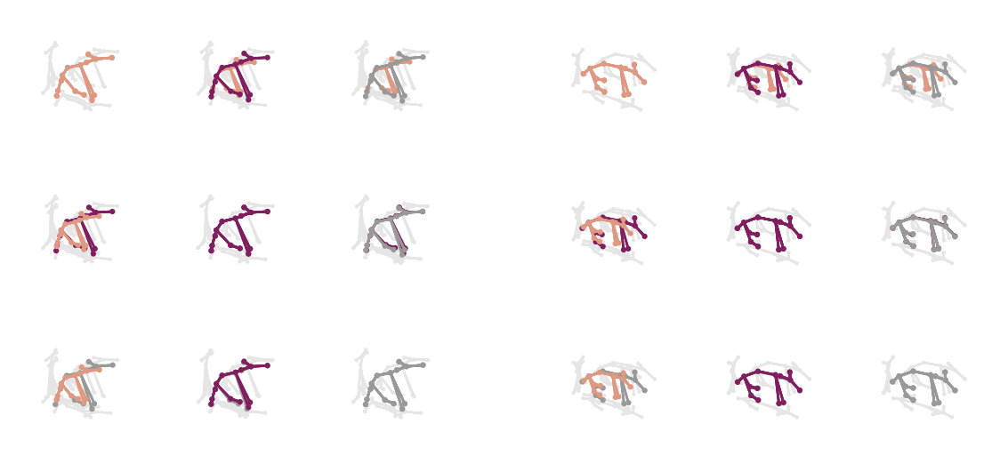

In [74]:
rescale = True


# ---- canonicalize, compute bone lengths of canonical and raw
canonicalized, raw, _ = canonicalized_and_raw(dataset_feats, merged_params, rescale, scale_to=ref_session)
sess_B = f"{tgt_age}wk_m0"
nframes = 2
frames = np.random.default_rng(0).choice(len(canonicalized.get_session(sess_B)), nframes, replace=False)
frames_B = raw.get_session(sess_B)[frames]
frames_A = canonicalized.get_session(sess_B)[frames]
frames_C = remove_angular_morph(frames_A, frames_B, arms)




# ---- plot bone length distributions
bigfig, figs, fig_grid = viz.util.flat_subfig_grid(nframes, min(nframes, 4), ax_size = (2, 2), fig_kw=dict(dpi=300))
for i, (fig, frame_A, frame_B, frame_C) in enumerate(zip(figs, frames_A, frames_B, frames_C)):
    ax_shd = fig.subplots(3, 3, gridspec_kw = dict(hspace = 0.5, wspace = 0.5), subplot_kw=dict(projection='3d'))
    ax_btm = fig.subplots(3, 3, gridspec_kw = dict(hspace = 0.5, wspace = 0.5), subplot_kw=dict(projection='3d'))
    ax_top = fig.subplots(3, 3, gridspec_kw = dict(hspace = 0.5, wspace = 0.5), subplot_kw=dict(projection='3d'))
    
    for j in range(3):
        for k in range(3):
            ax_btm[j, k].sharex(ax_shd[j, k])
            ax_btm[j, k].sharey(ax_shd[j, k])
            ax_btm[j, k].sharez(ax_shd[j, k])
            ax_top[j, k].sharex(ax_shd[j, k])
            ax_top[j, k].sharey(ax_shd[j, k])
            ax_top[j, k].sharez(ax_shd[j, k])
    colors = [ref_color, tgt_color, mpl_col.to_rgba('.6')]
    for j, (frame_btm, clr_btm) in enumerate(zip([frame_A, frame_B, frame_C], colors)):
        for k, (frame_top, clr_top) in enumerate(zip([frame_A, frame_B, frame_C], colors)):
            plotdrop(frame_top, ax_top[j, k], clr_top, 0.15, 0.3, dropax=ax_shd[j, k])
            plotdrop(frame_btm, ax_btm[j, k], clr_btm, 0.15, 0.3, dropax=ax_shd[j, k])
            
plotter.finalize(bigfig, None, despine=False, tight=False)



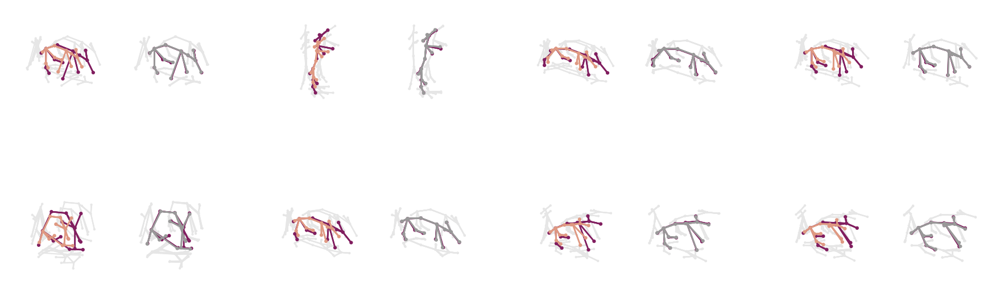

In [75]:
rescale = True


# ---- canonicalize, compute bone lengths of canonical and raw
canonicalized, raw, _ = canonicalized_and_raw(dataset_feats, merged_params, rescale, scale_to=ref_session)
sess_B = f"{tgt_age}wk_m0"
nframes = 8
frames = np.random.default_rng(0).choice(len(canonicalized.get_session(sess_B)), nframes, replace=False)
frames_B = raw.get_session(sess_B)[frames]
frames_A = canonicalized.get_session(sess_B)[frames]
frames_C = remove_angular_morph(frames_A, frames_B, arms)


# ---- plot bone length distributions
bigfig, figs, fig_grid = viz.util.flat_subfig_grid(nframes, min(nframes, 4), ax_size = (1.5, 1), fig_kw=dict(dpi=300))
for i, (fig, frame_A, frame_B, frame_C) in enumerate(zip(figs, frames_A, frames_B, frames_C)):
    ax_shd = fig.subplots(1, 2, gridspec_kw = dict(hspace = 0.), subplot_kw=dict(projection='3d'))
    ax_btm = fig.subplots(1, 2, gridspec_kw = dict(hspace = 0.), subplot_kw=dict(projection='3d'))
    ax_top = fig.subplots(1, 2, gridspec_kw = dict(hspace = 0.), subplot_kw=dict(projection='3d'))
    
    for j in range(2):
        ax_btm[j].sharex(ax_shd[j])
        ax_btm[j].sharey(ax_shd[j])
        ax_btm[j].sharez(ax_shd[j])
        ax_top[j].sharex(ax_shd[j])
        ax_top[j].sharey(ax_shd[j])
        ax_top[j].sharez(ax_shd[j])

    colors = [ref_color, tgt_color, mpl_col.to_rgba('.6')]
    plotdrop(frame_A, ax_top[0], ref_color, 0.15, 0.3, dropax=ax_shd[0])
    plotdrop(frame_B, ax_btm[0], tgt_color, 0.15, 0.3, dropax=ax_shd[0])
    plotdrop(frame_C, ax_top[1], mpl_col.to_rgba('.6'), 0.15, 0.3, dropax=ax_shd[1])
    plotdrop(frame_B, ax_btm[1], tgt_color, 0.15, 0.3, dropax=ax_shd[1])
            
plotter.finalize(bigfig, None, despine=False, tight=False)



#### Keypoint distance summaries

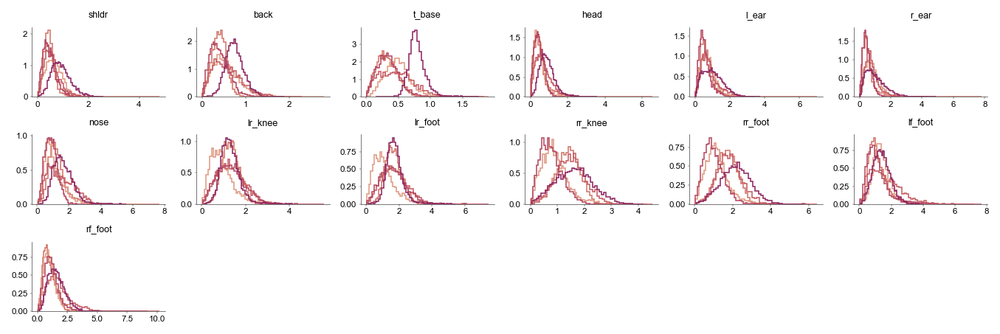

In [118]:
rescale = True


# ---- canonicalize, compute bone lengths of canonical and raw
canonicalized, raw, _ = canonicalized_and_raw(dataset_feats, merged_params, rescale, scale_to=ref_session)
frames_C = {s: remove_angular_morph(canonicalized.get_session(s), raw.get_session(s), arms) for s in dataset_feats.sessions}
dists = {s: model_util.reconst_errs(frames_C[s], raw.get_session(s), average=False) for s in dataset_feats.sessions}
morph_ref = dataset_feats.body_name(merged_params.ref_body)
morph_ref_age = re.search(r"(\d+)wk", morph_ref).group(1)

nohips = [ix for ix, n in arms.keypoint_names.items() if 'hips' not in n]
fig, axes, ax_grid = viz.util.flat_grid(arms.n_kpts - 1, min(6, arms.n_kpts - 1), ax_size = (1.5, 1), dpi=150)
for i, (kp_ix, ax) in enumerate(zip(nohips, axes)):
    ax.set_title(arms.keypoint_names[kp_ix])
    for a, age_sessions in age_groups.items():
        if a == morph_ref_age: continue
        ax.hist(
            np.concatenate([dists[s][:, kp_ix] for s in age_sessions]),
            bins=50, color=age_pal[a], label=a, lw = 0.75, density=True, histtype='step'
        )
    # ax.set_yscale('log')

plotter.finalize(fig, None)

### Pose dependence

*Potential summary figs:*

The clearest takeaway here is that the relative change in bone lengths varies between rearing and non-rearing. To fold that into the paper, it might be nice to generate a simple figure showing 4 poses (after uniform scaling):

- 3wk mouse rearing, 3wk mouse not rearing, 52 wk mouse rearing, 52 wk mouse not rearing

Could also quantify by plotting original/morphed ratios for each bone during rearing vs. not rearing (very similar to plots you have already generated but now putting all the bones in a single panel) but that is less important. I think most important is to show the example poses and then be able to articulate a clear rationale for why the model learns this.

#### Supporting functions

In [20]:
def frame_spherical_morph(frame_A, frame_B, arms):
    """
    Given two frames of keypoints, construct a copy of B with the joint angles
    of A.
    """
    angles_A = _joint_angles(frame_A, arms)
    angles_B = _joint_angles(frame_B, arms)
    lengths_A = _bone_lengths(frame_A, arms)
    lengths_B = _bone_lengths(frame_B, arms)
    return angles_B - angles_A, lengths_B / lengths_A

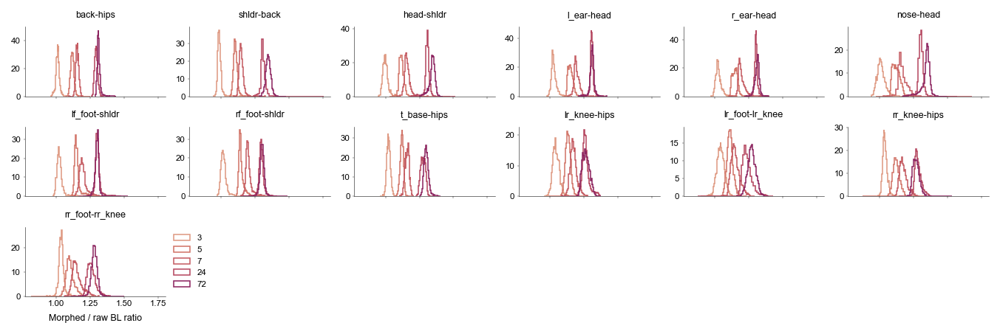

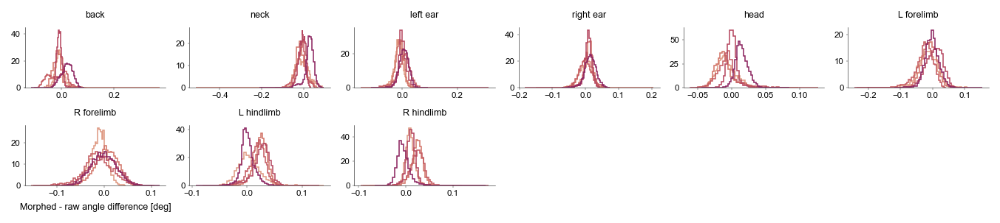

PosixPath('/Users/kaifox/projects/mph/generative_api/test/projects/o2-ont/fit03-3_frames-many_gmm10/models/init-scan_1/panel-plots/posedep_ja_hist.pdf')

In [28]:
rescale = True


# ---- canonicalize, compute bone lengths of canonical and raw
canonicalized, raw, _ = canonicalized_and_raw(dataset_feats, merged_params, rescale, scale_to=ref_session)
spheres = {s: frame_spherical_morph(canonicalized.get_session(s), raw.get_session(s), arms) for s in dataset_feats.sessions}

morph_ref = dataset_feats.body_name(merged_params.ref_body)
morph_ref_age = re.search(r"(\d+)wk", morph_ref).group(1)


fig, axes, ax_grid = viz.util.flat_grid(arms.n_kpts - 1, min(6, arms.n_kpts - 1), ax_size = (1.5, 1), dpi=150, sharex=True)
age_order = sorted(age_groups.keys(), key=lambda x: int(x))
for i, (bname, ax) in enumerate(zip(bone_names, axes)):
    ax.set_title(bname)
    for a in age_order:
        age_sessions = age_groups[a]
        if a == morph_ref_age: continue
        ax.hist(
            np.concatenate([spheres[s][1][:, i] for s in age_sessions]),
            bins=50, color=age_pal[a], label=a, lw = 0.75, density=True, histtype='step'
        )
ax_grid[-1, 0].set_xlabel("Morphed / raw BL ratio")
fig.tight_layout()
viz.util.legend(ax_grid[-1, 0])
plotter.finalize(fig, 'posedep_bl_hist', tight=False)


fig, axes, ax_grid = viz.util.flat_grid(len(joint_names), min(6, len(joint_names)), ax_size = (1.5, 1), dpi=150, sharex=False)
for i, (jname, ax) in enumerate(zip(joint_names, axes)):
    ax.set_title(jname)
    for a in age_order:
        age_sessions = age_groups[a]
        if a == morph_ref_age: continue
        ax.hist(
            np.concatenate([spheres[s][0][:, i] for s in age_sessions]),
            bins=50, color=age_pal[a], label=a, lw = 0.75, density=True, histtype='step'
        )
ax_grid[-1, 0].set_xlabel("Morphed - raw angle difference [deg]")

plotter.finalize(fig, 'posedep_ja_hist')

#### Example frames

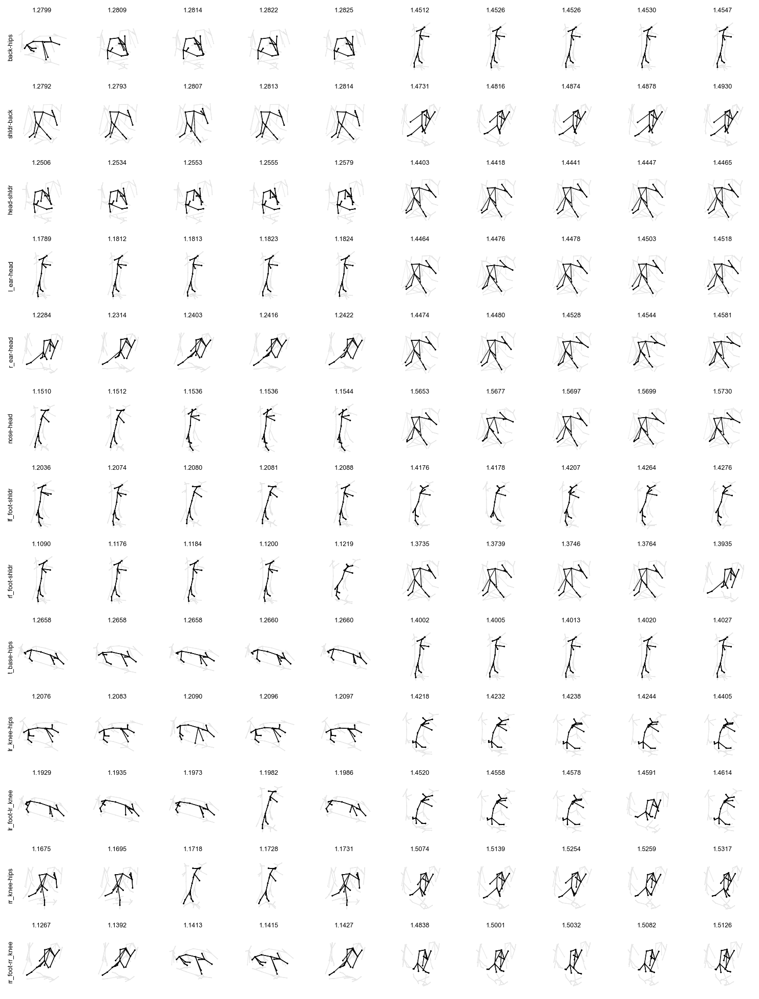

In [36]:
session = '72wk_m0'
morph_ref = dataset_feats.body_name(merged_params.ref_body)
morph_ref_age = re.search(r"(\d+)wk", morph_ref).group(1)
assert morph_ref_age != session_ages[session]

nframes = 5


fig, _, axes = viz.util.flat_grid(nframes * 2 * len(bone_names), nframes * 2, ax_size = (1, 1), subplot_kw=dict(projection='3d'), dpi=150)
for i, (bname, ax_row) in enumerate(zip(bone_names, axes)):
    measure = spheres[session][1][:, i]
    frames_sorted = np.argsort(measure)
    ax_row[0].text2D(-0.1, 0, bname, ha='center', va='center', fontsize=6, rotation = 90)
    for j in range(nframes):
        ax_row[j].set_title(f"{measure[frames_sorted[j]]:.4f}")
        plotdrop(raw.get_session(session)[frames_sorted[j]], ax_row[j], mpl_col.to_rgba('k'), 0.15, 0.3)
        ax_row[-j-1].set_title(f"{measure[frames_sorted[-j-1]]:.4f}")
        plotdrop(raw.get_session(session)[frames_sorted[-j-1]], ax_row[-j-1], mpl_col.to_rgba('k'), 0.15, 0.3)

plotter.finalize(fig, None)

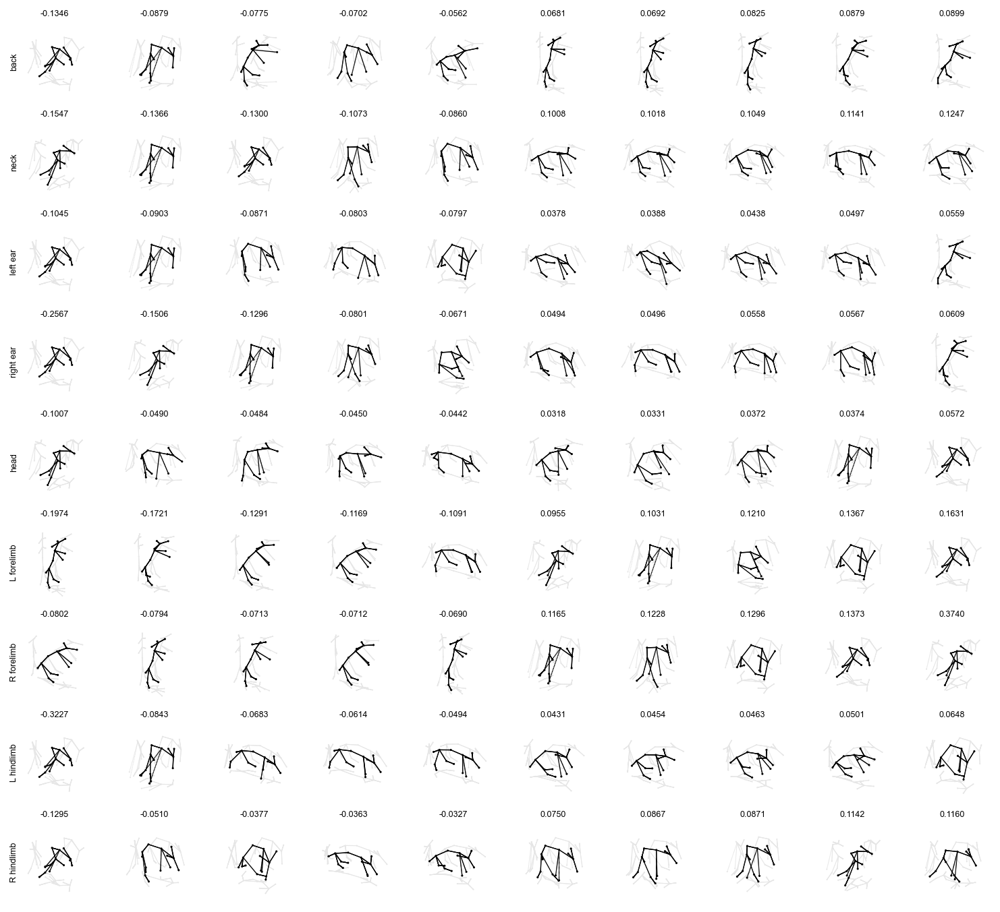

In [154]:
session = '3wk_m0'
morph_ref = dataset_feats.body_name(merged_params.ref_body)
morph_ref_age = re.search(r"(\d+)wk", morph_ref).group(1)
assert morph_ref_age != session_ages[session]

nframes = 5


fig, _, axes = viz.util.flat_grid(nframes * 2 * len(joint_names), nframes * 2, ax_size = (1, 1), subplot_kw=dict(projection='3d'), dpi=150)
for i, (bname, ax_row) in enumerate(zip(joint_names, axes)):
    measure = spheres[session][0][:, i]
    frames_sorted = np.argsort(measure)
    ax_row[0].text2D(-0.1, 0, bname, ha='center', va='center', fontsize=6, rotation = 90)
    for j in range(nframes):
        ax_row[j].set_title(f"{measure[frames_sorted[j]]:.4f}")
        plotdrop(raw.get_session(session)[frames_sorted[j]], ax_row[j], mpl_col.to_rgba('k'), 0.15, 0.3)
        ax_row[-j-1].set_title(f"{measure[frames_sorted[-j-1]]:.4f}")
        plotdrop(raw.get_session(session)[frames_sorted[-j-1]], ax_row[-j-1], mpl_col.to_rgba('k'), 0.15, 0.3)

plotter.finalize(fig, None)

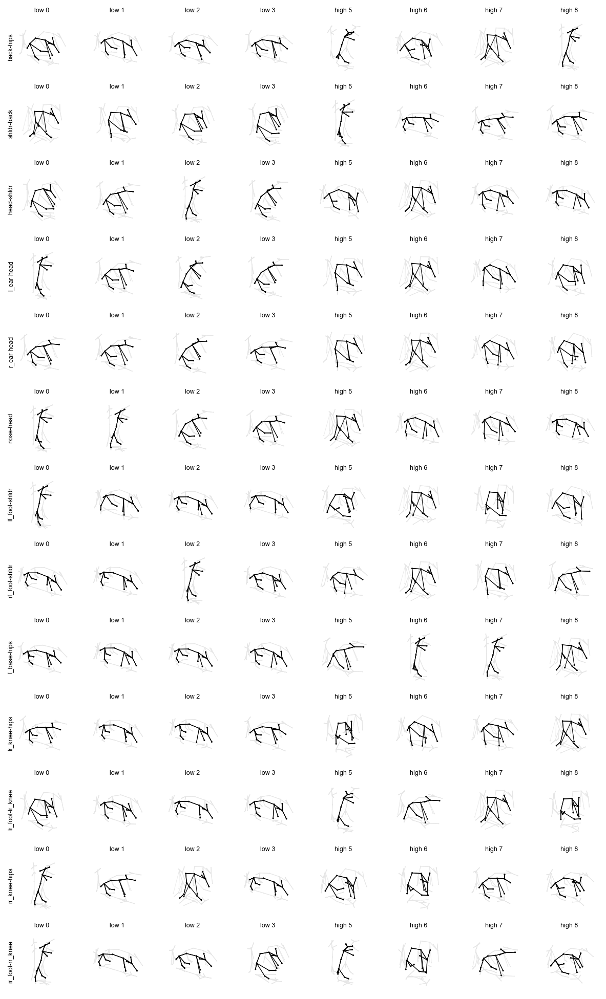

PosixPath('/Users/kaifox/projects/mph/generative_api/test/projects/o2-ont/fit03-0_frames-many_likeligmm/models/init-scan_1/panel-plots/posedep_bl-groups_frames-72wk_m0.pdf')

In [149]:
session = '72wk_m0'
morph_ref = dataset_feats.body_name(merged_params.ref_body)
morph_ref_age = re.search(r"(\d+)wk", morph_ref).group(1)
assert morph_ref_age != session_ages[session]

nframes = int(700 * 0.05)
nclust = 10
ndisp = 4


fig, _, axes = viz.util.flat_grid(ndisp * 2 * len(bone_names), ndisp * 2, ax_size = (1, 1), subplot_kw=dict(projection='3d'), dpi=150)
for i, (bname, ax_row) in enumerate(zip(bone_names, axes)):
    measure = spheres[session][1][:, i]
    frames_sorted = np.argsort(measure)
    frames_lo = raw.get_session(session)[frames_sorted[:nframes]]
    clusts = KMeans(nclust)
    clusts_lo = clusts.fit_predict(frames_lo.reshape(nframes, -1))
    x, counts_lo = np.unique(clusts_lo, return_counts=True)
    disp_lo = clusts.cluster_centers_[x[np.argsort(counts_lo)[-ndisp:]]].reshape(ndisp, -1, 3)
    frames_hi = raw.get_session(session)[frames_sorted[-nframes:]]
    clusts = KMeans(nclust)
    clusts_hi = clusts.fit_predict(frames_hi.reshape(nframes, -1))
    x, counts_hi = np.unique(clusts_hi, return_counts=True)
    disp_hi = clusts.cluster_centers_[x[np.argsort(counts_hi)[-ndisp:]]].reshape(ndisp, -1, 3)

    ax_row[0].text2D(-0.1, 0, bname, ha='center', va='center', fontsize=6, rotation = 90)
    for j in range(ndisp):
        ax_row[j].set_title(f"low {j}")
        plotdrop(disp_lo[j], ax_row[j], mpl_col.to_rgba('k'), 0.15, 0.3)
        ax_row[-j-1].set_title(f"high {ndisp*2-j}")
        plotdrop(disp_hi[-j-1], ax_row[-j-1], mpl_col.to_rgba('k'), 0.15, 0.3)

plotter.finalize(fig, f'posedep_bl-groups_frames-{session}')

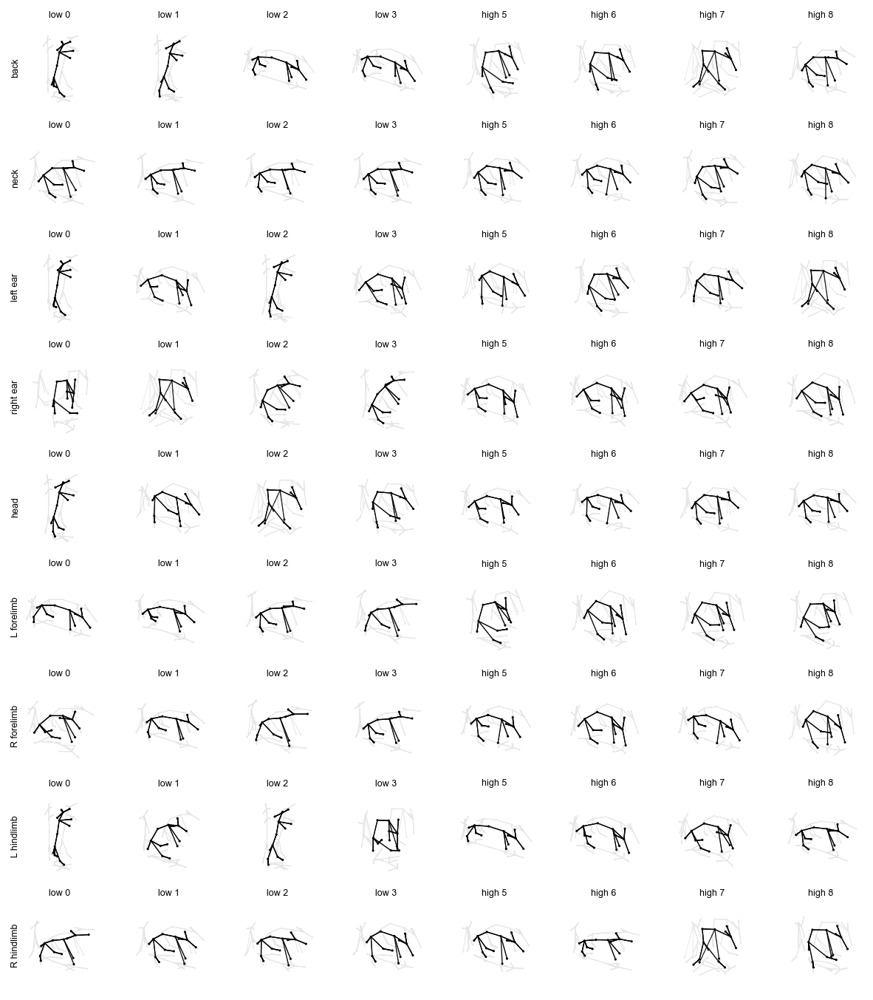

PosixPath('/Users/kaifox/projects/mph/generative_api/test/projects/o2-ont/fit03-0_frames-many_likeligmm/models/init-scan_1/panel-plots/posedep_ja-groups_frames-72wk_m0.pdf')

In [154]:
session = '72wk_m0'
morph_ref = dataset_feats.body_name(merged_params.ref_body)
morph_ref_age = re.search(r"(\d+)wk", morph_ref).group(1)
assert morph_ref_age != session_ages[session]

nframes = int(700 * 0.05)
nclust = 10
ndisp = 4


fig, _, axes = viz.util.flat_grid(ndisp * 2 * len(joint_names), ndisp * 2, ax_size = (1, 1), subplot_kw=dict(projection='3d'), dpi=150)
for i, (bname, ax_row) in enumerate(zip(joint_names, axes)):
    measure = spheres[session][0][:, i]
    frames_sorted = np.argsort(measure)
    frames_lo = raw.get_session(session)[frames_sorted[:nframes]]
    clusts = KMeans(nclust)
    clusts_lo = clusts.fit_predict(frames_lo.reshape(nframes, -1))
    x, counts_lo = np.unique(clusts_lo, return_counts=True)
    disp_lo = clusts.cluster_centers_[x[np.argsort(counts_lo)[-ndisp:]]].reshape(ndisp, -1, 3)
    frames_hi = raw.get_session(session)[frames_sorted[-nframes:]]
    clusts = KMeans(nclust)
    clusts_hi = clusts.fit_predict(frames_hi.reshape(nframes, -1))
    x, counts_hi = np.unique(clusts_hi, return_counts=True)
    disp_hi = clusts.cluster_centers_[x[np.argsort(counts_hi)[-ndisp:]]].reshape(ndisp, -1, 3)

    ax_row[0].text2D(-0.1, 0, bname, ha='center', va='center', fontsize=6, rotation = 90)
    for j in range(ndisp):
        ax_row[j].set_title(f"low {j}")
        plotdrop(disp_lo[j], ax_row[j], mpl_col.to_rgba('k'), 0.15, 0.3)
        ax_row[-j-1].set_title(f"high {ndisp*2-j}")
        plotdrop(disp_hi[-j-1], ax_row[-j-1], mpl_col.to_rgba('k'), 0.15, 0.3)

plotter.finalize(fig, 'posedep_ja-groups_frames-72wk_m0')

#### Reliability of relatively high and low frames

In [66]:
nframes = int(30000 * 0.01)
frames = []
bls_z = []
bls_q = []
ages = []
ids = []
session_ids = []
bone = []
hilo = []

def quantileofscore(x):
    ret = np.zeros(x.shape)
    ret[np.argsort(x)] = np.linspace(0, 1, len(x)+1)[1:] - (1/len(x)/2)
    return ret
age_groups = {a: [s for s in dataset_feats.sessions if session_ages[s] == a] for a in set(session_ages.values())}
age_order = sorted(list(age_groups.keys()), key=lambda x: int(x))

_canonicalized, _raw, _ = canonicalized_and_raw(scan_dataset_full, params.morph, rescale=True, scale_to=ref_session)
_spheres = {s: frame_spherical_morph(_canonicalized.get_session(s), _raw.get_session(s), arms) for s in dataset_feats.sessions}
morph_ref = scan_dataset.body_name(merged_params.ref_body)
morph_ref_age = re.search(r"(\d+)wk", morph_ref).group(1)
back_ix = [bone_names.index(b) for b in ['back-hips', 'shldr-back']]

# for i, (bname) in enumerate(bone_names):
for session in dataset_feats.sessions:
    if session_ages[session] == morph_ref_age: continue
    animal_id = re.search(r"m(\d+)", session).group(1)

    measure = _spheres[session][1][:, back_ix].mean(axis = 1) # bone lengths
    # measure = _spheres[session][1][:, i] # bone lengths
    frames_sorted = np.argsort(measure)
    ixs = np.concatenate([frames_sorted[:nframes], frames_sorted[-nframes:]])
    measure_z = (measure - measure.mean()) / measure.std()
    measure_q = quantileofscore(measure)

    frames.append(_canonicalized.get_session(session)[ixs])
    bls_z.append(measure_z[ixs])
    bls_q.append(measure_q[ixs])
    ages.append(np.full(nframes * 2, session_ages[session]))
    ids.append(np.full(nframes * 2, int(animal_id)))
    bone.append(np.full(nframes * 2, bname))
    hilo.append(np.concatenate([np.full(nframes, 0), np.full(nframes, 1)]))
    session_ids.append(np.full(nframes * 2, dataset_feats.session_id(session)))

shared_pc = PCA(n_components=4).fit(_canonicalized._data.reshape(-1, arms.n_kpts * 3))
frames_pc = shared_pc.transform(np.concatenate(frames).reshape(-1, arms.n_kpts * 3))
df = pd.DataFrame(dict(
    z = np.concatenate(bls_z),
    q = np.concatenate(bls_q),
    age = np.concatenate(ages),
    id = np.concatenate(ids),
    session_id = np.concatenate(session_ids),
    hilo = np.concatenate(hilo),
    bone = np.concatenate(bone),
    **{f"pc{i}": frames_pc[:, i] for i in range(4)}
))


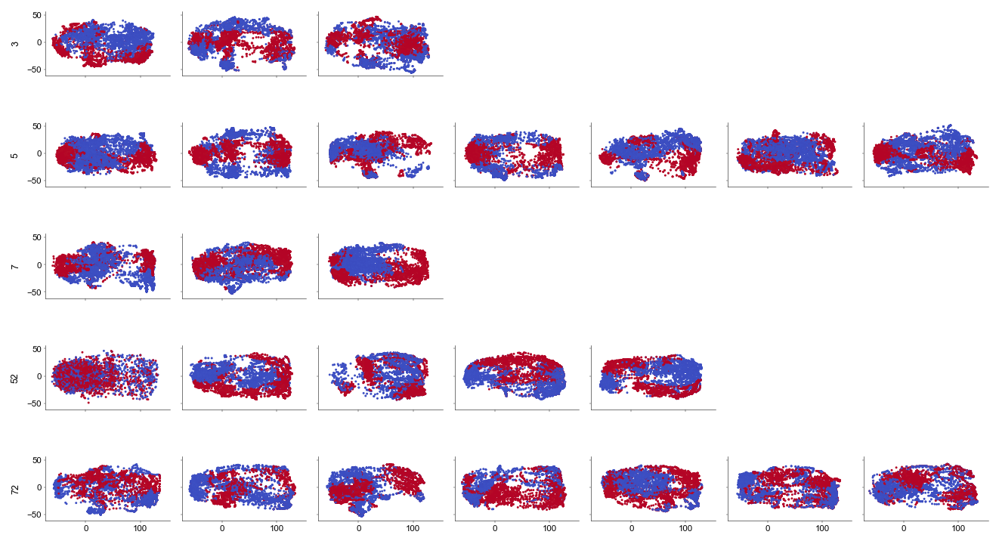

In [60]:
fig, ax = plt.subplots(len(age_groups) - 1, df.id.max() + 1, figsize = (10, 5), dpi=150, sharex=True, sharey=True)
for i, a in enumerate([a for a in age_order if a != morph_ref_age]):
    d = df[df.age == a]
    for j in d.id.unique():
        f = d[d.id == j]
        ax[i, j].scatter(f.pc0, f.pc1, c=f.q, s=2, cmap='coolwarm', lw=0)
        ax[i, j].set_aspect('equal')
    for j in range(d.id.max(), ax.shape[1]):
        ax[i, j].set_visible(False)
    ax[i, 0].set_ylabel(a)
plotter.finalize(fig, None)

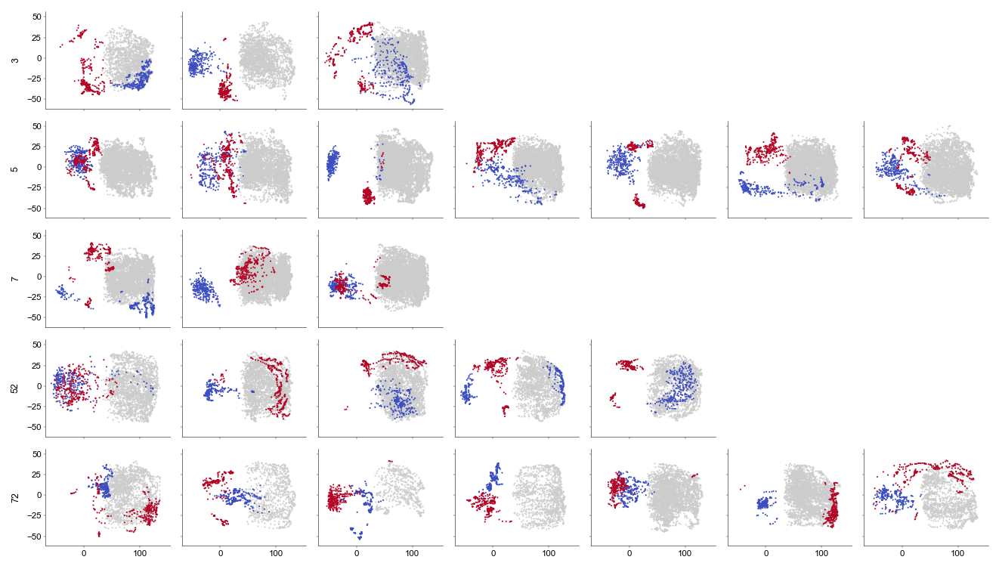

In [67]:
fig, ax = plt.subplots(len(age_groups) - 1, df.id.max() + 1, figsize = (10, 5), dpi=150, sharex=True, sharey=True)
for i, a in enumerate([a for a in age_order if a != morph_ref_age]):
    d = df[df.age == a]
    for j in d.id.unique():
        f = d[d.id == j]
        session_id = f.session_id.values[0]
        session = dataset_feats.session_name(session_id)
        
        x = shared_pc.transform(_canonicalized.get_session(session).reshape(-1, arms.n_kpts * 3))
        ax[i, j].scatter(*x[bhv_masks['rear'][session]][:, [0, 1]].T, s=1, lw=0, color = '.8')
        ax[i, j].scatter(f.pc0, f.pc1, c=f.q, s=1, cmap='coolwarm', lw=0)
    for j in range(d.id.max(), ax.shape[1]):
        ax[i, j].set_visible(False)
    ax[i, 0].set_ylabel(a)
plotter.finalize(fig, None)

3 back-hips 0 0
3 shldr-back 0 0
3 head-shldr 0 0
3 l_ear-head 0 0
3 r_ear-head 0 0
3 nose-head 0 0
3 lf_foot-shldr 0 0
3 rf_foot-shldr 0 0
3 t_base-hips 0 0
3 lr_knee-hips 0 0
3 lr_foot-lr_knee 0 0
3 rr_knee-hips 0 0
3 rr_foot-rr_knee 1200 1200
5 back-hips 0 0
5 shldr-back 0 0
5 head-shldr 0 0
5 l_ear-head 0 0
5 r_ear-head 0 0
5 nose-head 0 0
5 lf_foot-shldr 0 0
5 rf_foot-shldr 0 0
5 t_base-hips 0 0
5 lr_knee-hips 0 0
5 lr_foot-lr_knee 0 0
5 rr_knee-hips 0 0
5 rr_foot-rr_knee 2400 2400
7 back-hips 0 0
7 shldr-back 0 0
7 head-shldr 0 0
7 l_ear-head 0 0
7 r_ear-head 0 0
7 nose-head 0 0
7 lf_foot-shldr 0 0
7 rf_foot-shldr 0 0
7 t_base-hips 0 0
7 lr_knee-hips 0 0
7 lr_foot-lr_knee 0 0
7 rr_knee-hips 0 0
7 rr_foot-rr_knee 1200 1200
52 back-hips 0 0
52 shldr-back 0 0
52 head-shldr 0 0
52 l_ear-head 0 0
52 r_ear-head 0 0
52 nose-head 0 0
52 lf_foot-shldr 0 0
52 rf_foot-shldr 0 0
52 t_base-hips 0 0
52 lr_knee-hips 0 0
52 lr_foot-lr_knee 0 0
52 rr_knee-hips 0 0
52 rr_foot-rr_knee 1800 1800
72 

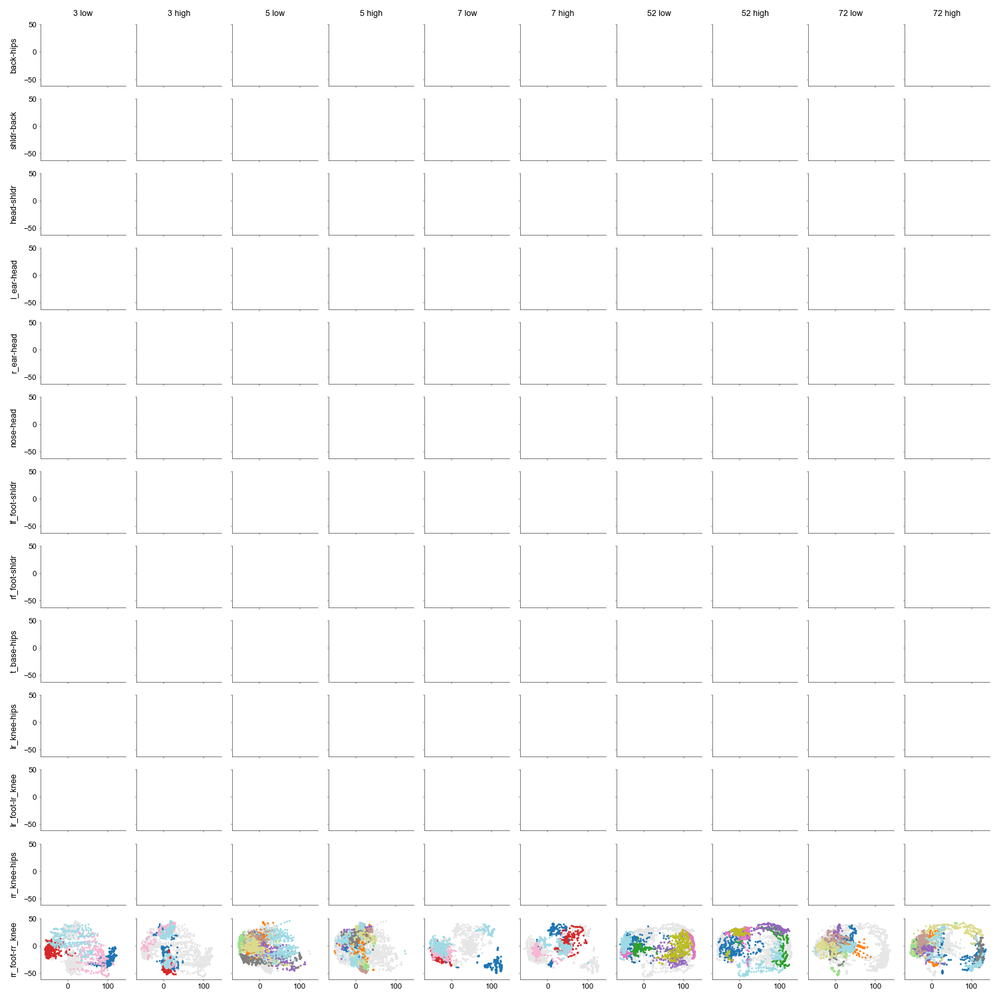

In [68]:
fig, axes = plt.subplots(len(bone_names), 2*(len(age_groups) - 1), figsize = (10, 10), dpi=150, sharex=True, sharey=True)

for i, (a, (ax_lo, ax_hi)) in enumerate(zip([a for a in age_order if a != morph_ref_age], axes.T.reshape(len(age_groups) - 1, 2, -1))):
    for j, bname in enumerate(bone_names):
        d = df[(df.age == a) & (df.bone == bname)]
        dhi = d[d.hilo == 1]
        dlo = d[d.hilo == 0]
        print(a, bname, len(dlo), len(dhi))
        cmap = Colormap('tab20').to_mpl()
        ax_lo[j].scatter(dhi.pc0, dhi.pc1, c='.9', s=2, lw=0)
        ax_lo[j].scatter(dlo.pc0, dlo.pc1, c=dlo.id, s=2, cmap=cmap, lw=0)
        ax_hi[j].scatter(dlo.pc0, dlo.pc1, c='.9', s=2, lw=0)
        ax_hi[j].scatter(dhi.pc0, dhi.pc1, c=dhi.id, s=2, cmap=cmap, lw=0)
        if j == 0:
            ax_lo[j].set_title(f"{a} low")
            ax_hi[j].set_title(f"{a} high")
        if i == 0:
            ax_lo[j].set_ylabel(bname)
plotter.finalize(fig, 'posedep_bl-group_pc-animal-id_non-shared', save=False)

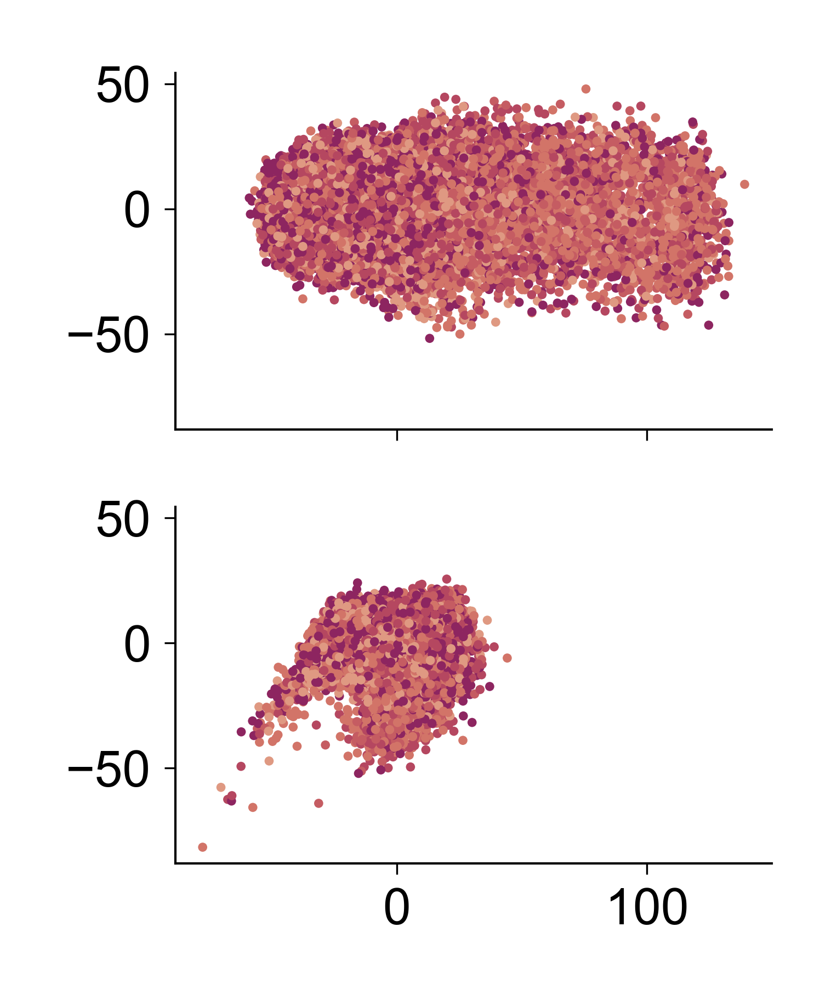

PosixPath('/Users/kaifox/projects/mph/generative_api/test/projects/o2-ont/fit03-0_frames-many_likeligmm/models/init-scan_1/panel-plots/posedep_bl-group_pc-age-base.pdf')

In [184]:
all_pc = shared_pc.transform(canonicalized._data.reshape(-1, arms.n_kpts * 3))
fig, ax = plt.subplots(2, 1, figsize = (2, 1.5), dpi=1200, sharex=True, sharey=True)
c = np.zeros([len(all_pc), 4])
for i, (a) in enumerate([a for a in age_order if a != morph_ref_age]):
    for session in age_groups[a]:
        slc = dataset_feats.get_slice(session)
        c[slc[0]:slc[1]] = age_pal[a]
        
shf = np.random.permutation(len(all_pc)) 
ax[0].scatter(all_pc[shf, 0], all_pc[shf, 1], color=c[shf], s=1, lw=0, zorder=-2, rasterized=True)
ax[1].scatter(all_pc[shf, 2], all_pc[shf, 3], color=c[shf], s=1, lw=0, zorder=-2, rasterized=True)
ax[0].set_aspect('equal')
ax[1].set_aspect('equal')
        
plotter.finalize(fig, 'posedep_bl-group_pc-age-base')

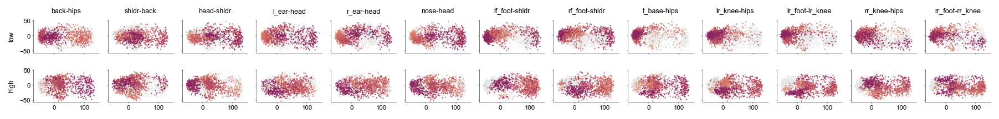

PosixPath('/Users/kaifox/projects/mph/generative_api/test/projects/o2-ont/fit03-0_frames-many_likeligmm/models/init-scan_1/panel-plots/posedep_bl-group_pc-age.pdf')

In [181]:
fig, ax = plt.subplots(2, len(bone_names), figsize = (12, 1.5), dpi=150, sharex=True, sharey=True)
for i, (a) in enumerate([a for a in age_order if a != morph_ref_age]):
    for j, bname in enumerate(bone_names):
        d = df[(df.age == a) & (df.bone == bname)]
        dhi = d[d.hilo == 1]
        dlo = d[d.hilo == 0]
        ax[0, j].scatter(dhi.pc0, dhi.pc1, c='.9', s=1, lw=0, zorder=-2)
        ax[0, j].scatter(dlo.pc0, dlo.pc1, color=age_pal[a], s=1, lw=0)
        ax[1, j].scatter(dlo.pc0, dlo.pc1, c='.9', s=1, lw=0, zorder=-2)
        ax[1, j].scatter(dhi.pc0, dhi.pc1, color=age_pal[a], s=1, lw=0)
        if j == 0:
            ax[0, j].set_ylabel(f"low")
            ax[1, j].set_ylabel(f"high")
        if i == 0:
            ax[0, j].set_title(bname)
        ax[0, j].set_aspect(1.)
        ax[1, j].set_aspect(1.)
plotter.finalize(fig, 'posedep_bl-group_pc-age')

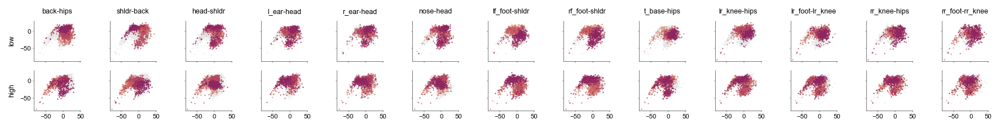

PosixPath('/Users/kaifox/projects/mph/generative_api/test/projects/o2-ont/fit03-0_frames-many_likeligmm/models/init-scan_1/panel-plots/posedep_bl-group_pc-23-age.pdf')

In [182]:
fig, ax = plt.subplots(2, len(bone_names), figsize = (12, 1.5), dpi=150, sharex=True, sharey=True)
for i, (a) in enumerate([a for a in age_order if a != morph_ref_age]):
    for j, bname in enumerate(bone_names):
        d = df[(df.age == a) & (df.bone == bname)]
        dhi = d[d.hilo == 1]
        dlo = d[d.hilo == 0]
        ax[0, j].scatter(dhi.pc2, dhi.pc3, c='.9', s=1, lw=0, zorder=-2)
        ax[0, j].scatter(dlo.pc2, dlo.pc3, color=age_pal[a], s=1, lw=0)
        ax[1, j].scatter(dlo.pc2, dlo.pc3, c='.9', s=1, lw=0, zorder=-2)
        ax[1, j].scatter(dhi.pc2, dhi.pc3, color=age_pal[a], s=1, lw=0)
        if j == 0:
            ax[0, j].set_ylabel(f"low")
            ax[1, j].set_ylabel(f"high")
        if i == 0:
            ax[0, j].set_title(bname)
        ax[0, j].set_aspect(1.)
        ax[1, j].set_aspect(1.)
plotter.finalize(fig, 'posedep_bl-group_pc-23-age')

#### Relationship to supervised behavior labels

In [178]:
dataset_feats_full.get_session('3wk_m0').shape

(700, 13)

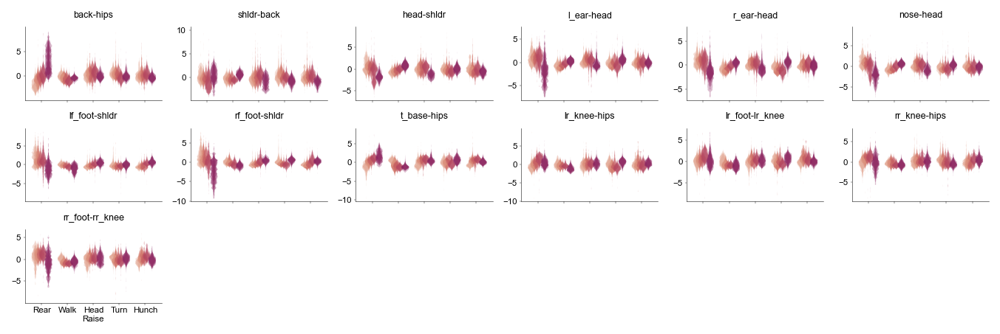

In [239]:
rescale = False


# ---- canonicalize, compute bone lengths of canonical and raw
canonicalized, raw, _ = canonicalized_and_raw(dataset_feats_full, merged_params, rescale, scale_to=ref_session)
spheres = {s: frame_spherical_morph(canonicalized.get_session(s), raw.get_session(s), arms) for s in dataset_feats.sessions}

morph_ref = dataset_feats.body_name(merged_params.ref_body)
morph_ref_age = re.search(r"(\d+)wk", morph_ref).group(1)
bhv_order = list(bhv_keys.keys())
sub_to = lambda x, n: x[::int(np.ceil(len(x)/n))][:n]
no_z_outs = lambda x: x[abs(x) < 10]

fig, axes, ax_grid = viz.util.flat_grid((arms.n_kpts - 1), min(6, arms.n_kpts - 1), ax_size = (1.5, 1), dpi=150, sharex=True)
for i, (bname, ax) in enumerate(zip(bone_names, axes)):
    ax.set_title(bname)
    for a, age_sessions in age_groups.items():
        age_order = sorted(list(age_groups.keys()), key=lambda x: int(x))
        i_age = age_order.index(a)
        if a == morph_ref_age: continue
        for s in age_sessions:
            animal_z = (spheres[s][1][:, i] - np.mean(spheres[s][1][:, i])) / np.std(spheres[s][1][:, i])
            viz.util.grouped_violins(
                [[sub_to(no_z_outs(animal_z[bhv_masks[k][s]]), 190)] for k in bhv_order],
                bw = 0.2,
                x=np.arange(len(bhv_order)) + viz.util.get_offsets(len(age_groups), i_age),
                ax = ax,
                colors=tuple(age_pal[a])[:3] + (0.3,),
                points=False,
                jitter=0.,
                width=0.3,
                stroke=False,
                errorbar=False,
                fill=True,
            )
    ax.set_xticks(range(len(bhv_order)))
    ax.set_xticklabels([bhv_names[k] for k in bhv_order])
            

plotter.finalize(fig, None)

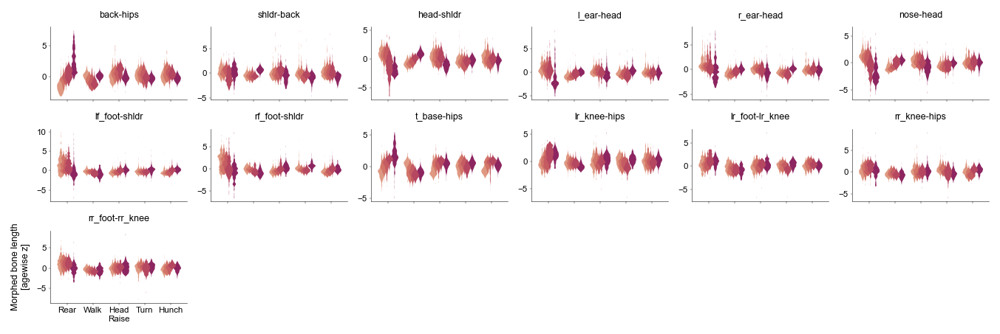

PosixPath('/Users/kaifox/projects/mph/generative_api/test/projects/o2-ont/fit03-2_frames-many_gmm10/models/init-scan_1/panel-plots/posedep_bl-group_z-by-bhv-age.pdf')

In [38]:
rescale = False


# ---- canonicalize, compute bone lengths of canonical and raw
canonicalized, raw, _ = canonicalized_and_raw(dataset_feats_full, merged_params, rescale, scale_to=ref_session)
spheres = {s: frame_spherical_morph(canonicalized.get_session(s), raw.get_session(s), arms) for s in dataset_feats.sessions}

morph_ref = dataset_feats.body_name(merged_params.ref_body)
morph_ref_age = re.search(r"(\d+)wk", morph_ref).group(1)
bhv_order = list(bhv_keys.keys())
sub_to = lambda x, n: x[::int(np.ceil(len(x)/n))][:n]
no_z_outs = lambda x: x[abs(x) < 10]

fig, axes, ax_grid = viz.util.flat_grid((arms.n_kpts - 1), min(6, arms.n_kpts - 1), ax_size = (1.5, 1), dpi=150, sharex=True)
for i, (bname, ax) in enumerate(zip(bone_names, axes)):
    ax.set_title(bname)
    for a, age_sessions in age_groups.items():
        age_order = sorted(list(age_groups.keys()), key=lambda x: int(x))
        i_age = age_order.index(a)
        if a == morph_ref_age: continue
        measure = np.concatenate([spheres[s][1][:, i] for s in age_sessions])
        mask = {k: np.concatenate([bhv_masks[k][s] for s in age_sessions]) for k in bhv_order}
        measure_z = (measure - np.mean(measure)) / np.std(measure)
        
        viz.util.grouped_violins(
            [[sub_to(no_z_outs(measure_z[mask[k]]), 190)] for k in bhv_order],
            bw = 0.2,
            x=np.arange(len(bhv_order)) + viz.util.get_offsets(len(age_groups), i_age),
            ax = ax,
            colors=age_pal[a],
            points=False,
            jitter=0.,
            width=0.3,
            stroke=False,
            errorbar=False,
            fill=True,
        )
    ax.set_xticks(range(len(bhv_order)))
    ax.set_xticklabels([bhv_names[k] for k in bhv_order])
ax_grid[-1, 0].set_ylabel("Morphed bone length\n[agewise z]")

plotter.finalize(fig, 'posedep_bl-group_z-by-bhv-age')

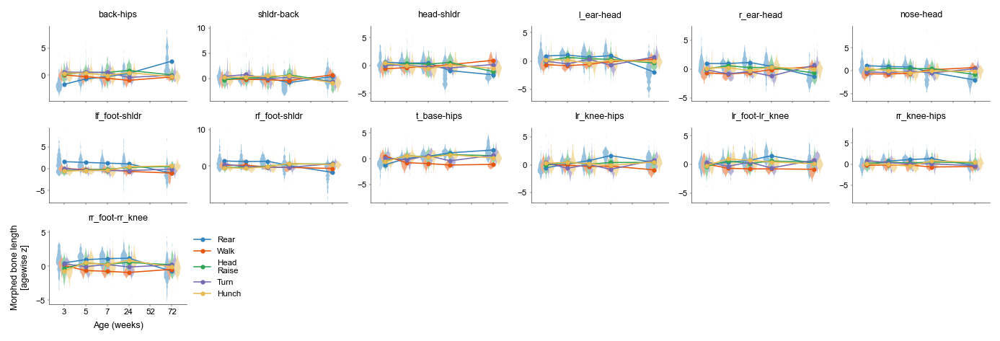

PosixPath('/Users/kaifox/projects/mph/generative_api/test/projects/o2-ont/fit03-0_frames-many_likeligmm/models/init-scan_1/panel-plots/posedep_bl-group_z-by-age-bhv.pdf')

In [151]:
rescale = True


# ---- canonicalize, compute bone lengths of canonical and raw
canonicalized, raw, _ = canonicalized_and_raw(dataset_feats_full, merged_params, rescale, scale_to=ref_session)
spheres = {s: frame_spherical_morph(canonicalized.get_session(s), raw.get_session(s), arms) for s in dataset_feats.sessions}

morph_ref = dataset_feats.body_name(merged_params.ref_body)
morph_ref_age = re.search(r"(\d+)wk", morph_ref).group(1)
bhv_order = list(bhv_keys.keys())
sub_to = lambda x, n: x[::int(np.ceil(len(x)/n))][:n]
no_z_outs = lambda x: x[abs(x) < 10]

fig, axes, ax_grid = viz.util.flat_grid((arms.n_kpts - 1), min(6, arms.n_kpts - 1), ax_size = (1.5, 1), dpi=150, sharex=True)
for i, (bname, ax) in enumerate(zip(bone_names, axes)):
    means = {k: [] for k in bhv_order}

    ax.set_title(bname)
    for a, age_sessions in age_groups.items():
        age_order = sorted(list(age_groups.keys()), key=lambda x: int(x))
        i_age = age_order.index(a)
        if a == morph_ref_age: continue
        measure = np.concatenate([spheres[s][1][:, i] for s in age_sessions])
        mask = {k: np.concatenate([bhv_masks[k][s] for s in age_sessions]) for k in bhv_order}
        measure_z = (measure - np.mean(measure)) / np.std(measure)
        
        for j, k in enumerate(bhv_order):
            viz.util.grouped_violins(
                [[sub_to(no_z_outs(measure_z[mask[k]]), 190)]],
                bw = 0.2,
                x=[viz.util.get_offsets(len(bhv_order), j) + i_age],
                ax = ax,
                colors=viz.util.lighten(bhv_pal[k], 0.5),
                points=False,
                jitter=0.,
                width=0.3,
                stroke=False,
                errorbar=False,
                fill=True,
            )
            means[k].append((i_age, np.mean(measure_z[mask[k]])))
    ax.set_xticks(range(len(age_order)))
    ax.set_xticklabels(age_order)

    for j, k in enumerate(bhv_order):
        x = sorted(means[k], key=lambda x: int(x[0]))
        ax.plot(
            *zip(*x),
            color=bhv_pal[k],
            lw=0.75,
            marker='o',
            mew=0,
            ms = 3,
            label=bhv_names[k]
        )
fig.tight_layout()
viz.util.legend(axes[-1])
ax_grid[-1, 0].set_xlabel("Age (weeks)")
ax_grid[-1, 0].set_ylabel("Morphed bone length\n[agewise z]")
            

plotter.finalize(fig, 'posedep_bl-group_z-by-age-bhv', tight=False)

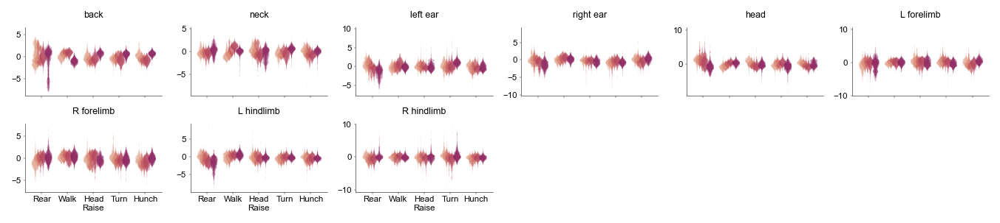

In [240]:
rescale = False


# ---- canonicalize, compute bone lengths of canonical and raw
canonicalized, raw, _ = canonicalized_and_raw(dataset_feats_full, merged_params, rescale, scale_to=ref_session)
spheres = {s: frame_spherical_morph(canonicalized.get_session(s), raw.get_session(s), arms) for s in dataset_feats.sessions}

morph_ref = dataset_feats.body_name(merged_params.ref_body)
morph_ref_age = re.search(r"(\d+)wk", morph_ref).group(1)
bhv_order = list(bhv_keys.keys())
sub_to = lambda x, n: x[::int(np.ceil(len(x)/n))][:n]
no_z_outs = lambda x: x[abs(x) < 10]

fig, axes, ax_grid = viz.util.flat_grid((len(joint_names)), min(6, len(joint_names)), ax_size = (1.5, 1), dpi=150, sharex=True)
for i, (bname, ax) in enumerate(zip(joint_names, axes)):
    ax.set_title(bname)
    for a, age_sessions in age_groups.items():
        age_order = sorted(list(age_groups.keys()), key=lambda x: int(x))
        i_age = age_order.index(a)
        if a == morph_ref_age: continue
        for s in age_sessions:
            animal_z = (spheres[s][0][:, i] - np.mean(spheres[s][0][:, i])) / np.std(spheres[s][0][:, i])
            viz.util.grouped_violins(
                [[sub_to(no_z_outs(animal_z[bhv_masks[k][s]]), 190)] for k in bhv_order],
                bw = 0.2,
                x=np.arange(len(bhv_order)) + viz.util.get_offsets(len(age_groups), i_age),
                ax = ax,
                colors=tuple(age_pal[a])[:3] + (0.3,),
                points=False,
                jitter=0.,
                width=0.3,
                stroke=False,
                errorbar=False,
                fill=True,
            )
    ax.set_xticks(range(len(bhv_order)))
    ax.set_xticklabels([bhv_names[k] for k in bhv_order])
            

plotter.finalize(fig, None)


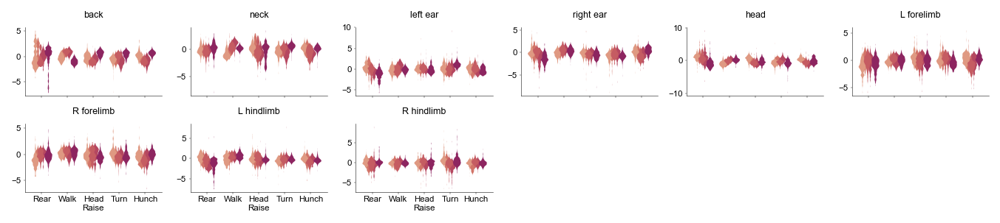

In [19]:
rescale = False


# ---- canonicalize, compute bone lengths of canonical and raw
canonicalized, raw, _ = canonicalized_and_raw(dataset_feats_full, merged_params, rescale, scale_to=ref_session)
spheres = {s: frame_spherical_morph(canonicalized.get_session(s), raw.get_session(s), arms) for s in dataset_feats.sessions}

morph_ref = dataset_feats.body_name(merged_params.ref_body)
morph_ref_age = re.search(r"(\d+)wk", morph_ref).group(1)
bhv_order = list(bhv_keys.keys())
sub_to = lambda x, n: x[::int(np.ceil(len(x)/n))][:n]
no_z_outs = lambda x: x[abs(x) < 10]

fig, axes, ax_grid = viz.util.flat_grid((len(joint_names)), min(6, len(joint_names)), ax_size = (1.5, 1), dpi=150, sharex=True)
for i, (bname, ax) in enumerate(zip(joint_names, axes)):
    ax.set_title(bname)
    for a, age_sessions in age_groups.items():
        age_order = sorted(list(age_groups.keys()), key=lambda x: int(x))
        i_age = age_order.index(a)
        if a == morph_ref_age: continue
        measure = np.concatenate([spheres[s][0][:, i] for s in age_sessions])
        mask = {k: np.concatenate([bhv_masks[k][s] for s in age_sessions]) for k in bhv_order}
        measure_z = (measure - np.mean(measure)) / np.std(measure)
        
        viz.util.grouped_violins(
            [[sub_to(no_z_outs(measure_z[mask[k]]), 190)] for k in bhv_order],
            bw = 0.2,
            x=np.arange(len(bhv_order)) + viz.util.get_offsets(len(age_groups), i_age),
            ax = ax,
            colors=age_pal[a],
            points=False,
            jitter=0.,
            width=0.3,
            stroke=False,
            errorbar=False,
            fill=True,
        )
    ax.set_xticks(range(len(bhv_order)))
    ax.set_xticklabels([bhv_names[k] for k in bhv_order])
            

plotter.finalize(fig, None)

array([0.7, 0.1, 0.9, 0.3, 0.5])

#### Approximate fixed length morph

In [30]:
_align_meta = {"scale": np.array(align_meta["scale"])}
# to body of 52wk_m0 (reference animal), then to its raw data scale (both
# canonicalized and raw data)
scale_to = dataset_feats.session_name(dataset_feats.ref_session)
print(scale_to)
canonicalized, raw, _ = canonicalized_and_raw(
    dataset_feats, merged_params, rescale=True, scale_to=scale_to
)
_, rigid, _ = canonicalized_and_raw(
    dataset_feats, merged_params, rescale=False
)
ages = [ref_age] + tgt_ages
age_groups = {
    a: [ s for s in dataset_feats.sessions if re.search(r"(\d+)wk", s).group(1) == a ]
    for a in ages
}

# skeletal parameterization of canonicalized and raw frames
roots_canon, bones_canon, ls_mat = blscale_ls.roots_and_bones({s: canonicalized.get_session(s) for s in dataset_feats.sessions}, arms.bones, arms.keypoint_names.inverse[arms.root])
roots_raw, bones_raw, _ = blscale_ls.roots_and_bones({s: raw.get_session(s) for s in dataset_feats.sessions}, arms.bones, arms.keypoint_names.inverse[arms.root])
bl_ratios = {s: (np.linalg.norm(bones_canon[s], axis = -1) / np.linalg.norm(bones_raw[s], axis = -1)) for s in dataset_feats.sessions}
fixed_bl_ratios = {s: bl_ratios[s].mean(axis = 0) for s in dataset_feats.sessions}
# 52wk pose scaled by fixed bone length onto "3wk"
# (bl ratios = length(raw) / length(canon))
bones_canon_raw_length = {
    s: bones_canon[s] * np.linalg.norm(bones_raw[s], axis = -1, keepdims=True) / np.linalg.norm(bones_canon[s], axis = -1, keepdims=True)
    for s in dataset_feats.sessions}
bones_poseind_canon = {s: bones_canon_raw_length[s] * fixed_bl_ratios[s][None, :, None] for s in dataset_feats.sessions}
# bones_poseind_canon = {s: bones_canon[s] / (1/bl_ratios[s][:, :, None]) * (1/fixed_bl_ratios[s][None, :, None]) for s in dataset_feats.sessions}
frames_C = {
    s: blscale_ls.inverse_transform(
        roots_canon[s], bones_poseind_canon[s], ls_mat
    )
    for s in dataset_feats.sessions
}

# --- measure JSDs to reference session aross each
jsds = {}
from shape_norm import clouds
for k, kpts in {
    "raw": {s: raw.get_session(s) for s in dataset_feats.sessions},
    "canon": {s: canonicalized.get_session(s) for s in dataset_feats.sessions},
    "rigid": {s: rigid.get_session(s) for s in dataset_feats.sessions},
    "fixie": frames_C,
}.items():
    feats = {
        s: features.reduce_to_features(a, cfg["features"])
        for s, a in kpts.items()
    }
    ref_cloud = clouds.PointCloudDensity(k=15).fit(feats[scale_to])
    jsds[k] = np.array(
        [
            clouds.ball_cloud_js(
                ref_cloud, clouds.PointCloudDensity(k=15).fit(feats[s])
            )
            for s in dataset_feats.sessions
            if s != scale_to
        ]
    )

52wk_m0


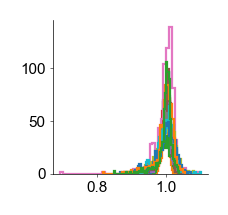

In [31]:
fig, ax = plt.subplots(figsize = (1, 1), dpi = 200)
ex_sess = '7wk_m0'
for i in range(len(bone_names)):
    plt.hist(
        np.linalg.norm(bones_canon[ex_sess][:, i], axis = -1) / np.linalg.norm(bones_poseind_canon[ex_sess][:, i], axis = -1),
        bins=50,
        histtype='step',
    )

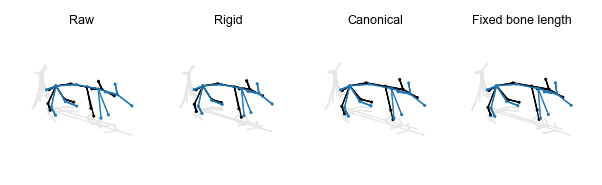

In [32]:
fig, ax = plt.subplots(1, 4, figsize=(4, 1.5), dpi=150, subplot_kw=dict(projection='3d'))
for a in ax:
    a.sharex(ax[-1])
    a.sharey(ax[-1])
    a.sharez(ax[-1])


frame = 25
plotdrop(frames_C[ex_sess][frame], ax[3], 'k', 0.15, 0.3, True, shady=False)
ax[3].set_title("Fixed bone length")
plotdrop(raw.get_session(ex_sess)[frame], ax[0], 'k', 0.15, 0.3, True, shady=False)
ax[0].set_title("Raw")
plotdrop(rigid.get_session(ex_sess)[frame], ax[1], 'k', 0.15, 0.3, True, shady=False)
ax[1].set_title("Rigid")
plotdrop(canonicalized.get_session(ex_sess)[frame], ax[2], 'k', 0.15, 0.3, True, shady=False)
ax[2].set_title("Canonical")

frame = 19
plotdrop(frames_C['52wk_m0'][frame], ax[3], 'C0', 0.15, 0.3, True, shady=False)
ax[3].set_title("Fixed bone length")
plotdrop(raw.get_session('52wk_m0')[frame], ax[0], 'C0', 0.15, 0.3, True, shady=False)
ax[0].set_title("Raw")
plotdrop(rigid.get_session('52wk_m0')[frame], ax[1], 'C0', 0.15, 0.3, True, shady=False)
ax[1].set_title("Rigid")
plotdrop(canonicalized.get_session('52wk_m0')[frame], ax[2], 'C0', 0.15, 0.3, True, shady=False)
ax[2].set_title("Canonical")


plotter.finalize(fig, None)

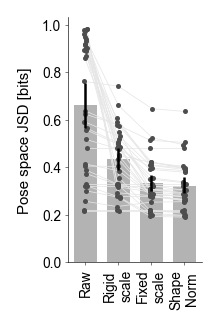

PosixPath('/Users/kaifox/projects/mph/generative_api/test/projects/o2-ont/fit03-3_frames-many_gmm10/models/init-scan_1/panel-plots/f-posespace-jsd-progression.pdf')

In [33]:
fig, ax = plt.subplots(figsize = (1.2, 1.8), dpi=180)

viz.util.grouped_stripplot(
    [jsds['raw'], jsds['rigid'], jsds['fixie'], jsds['canon']],
    x = [0, 1, 2, 3],
    colors = mpl_col.to_rgba('k'),
    points_kw={'ms': 1},
    lighten_points=0.3,
    errorbar_kw=dict(ms=0),
    error = lambda a, **kw: viz.util.ci(a, level=0.95, n=1000),
    connect=True,
    connection_kw = dict(lw=0.3, color='.9', ls='-'),
)
ax.bar([0], color = '.7', width=0.7, **viz.util.stem_bar(np.mean(jsds['raw']), 0),)
ax.bar([1], color = '.7', width=0.7, **viz.util.stem_bar(np.mean(jsds['rigid']), 0),)
ax.bar([2], color = '.7', width=0.7, **viz.util.stem_bar(np.mean(jsds['fixie']), 0),)
ax.bar([3], color = '.7', width=0.7, **viz.util.stem_bar(np.mean(jsds['canon']), 0),)

ax.set_xticks([0, 1, 2, 3])
ax.set_xticklabels(["Raw", "Rigid\nscale", "Fixed\nscale", "Shape\nNorm"], rotation=90)
ax.set_ylabel("Pose space JSD [bits]")

plotter.finalize(fig, 'f-posespace-jsd-progression', despine=False)

### Bone lengths and weights

Tentative claim: Learned bone length is predictive of within-cohort weight
variance for young ages (<=24). Growth of learned bone lengths, but not weight,
stop in old age (>=52) so these correlations are smaller. For the young ages
where size is predictive of weight, these learned bone lengths are a much better
reflection of weight than the time-averaged bone length.
- Need also basic version showing predictive across gross weight

##### Supporting functions

In [17]:
def frame_spherical_morph(frame_A, frame_B, arms):
    """
    Given two frames of keypoints, construct a copy of B with the joint angles
    of A.
    """
    angles_A = _joint_angles(frame_A, arms)
    angles_B = _joint_angles(frame_B, arms)
    lengths_A = _bone_lengths(frame_A, arms)
    lengths_B = _bone_lengths(frame_B, arms)
    return angles_B - angles_A, lengths_B / lengths_A

##### Mean BL morph ratio vs subj weight

In [91]:
rescale = True


# ---- canonicalize, compute bone lengths of canonical and raw

canonicalized, raw, scan_align_meta = canonicalized_and_raw(scan_dataset, params.morph, rescale, scale_to=ref_session, body_to=f'body-{ref_session}')
subjwise_bls = {s: frame_spherical_morph(canonicalized.get_session(s), raw.get_session(s), arms)[1] for s in dataset_feats.sessions}

subjwise_mean_bls = {
    s: _bone_lengths(raw.get_session(s), arms).mean(axis = 0) / _bone_lengths(raw.get_session(ref_session), arms).mean(axis = 0)
    for s in dataset_feats.sessions
}


# --- bone lengths of anchor poses

anchors = anchor_keypoints(  # shape (n_session, n_anchor, n_kpt, 3)
    params.morph,
    scan_align_meta if rescale else {},
    magnitudes=anchor_magnitudes(scan_dataset, params.morph, q=0.1),
    config=cfg,
    session_meta=scan_dataset.session_meta,
)
n_anchor = anchors.shape[1]
anchors = {s: anchors[scan_dataset.session_id(s)] for s in dataset_feats.sessions}
anchor_bls = {
    s: _bone_lengths(anchors[s], arms) / _bone_lengths(anchors[ref_session], arms)
    for s in dataset_feats.sessions
}

#### Basic relationships

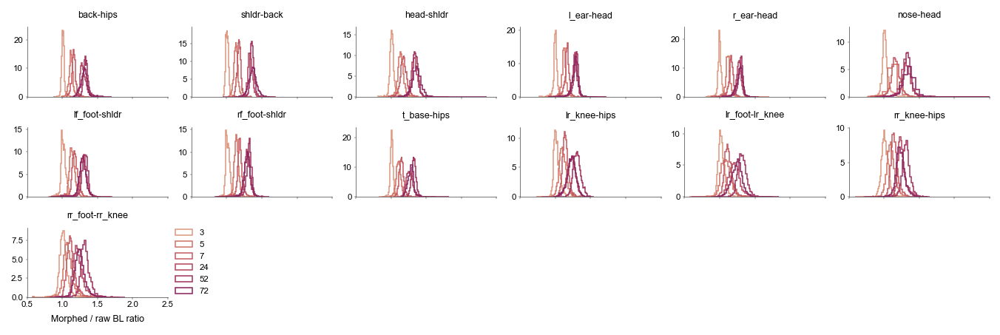

In [50]:
fig, axes, ax_grid = viz.util.flat_grid(arms.n_kpts - 1, min(6, arms.n_kpts - 1), ax_size = (1.5, 1), dpi=150, sharex=True)
age_order = sorted(age_groups.keys(), key=lambda x: int(x))
for i, (bname, ax) in enumerate(zip(bone_names, axes)):
    ax.set_title(bname)
    for a in age_order:
        age_sessions = age_groups[a]
        ax.hist(
            np.concatenate([subjwise_bls[s][:, i] for s in age_sessions if s != ref_session]),
            bins=50, color=age_pal[a], label=a, lw = 0.75, density=True, histtype='step'
        )
ax_grid[-1, 0].set_xlabel("Morphed / raw BL ratio")
ax.set_xlim(0.5, 2.5)
fig.tight_layout()
viz.util.legend(ax_grid[-1, 0])

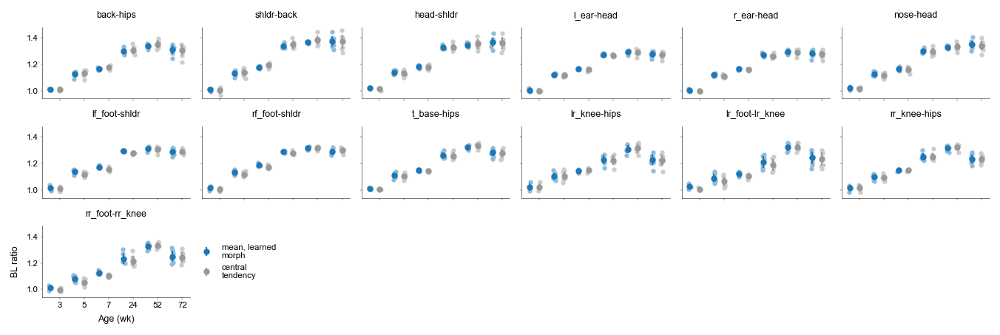

In [73]:
fig, axes, ax_grid = viz.util.flat_grid(arms.n_kpts - 1, min(6, arms.n_kpts - 1), ax_size = (1.5, 1), dpi=150, sharex=True, sharey=True)
age_order = sorted(age_groups.keys(), key=lambda x: int(x))
for i, (bname, ax) in enumerate(zip(bone_names, axes)):
    ax.set_title(bname)
    viz.util.grouped_stripplot(
        [np.array([subjwise_bls[s][:, i].mean() for s in age_groups[a] if s != ref_session]) for a in age_order],
        xticks = age_order,
        x=np.arange(len(age_order)) - 0.2,
        ax = ax,
        lighten_points=0.5,
        labels='mean, learned\nmorph',
        legend=False
    )
    viz.util.grouped_stripplot(
        [np.array([subjwise_mean_bls[s][i] for s in age_groups[a] if s != ref_session]) for a in age_order],
        xticks = age_order,
        x=np.arange(len(age_order)) + 0.2,
        colors='.6',
        ax = ax,
        lighten_points=0.5,
        labels='central\ntendency',
        legend=False
    )
ax_grid[-1, 0].set_xlabel("Age (wk)")
ax_grid[-1, 0].set_ylabel("BL ratio")
fig.tight_layout()
viz.util.legend(ax_grid[-1, 0])

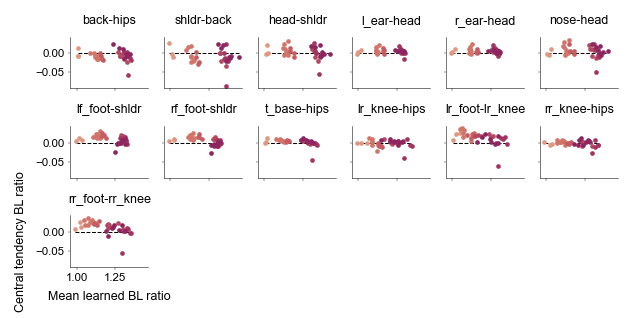

In [157]:
fig, axes, ax_grid = viz.util.flat_grid(arms.n_kpts - 1, min(6, arms.n_kpts - 1), ax_size = (.7, .7), dpi=150, sharex=True, sharey=True)
age_order = sorted(age_groups.keys(), key=lambda x: int(x))
for i, (bname, ax) in enumerate(zip(bone_names, axes)):
    ax.set_title(bname)
    
    for a in age_order:
        x = np.array([subjwise_bls[s][:, i].mean() for s in age_groups[a] if s != ref_session])
        y = np.array([subjwise_bls[s][:, i].mean() - subjwise_mean_bls[s][i] for s in age_groups[a] if s != ref_session])
        ax.scatter(
            x, y, lw=0, s = 5, color=age_pal[a]
        )
    x = np.concatenate([np.array([subjwise_bls[s][:, i].mean() for s in age_groups[a] if s != ref_session]) for a in age_order])
    y = np.concatenate([np.array([subjwise_bls[s][:, i].mean() - subjwise_mean_bls[s][i] for s in age_groups[a] if s != ref_session]) for a in age_order])
    ax.plot([x.min(), x.max()], [0, 0], 'k--', lw = 0.5, zorder = -2)
ax_grid[-1, 0].set_xlabel("Mean learned BL ratio")
ax_grid[-1, 0].set_ylabel("Central tendency BL ratio")
fig.tight_layout()

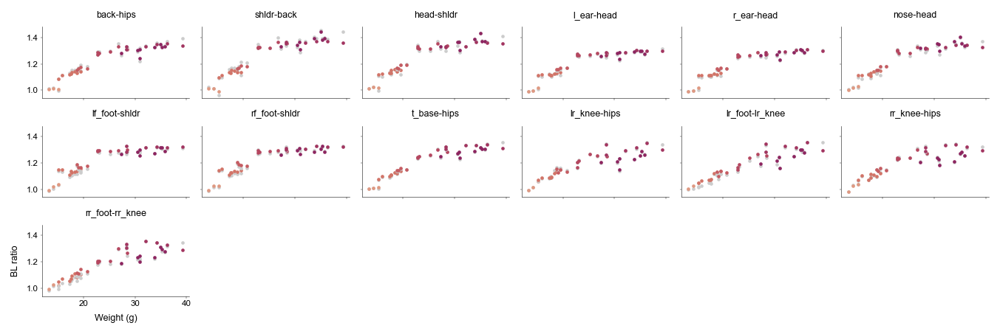

In [81]:
fig, axes, ax_grid = viz.util.flat_grid(arms.n_kpts - 1, min(6, arms.n_kpts - 1), ax_size = (1.5, 1), dpi=150, sharex=True, sharey=True)
age_order = sorted(age_groups.keys(), key=lambda x: int(x))
for i, (bname, ax) in enumerate(zip(bone_names, axes)):
    ax.set_title(bname)
    
    for a in age_order:
        x = np.array([subj_weights[s] for s in age_groups[a] if s != ref_session])
        y = np.array([subjwise_bls[s][:, i].mean() for s in age_groups[a] if s != ref_session])
        y1 = np.array([subjwise_mean_bls[s][i] for s in age_groups[a] if s != ref_session])
        ax.scatter(x, y1, lw=0, s = 5, color='.8', label = "central\ntendency")
        ax.scatter(x, y, lw=0, s = 5, color=age_pal[a], label = "mean, learned\nmorph")
ax_grid[-1, 0].set_xlabel("Weight (g)")
ax_grid[-1, 0].set_ylabel("BL ratio")
fig.tight_layout()

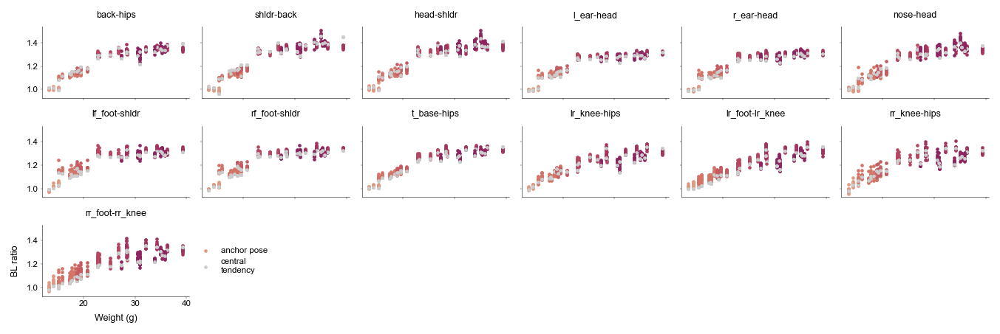

In [22]:
fig, axes, ax_grid = viz.util.flat_grid(arms.n_kpts - 1, min(6, arms.n_kpts - 1), ax_size = (1.5, 1), dpi=150, sharex=True, sharey=True)
age_order = sorted(age_groups.keys(), key=lambda x: int(x))
for i, (bname, ax) in enumerate(zip(bone_names, axes)):
    ax.set_title(bname)
    for a in age_order:
        for j in range(n_anchor):
            x = np.array([subj_weights[s] for s in age_groups[a] if s != ref_session])
            y = np.array([anchor_bls[s][j, i] for s in age_groups[a] if s != ref_session])
            y1 = np.array([subjwise_mean_bls[s][i] for s in age_groups[a] if s != ref_session])
            ax.scatter(x, y, lw=0, s = 5, color=age_pal[a], label="anchor pose")
            ax.scatter(x, y1, lw=0, s = 5, color='.8', label = "central\ntendency")
ax_grid[-1, 0].set_xlabel("Weight (g)")
ax_grid[-1, 0].set_ylabel("BL ratio")
fig.tight_layout()
viz.util.legend(axes[-1], viz.util.unique_handles(axes[-1]))

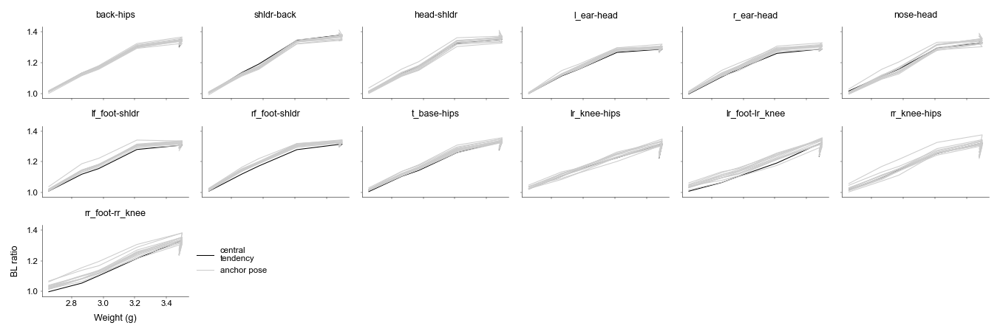

In [97]:
fig, axes, ax_grid = viz.util.flat_grid(arms.n_kpts - 1, min(6, arms.n_kpts - 1), ax_size = (1.5, 1), dpi=150, sharex=True, sharey=True)
age_order = sorted(age_groups.keys(), key=lambda x: int(x))
for i, (bname, ax) in enumerate(zip(bone_names, axes)):
    ax.set_title(bname)
    x = np.log([np.mean([subj_weights[s] for s in age_groups[a] if s != ref_session], axis = 0) for a in age_order])
    y1 = np.array([np.mean([subjwise_mean_bls[s][i] for s in age_groups[a] if s != ref_session], axis = 0) for a in age_order])
    ax.plot(x, y1, lw=0.5, ms = 3, color='k', label = "central\ntendency")
    for j in range(n_anchor):
        y = np.array([np.mean([anchor_bls[s][j, i] for s in age_groups[a] if s != ref_session], axis = 0) for a in age_order])
        ax.plot(x, y, '-', color='.8', lw=0.5, label="anchor pose")
    
ax_grid[-1, 0].set_xlabel("Weight (g)")
ax_grid[-1, 0].set_ylabel("BL ratio")
fig.tight_layout()
viz.util.legend(axes[-1], viz.util.unique_handles(axes[-1]))

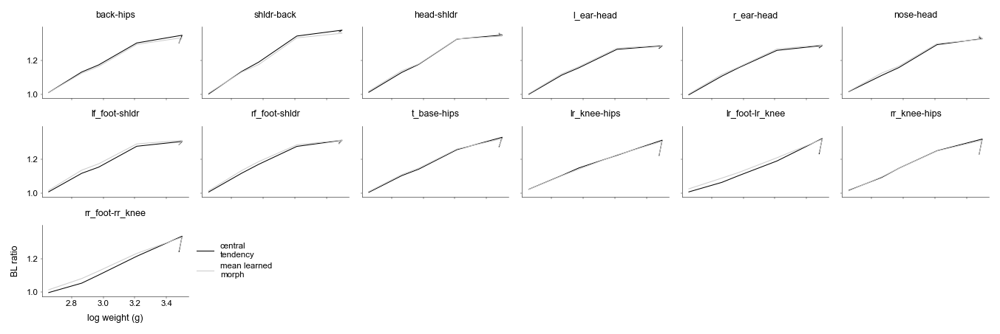

In [109]:
fig, axes, ax_grid = viz.util.flat_grid(arms.n_kpts - 1, min(6, arms.n_kpts - 1), ax_size = (1.5, 1), dpi=150, sharex=True, sharey=True)
age_order = sorted(age_groups.keys(), key=lambda x: int(x))
for i, (bname, ax) in enumerate(zip(bone_names, axes)):
    ax.set_title(bname)
    x = np.log([np.mean([subj_weights[s] for s in age_groups[a] if s != ref_session], axis = 0) for a in age_order])
    y1 = np.array([np.mean([subjwise_mean_bls[s][i] for s in age_groups[a] if s != ref_session], axis = 0) for a in age_order])
    ax.plot(x, y1, lw=0.5, ms = 3, color='k', label = "central\ntendency")

    y = np.array([np.mean([subjwise_bls[s][:, i].mean() for s in age_groups[a] if s != ref_session], axis = 0) for a in age_order])
    ax.plot(x, y, '-', color='.8', lw=0.5, label="mean learned\nmorph")
    
ax_grid[-1, 0].set_xlabel("log weight (g)")
ax_grid[-1, 0].set_ylabel("BL ratio")
fig.tight_layout()
viz.util.legend(axes[-1], viz.util.unique_handles(axes[-1]))

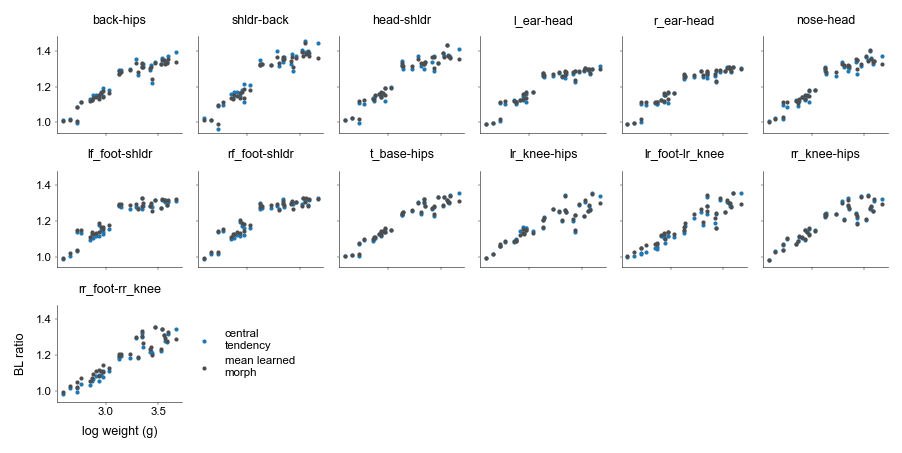

In [120]:
fig, axes, ax_grid = viz.util.flat_grid(arms.n_kpts - 1, min(6, arms.n_kpts - 1), ax_size = (1., 1), dpi=150, sharex=True, sharey=True)
age_order = sorted(age_groups.keys(), key=lambda x: int(x))
for i, (bname, ax) in enumerate(zip(bone_names, axes)):
    ax.set_title(bname)
    x = np.log([subj_weights[s] for a in age_order for s in age_groups[a] if s != ref_session])
    y1 = np.array([subjwise_mean_bls[s][i] for a in age_order for s in age_groups[a] if s != ref_session])
    ax.scatter(x, y1, lw=0., s = 4, color='C0', label = "central\ntendency")

    y = np.array([subjwise_bls[s][:, i].mean() for a in age_order for s in age_groups[a] if s != ref_session])
    ax.scatter(x, y, lw=0, s = 4, color = '.3', label="mean learned\nmorph")
    
ax_grid[-1, 0].set_xlabel("log weight (g)")
ax_grid[-1, 0].set_ylabel("BL ratio")
fig.tight_layout()
viz.util.legend(axes[-1], viz.util.unique_handles(axes[-1]))

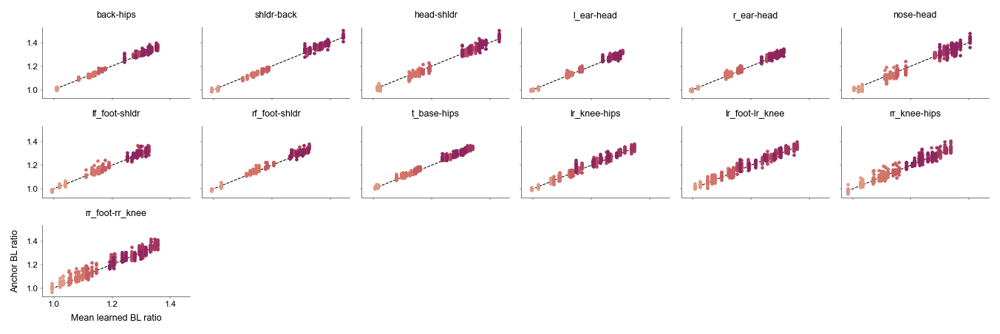

In [102]:
fig, axes, ax_grid = viz.util.flat_grid(arms.n_kpts - 1, min(6, arms.n_kpts - 1), ax_size = (1.5, 1), dpi=150, sharex=True, sharey=True)
age_order = sorted(age_groups.keys(), key=lambda x: int(x))
for i, (bname, ax) in enumerate(zip(bone_names, axes)):
    ax.set_title(bname)
    for a in age_order:
        for j in range(n_anchor):
            x = np.array([subjwise_bls[s][:, i].mean(axis=0) for s in age_groups[a] if s != ref_session])
            y = np.array([anchor_bls[s][j, i] for s in age_groups[a] if s != ref_session])
            ax.scatter(x, y, lw=0, s = 5, color=age_pal[a])
    x = np.concatenate([np.array([subjwise_bls[s][:, i].mean() for s in age_groups[a] if s != ref_session]) for a in age_order])
    ax.plot([x.min(), x.max()], [x.min(), x.max()], 'k--', lw = 0.5, zorder = -2)
ax_grid[-1, 0].set_xlabel("Mean learned BL ratio")
ax_grid[-1, 0].set_ylabel("Anchor BL ratio")
fig.tight_layout()

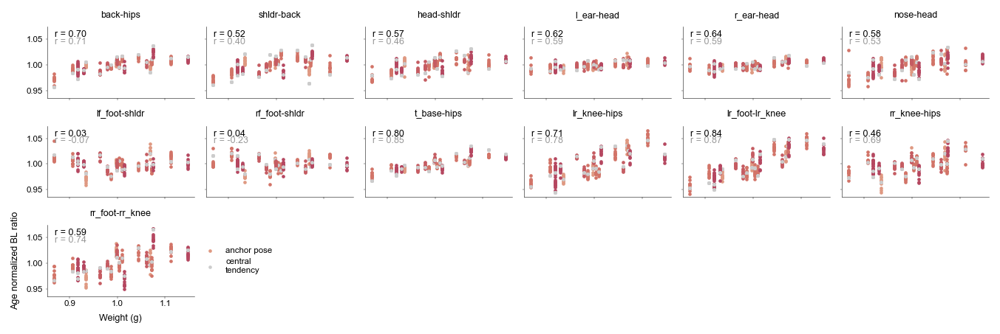

In [35]:
fig, axes, ax_grid = viz.util.flat_grid(arms.n_kpts - 1, min(6, arms.n_kpts - 1), ax_size = (1.5, 1), dpi=150, sharex=True, sharey=True)
age_order = sorted(age_groups.keys(), key=lambda x: int(x))
for i, (bname, ax) in enumerate(zip(bone_names, axes)):
    ax.set_title(bname)
    xdata = []
    ydata = []
    y1data = []
    for a in age_order:
        if a not in ['3', '5', '7', '24']:
            continue
        a_weights = np.array([subj_weights[s] for s in age_groups[a] if s != ref_session])
        a_weights = a_weights / a_weights.mean()
        for j in range(1):
            a_rtos = np.array([anchor_bls[s][j, i] for s in age_groups[a] if s != ref_session])
            a_rtos = a_rtos / a_rtos.mean()
            a_mean_rtos = np.array([subjwise_mean_bls[s][i] for s in age_groups[a] if s != ref_session])
            a_mean_rtos = a_mean_rtos / a_mean_rtos.mean()
            x = a_weights
            y = a_rtos
            y1 = a_mean_rtos
            ax.scatter(x, y, lw=0, s = 5, color=age_pal[a], label="anchor pose")
            ax.scatter(x, y1, lw=0, s = 5, color='.8', label = "central\ntendency")
            xdata.extend(x.tolist())
            ydata.extend(y.tolist())
            y1data.extend(y1.tolist())
    r1 = np.corrcoef(xdata, ydata)[0, 1]
    r2 = np.corrcoef(xdata, y1data)[0, 1]
    ax.text(0.05, 0.95, f"r = {r1:.2f}", ha='left', va='top', transform=ax.transAxes, color = 'k')
    ax.text(0.05, 0.85, f"r = {r2:.2f}", ha='left', va='top', transform=ax.transAxes, color = '.6')        


ax_grid[-1, 0].set_xlabel("Weight (g)")
ax_grid[-1, 0].set_ylabel("Age normalized BL ratio")
fig.tight_layout()
viz.util.legend(axes[-1], viz.util.unique_handles(axes[-1]))

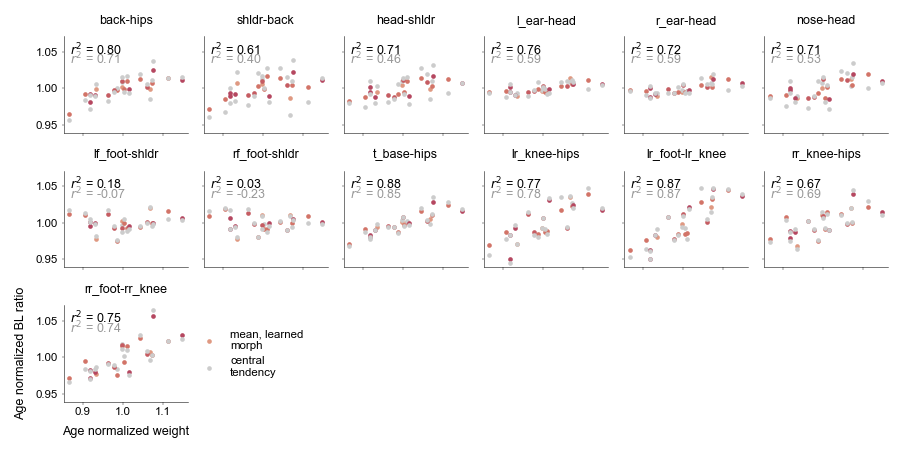

In [127]:
fig, axes, ax_grid = viz.util.flat_grid(arms.n_kpts - 1, min(6, arms.n_kpts - 1), ax_size = (1, 1), dpi=150, sharex=True, sharey=True)
age_order = sorted(age_groups.keys(), key=lambda x: int(x))
for i, (bname, ax) in enumerate(zip(bone_names, axes)):
    ax.set_title(bname)
    xdata = []
    ydata = []
    y1data = []
    for a in age_order:
        if a not in ['3', '5', '7', '24']:
            continue
        a_weights = np.array([subj_weights[s] for s in age_groups[a] if s != ref_session])
        a_weights = a_weights / a_weights.mean()
        
        a_rtos = np.array([subjwise_bls[s][:, i].mean() for s in age_groups[a] if s != ref_session])
        a_rtos = a_rtos / a_rtos.mean()
        a_mean_rtos = np.array([subjwise_mean_bls[s][i] for s in age_groups[a] if s != ref_session])
        a_mean_rtos = a_mean_rtos / a_mean_rtos.mean()
        x = a_weights
        y = a_rtos
        y1 = a_mean_rtos
        ax.scatter(x, y, lw=0, s = 5, color=age_pal[a], label="mean, learned\nmorph")
        ax.scatter(x, y1, lw=0, s = 5, color='.8', label = "central\ntendency")
        xdata.extend(x.tolist())
        ydata.extend(y.tolist())
        y1data.extend(y1.tolist())
    r1 = np.corrcoef(xdata, ydata)[0, 1]
    r2 = np.corrcoef(xdata, y1data)[0, 1]
    ax.text(0.05, 0.95, f"$r^2$ = {r1:.2f}", ha='left', va='top', transform=ax.transAxes, color = 'k', fontsize=6)
    ax.text(0.05, 0.85, f"$r^2$ = {r2:.2f}", ha='left', va='top', transform=ax.transAxes, color = '.6', fontsize=6)


ax_grid[-1, 0].set_xlabel("Age normalized weight")
ax_grid[-1, 0].set_ylabel("Age normalized BL ratio")
fig.tight_layout()
viz.util.legend(axes[-1], viz.util.unique_handles(axes[-1]))

In [148]:
def mae(x, y):
    """Mean asbolute error of independent variable x to dependent variable y
    based on sklearn linearregression"""
    from sklearn.linear_model import LinearRegression
    x = np.array(x)
    y = np.array(y)
    reg = LinearRegression().fit(x.reshape(-1, 1), y)
    return np.mean(np.abs(y - reg.predict(x.reshape(-1, 1))))


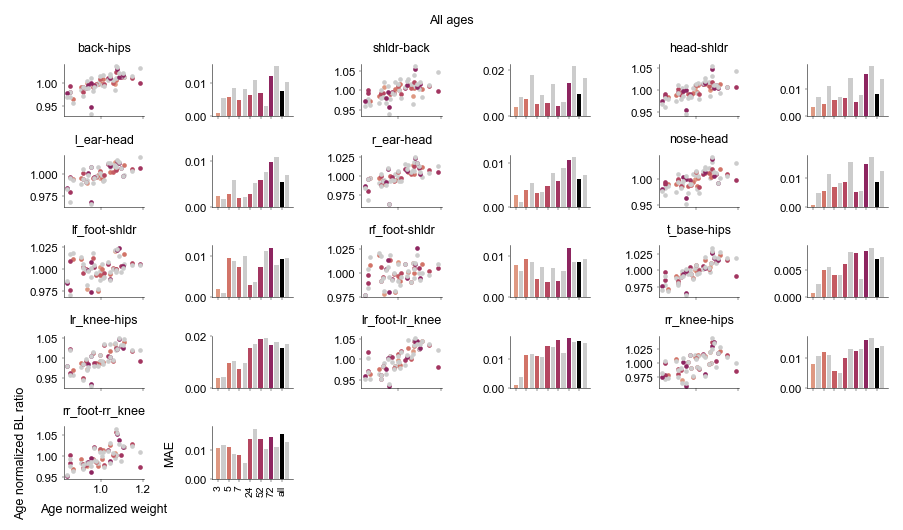

In [152]:
fig, axes, ax_grid = viz.util.flat_grid(2 * (arms.n_kpts - 1), min(6, arms.n_kpts - 1), ax_size = (1, .7), dpi=150, sharex='col')
age_order = sorted(age_groups.keys(), key=lambda x: int(x))
for i, (bname, ax, ax_r) in enumerate(zip(bone_names, *axes.reshape(-1, 2).T)):
    ax.set_title(bname)
    xdata = []
    ydata = []
    y1data = []
    for ia, a in enumerate(age_order):
        a_weights = np.array([subj_weights[s] for s in age_groups[a] if s != ref_session])
        a_weights = a_weights / a_weights.mean()
        
        a_rtos = np.array([subjwise_bls[s][:, i].mean() for s in age_groups[a] if s != ref_session])
        a_rtos = a_rtos / a_rtos.mean()
        a_mean_rtos = np.array([subjwise_mean_bls[s][i] for s in age_groups[a] if s != ref_session])
        a_mean_rtos = a_mean_rtos / a_mean_rtos.mean()
        x = a_weights
        y = a_rtos
        y1 = a_mean_rtos
        ax.scatter(x, y, lw=0, s = 5, color=age_pal[a], label="mean, learned\nmorph")
        ax.scatter(x, y1, lw=0, s = 5, color='.8', label = "central\ntendency")
        xdata.extend(x.tolist())
        ydata.extend(y.tolist())
        y1data.extend(y1.tolist())
        r = mae(x, y)
        r1 = mae(x, y1)
        ax_r.bar(2*ia, **viz.util.stem_bar(r, 0, True), color=age_pal[a])
        ax_r.bar(2*ia+1, **viz.util.stem_bar(r1, 0, True), color='.8')


    r = mae(xdata, ydata)
    r1 = mae(xdata, y1data)
    ax_r.bar(2*ia + 2, **viz.util.stem_bar(r, 0, True), color='k')
    ax_r.bar(2*ia + 3, **viz.util.stem_bar(r1, 0, True), color='.8')
    ax_r.set_xticks(np.arange(0, 2*(len(age_order))+2, 2))
    ax_r.set_xticklabels(age_order + ['all'], fontsize=5, rotation=90)

ax_grid[-1, 0].set_xlabel("Age normalized weight")
ax_grid[-1, 0].set_ylabel("Age normalized BL ratio")
ax_grid[-1, 1].set_ylabel("MAE")
fig.suptitle("All ages")
fig.tight_layout()
viz.util.legend(axes[-1], viz.util.unique_handles(axes[-1]))

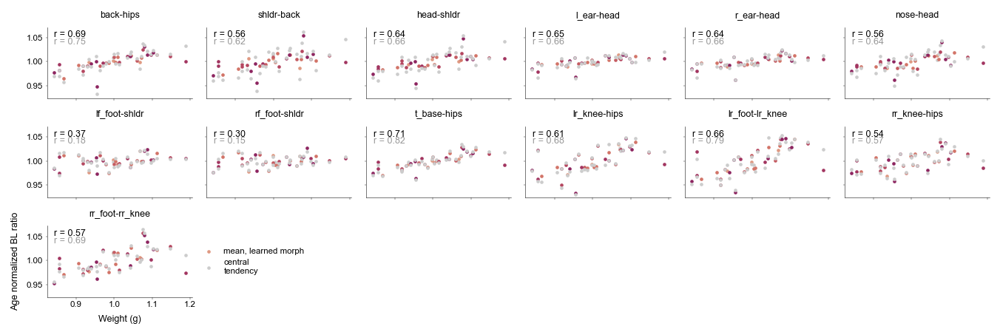

In [106]:
fig, axes, ax_grid = viz.util.flat_grid(arms.n_kpts - 1, min(6, arms.n_kpts - 1), ax_size = (1.5, 1), dpi=150, sharex=True, sharey=True)
age_order = sorted(age_groups.keys(), key=lambda x: int(x))
for i, (bname, ax) in enumerate(zip(bone_names, axes)):
    ax.set_title(bname)
    xdata = []
    ydata = []
    y1data = []
    for a in age_order:
        if a not in ['52', '72']:
            continue
        a_weights = np.array([subj_weights[s] for s in age_groups[a] if s != ref_session])
        a_weights = a_weights / a_weights.mean()
        
        a_rtos = np.array([subjwise_bls[s][:, i].mean() for s in age_groups[a] if s != ref_session])
        a_rtos = a_rtos / a_rtos.mean()
        a_mean_rtos = np.array([subjwise_mean_bls[s][i] for s in age_groups[a] if s != ref_session])
        a_mean_rtos = a_mean_rtos / a_mean_rtos.mean()
        x = a_weights
        y = a_rtos
        y1 = a_mean_rtos
        ax.scatter(x, y, lw=0, s = 5, color=age_pal[a], label="mean, learned morph")
        ax.scatter(x, y1, lw=0, s = 5, color='.8', label = "central\ntendency")
        xdata.extend(x.tolist())
        ydata.extend(y.tolist())
        y1data.extend(y1.tolist())
    r1 = np.corrcoef(xdata, ydata)[0, 1]
    r2 = np.corrcoef(xdata, y1data)[0, 1]
    ax.text(0.05, 0.95, f"r = {r1:.2f}", ha='left', va='top', transform=ax.transAxes, color = 'k')
    ax.text(0.05, 0.85, f"r = {r2:.2f}", ha='left', va='top', transform=ax.transAxes, color = '.6')        


ax_grid[-1, 0].set_xlabel("Weight (g)")
ax_grid[-1, 0].set_ylabel("Age normalized BL ratio")
fig.tight_layout()
viz.util.legend(axes[-1], viz.util.unique_handles(axes[-1]))

#### Within behaviors

Even within supervised behavior labels, mean ratios do not explain. E.g. weight
difference does not explain why 52wk_m0's mean back length during rearing is
longer than that of 52wk_m1 - at least not any better than it explains why
52wk_m0's *total* mean back length is longer than that of 52wk_m1

In [67]:
canonicalized_full, raw_full, _ = canonicalized_and_raw(scan_dataset_full, params.morph, rescale=True, scale_to=ref_session)
bhv_subjwise_bls = {
    k: {
        s: _bone_lengths(raw_full.get_session(s)[bhv_masks[k][s]], arms).mean(axis = 0) / _bone_lengths(raw_full.get_session(ref_session)[bhv_masks[k][ref_session]], arms).mean(axis = 0)
        for s in dataset_feats.sessions
    }
    for k in bhv_keys
}

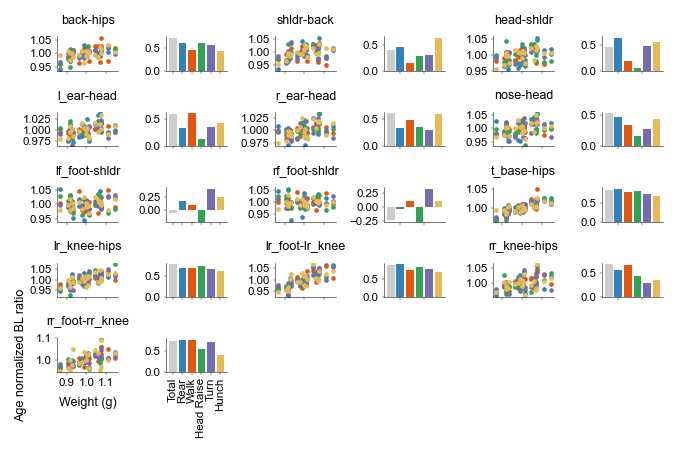

In [77]:
fig, axes, ax_grid = viz.util.flat_grid(2*(arms.n_kpts - 1), min(6, arms.n_kpts - 1), ax_size = (0.75, 0.6), dpi=150, sharex='col')
age_order = sorted(age_groups.keys(), key=lambda x: int(x))
bhv_order = list(bhv_keys.keys())
for i, (bname, ax, ax_r) in enumerate(zip(bone_names, *axes.reshape(-1, 2).T)):
    ax.set_title(bname)
    for j, k in enumerate(bhv_order):
        xdata = []
        ydata = []
        y1data = []
        for a in age_order:
            if a not in ['3', '5', '7', '24']:
                continue
            a_weights = np.array([subj_weights[s] for s in age_groups[a] if s != ref_session])
            a_weights = a_weights / a_weights.mean()
            
            a_rtos = np.array([bhv_subjwise_bls[k][s][i] for s in age_groups[a] if s != ref_session])
            a_rtos = a_rtos / a_rtos.mean()
            a_mean_rtos = np.array([subjwise_mean_bls[s][i] for s in age_groups[a] if s != ref_session])
            a_mean_rtos = a_mean_rtos / a_mean_rtos.mean()
            x = a_weights
            y = a_rtos
            y1 = a_mean_rtos
            ax.scatter(x, y, lw=0, s = 5, color=bhv_pal[k], label="anchor pose")
            if k == 0:
                ax.scatter(x, y1, lw=0, s = 5, color='.8', label = "central\ntendency", zorder = 2)
            xdata.extend(x.tolist())
            ydata.extend(y.tolist())
            y1data.extend(y1.tolist())
        r1 = np.corrcoef(xdata, ydata)[0, 1]
        
        ax_r.bar(j, **viz.util.stem_bar(r1, 0, as_kw=True), color=bhv_pal[k])
    r2 = np.corrcoef(xdata, y1data)[0, 1]
    ax_r.bar([-1], **viz.util.stem_bar(r2, 0, as_kw=True), color='.8')


ax_grid[-1, 0].set_xlabel("Weight (g)")
ax_grid[-1, 0].set_ylabel("Age normalized BL ratio")
ax_grid[-1, 1].set_xticks(range(-1, len(bhv_order)))
ax_grid[-1, 1].set_xticklabels(["Total"] + [bhv_names[k].replace('\n', ' ') for k in bhv_order], rotation=90)
fig.tight_layout()
viz.util.legend(axes[-1], viz.util.unique_handles(axes[-1]))

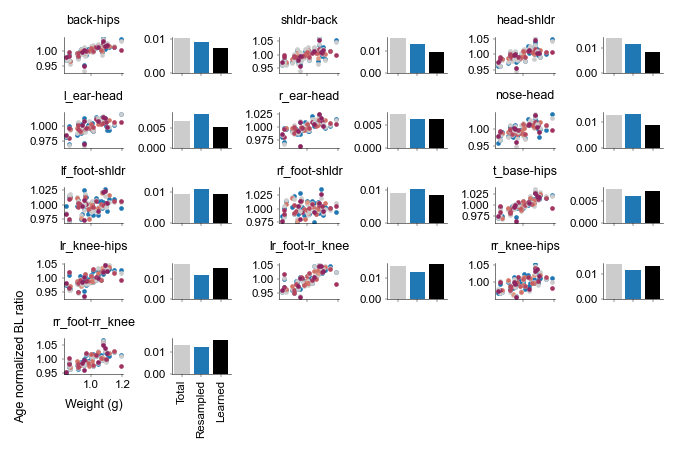

In [154]:
fig, axes, ax_grid = viz.util.flat_grid(2*(arms.n_kpts - 1), min(6, arms.n_kpts - 1), ax_size = (0.75, 0.6), dpi=150, sharex='col')
age_order = sorted(age_groups.keys(), key=lambda x: int(x))
bhv_order = list(bhv_keys.keys())
bhv_weights = [bhv_masks[k][ref_session].mean() for k in bhv_order]
bhv_weights = {k: w / np.sum(w) for k, w in zip(bhv_order, bhv_weights)}
for i, (bname, ax, ax_r) in enumerate(zip(bone_names, *axes.reshape(-1, 2).T)):
    ax.set_title(bname)
    
    xdata = []
    ydata = []
    y1data = []
    y2data = []
    for a in age_order:
        # if a not in ['3', '5', '7', '24']:
            # continue
        a_weights = np.array([subj_weights[s] for s in age_groups[a] if s != ref_session])
        a_weights = a_weights / a_weights.mean()
        
        a_rtos = np.array([[bhv_weights[k] * bhv_subjwise_bls[k][s][i] for s in age_groups[a] if s != ref_session] for k in bhv_order]).mean(axis = 0)
        
        a_rtos = a_rtos / a_rtos.mean()
        a_mean_rtos = np.array([subjwise_mean_bls[s][i] for s in age_groups[a] if s != ref_session])
        a_mean_rtos = a_mean_rtos / a_mean_rtos.mean()
        a_anch_rtos = np.array([subjwise_bls[s][:, i].mean() for s in age_groups[a] if s != ref_session])
        a_anch_rtos = a_anch_rtos / a_anch_rtos.mean()
        x = a_weights
        y = a_rtos
        y1 = a_mean_rtos
        y2 = a_anch_rtos
        ax.scatter(x, y, lw=0, s = 5, color='C0', label="anchor pose")
        ax.scatter(x, y1, lw=0, s = 5, color='.8', label = "central\ntendency", zorder = 2)
        ax.scatter(x, y2, lw=0, s = 5, color=age_pal[a], label = "mean, learned\nmorph", zorder = 2)
        xdata.extend(x.tolist())
        ydata.extend(y.tolist())
        y1data.extend(y1.tolist())
        y2data.extend(y2.tolist())
    r1 = mae(xdata, ydata)
    ax_r.bar(0, **viz.util.stem_bar(r1, 0, as_kw=True), color='C0')
    r2 = mae(xdata, y1data)
    ax_r.bar([-1], **viz.util.stem_bar(r2, 0, as_kw=True), color='.8')
    r3 = mae(xdata, y2data)
    ax_r.bar([1], **viz.util.stem_bar(r3, 0, as_kw=True), color='k')


ax_grid[-1, 0].set_xlabel("Weight (g)")
ax_grid[-1, 0].set_ylabel("Age normalized BL ratio")
ax_grid[-1, 1].set_xticks(range(-1, 2))
ax_grid[-1, 1].set_xticklabels(["Total"] + ['Resampled', "Learned"], rotation=90)
fig.tight_layout()
viz.util.legend(axes[-1], viz.util.unique_handles(axes[-1]))

#### Relationship of anchor pose v. mean growth rates in naive vs full model

In [ ]:
fig, ax = plt.subplots(2, 1, figsize = (1.5, 1.5), dpi = 150, sharex = True)

short_names = ['lo back', 'hi back', 'neck', 'L ear', 'R ear', 'head', 'R forelimb', "L forelimb", "rump", "L hindlimb", "L foot", "R hindlimb", 'R foot']
bone_order = ['lo back', 'hi back', 'neck', 'head', "rump",  'L ear', 'R ear', "L foot", 'R foot', "L hindlimb", "R hindlimb", 'R forelimb', "L forelimb", ]
bone_ix_order = [short_names.index(n) for n in bone_order]
bone_name_order = [short_names[i] for i in bone_ix_order]

age_raw_bls = {
    a: np.mean([_bone_lengths(raw.get_session(s), arms).mean(axis = 0) for s in age_groups[a] if s != ref_session], axis = 0)
    for a in age_groups
}
age_anchor_bls = {
    np.mean([_bone_lengths(anchors[dataset_feats.session_id(s)], arms) for s in age_groups[a] if s != ref_session], axis = 0)
    for a in age_groups
}



for i, (b, bi) in enumerate(zip(bone_order, bone_ix_order)):
    x = [age_weights[ref_age]] + [age_weights[t] for t in tgt_ages] 
    raw_y = [age_raw_bls[ref_age][bi]] + [age_raw_bls[t][bi] for t in tgt_ages]
    anch_y = np.stack([age_anchor_bls[ref_age][..., bi]] + [age_anchor_bls[t][..., bi] for t in tgt_ages])
    c = [ref_color] + tgt_colors
    

    cov = lambda x, y: (np.array(x) * np.array(y)).mean(axis=-1) - np.array(x).mean(axis=-1) * np.array(y).mean(axis=-1)
    coef = lambda a, b: cov(a, b) / cov(a, a)
    raw_coef = coef(np.log(x), raw_y)
    anch_coef = [coef(np.log(x), anch_y[:, k]) for k in range(naive_merged_params.n_dims + 1)]
    

    naive_raw_y = [naive_raw_bls[ref_age][bi]] + [naive_raw_bls[t][bi] for t in tgt_ages]
    naive_anch_y = np.stack([naive_anchor_bls[ref_age][..., bi]] + [naive_anchor_bls[t][..., bi] for t in tgt_ages])
    naive_raw_coef = coef(np.log(x), naive_raw_y)
    naive_anch_coef = [coef(np.log(x), naive_anch_y[:, k]) for k in range(naive_merged_params.n_dims + 1)]
    
    ax[0].plot([naive_raw_coef] * len(naive_anch_coef), naive_anch_coef, 'o', color = '.6', ms = 2)
    ax[1].plot([raw_coef] * len(anch_coef), anch_coef, 'o', color = 'k', ms = 2)

vmin, vmax = np.inf, -np.inf
for a in ax:
    vmin = min(vmin, a.get_xlim()[0], a.get_ylim()[0])
    vmax = max(vmax, a.get_xlim()[1], a.get_ylim()[1])
vmin, vmax = vmin - 0.05 * (vmax - vmin), vmax + 0.05 * (vmax - vmin)
for a in ax:
    a.plot([vmin, vmax], [vmin, vmax], 'k--', lw = 0.3, zorder = -2)
    a.set_xlim(vmin, vmax)
    a.set_ylim(vmin, vmax)
# ax.set_aspect('equal')
# ax.set_ylabel("Anchor poses coefficient")
fig.text(0.22, 0.62, "Anchor pose growth date", ha = 'center', va = 'center', rotation = 90)
fig.text(0.05, 0.62, "Behavior knowledge", ha = 'center', va = 'center', rotation = 90, fontstyle = 'italic')
ax[1].set_ylabel("Aware\n")
ax[0].set_ylabel("Naive\n")
ax[1].set_xlabel("Raw keypoint growth\nrate [mm / log g]")

plotter.finalize(fig, 'naive-growth-rate')

### Components vs behavior

Do the components describe types of behavior we can verify independently?

#### Basics

In [39]:
canonicalized_full, _, _ = canonicalized_and_raw(scan_dataset_full, params.morph, rescale=False, scale_to=ref_session)
pose_logprobs = pose.gmm.pose_logprob(params.pose, features.reduce_to_features(canonicalized_full, cfg['features']))
pose_logprobs = {s: pose_logprobs[slice(*scan_dataset_full.get_slice(s))] for s in dataset_feats.sessions}

In [40]:
gmm_top_masks = {s: np.zeros_like(pose_logprobs[s], dtype = bool) for s in dataset_feats.sessions}
for s in dataset_feats.sessions:
    gmm_top_masks[s][np.arange(len(pose_logprobs[s])), np.argmax(pose_logprobs[s], axis = 1)] = True
n_components = params.pose.n_components
bhv_order = list(bhv_keys.keys())
n_etho = len(bhv_order)
etho_gmm_confusion = np.zeros([n_etho, n_components])
etho_gmm_means = np.zeros([n_etho, n_components])
etho_gmm_mean_norms = np.zeros([n_etho, n_components])
for s in dataset_feats.sessions:
    prob = np.exp(pose_logprobs[s])
    prob /= prob.sum(axis = 1, keepdims = True)
    for i, k in enumerate(bhv_order):
        etho_mask = bhv_masks[k][s]
    
        # number of frames for which behavior k is on and component j is top
        etho_gmm_confusion[i, :] += gmm_top_masks[s][etho_mask].sum(axis = 0)
        # mean pose logprob for component j during behavior k
        etho_gmm_means[i, :] += prob[etho_mask].sum(axis = 0)
        etho_gmm_mean_norms[i, :] += etho_mask.sum()

# percent of behavior k frames where component j is top
etho_gmm_confusion /= etho_gmm_confusion.sum(axis = 1, keepdims=True)
# mean pose logprob for component j during behavior k
etho_gmm_means /= etho_gmm_mean_norms


/var/folders/yl/fzvpkkfs7md45qk6gcq3q27r0000gn/T/ipykernel_80957/611778982.py:12: RuntimeWarning: invalid value encountered in divide
  prob /= prob.sum(axis = 1, keepdims = True)


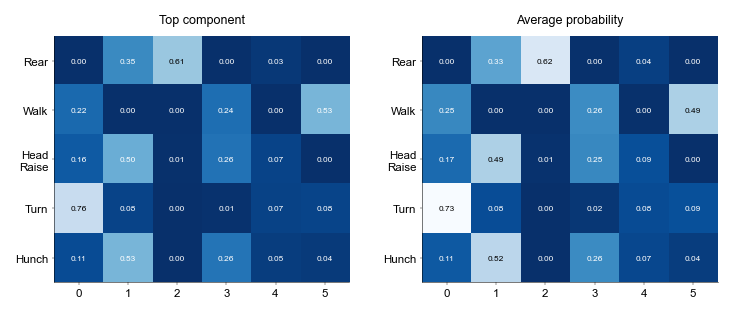

In [61]:
from sklearn.metrics import ConfusionMatrixDisplay
fig, ax = plt.subplots(1, 2, figsize = (5, 2), dpi = 150)


for a, arr, (vmin, vmax) in zip(ax, [etho_gmm_confusion, etho_gmm_means], [(0, 1), (0, etho_gmm_means.max())]):
    a.imshow(arr, cmap = 'Blues_r', vmin = vmin, vmax = vmax)
    mid = vmin + 0.6 * (vmax - vmin)
    for i in range(n_etho):
        for j in range(n_components):
            x = arr[i, j]
            a.text(j, i, f"{x:.2f}", ha = 'center', va = 'center', fontsize = 4, color = 'w' if x < mid else 'k')

    a.set_xticks(range(n_components))
    a.set_xticklabels(range(n_components))
    a.set_yticks(range(n_etho))
    a.set_yticklabels([bhv_names[k] for k in bhv_order])

ax[0].set_title("Top component")
ax[1].set_title("Average probability")
plotter.finalize(fig, None)

In [41]:
def compute_bhv_example_dataframes(logprobs, intervals, res, buffer, temp = 1., probs_are_log=True):
    
    bhvs = list(intervals.keys())
    sessions = list(logprobs.keys())
    n_components = logprobs[sessions[0]].shape[1]
    examples = {k: {"x": [], 'on': [], 'n': [], 's': [], 'i': [], **{j: [] for j in range(n_components)}} for k in bhvs}
    n = 0
    for k in bhvs:
        for s in sessions:
            if probs_are_log:
                probs = np.exp(logprobs[s] * temp)
                probs /= probs.sum(axis = 1, keepdims = True)
            else:
                probs = logprobs[s]
            slices = intervals[k][s]
            animal_n = 0
            for start, end in slices:
                if start - buffer < 0 or end + buffer >= len(probs):
                    continue
                example = probs[start - buffer:end + buffer]
                x = np.concatenate([np.arange(-buffer, 0), np.linspace(0, res, end - start), np.arange(res + 1, res + buffer + 1)])
                bout_on = np.concatenate([np.zeros(buffer), np.ones(end - start), np.zeros(buffer)]).astype(bool)
                examples[k]['x'].extend(x.tolist())
                examples[k]['on'].extend(bout_on.tolist())
                for j in range(n_components):
                    examples[k][j].extend(example[:, j].tolist())
                examples[k]['n'].extend([n] * len(x))
                examples[k]['s'].extend([s] * len(x))
                examples[k]['i'].extend([animal_n] * len(x))
                n += 1
                animal_n += 1/len(slices)
        examples[k] = pd.DataFrame(examples[k])
    return examples


In [72]:
res = 40
buffer = 10
examples = {k: {"x": [], 'n': [], 's': [], 'i': [], **{j: [] for j in range(n_components)}} for k in bhv_order}
with tqdm.tqdm(total = len(bhv_order) * len(dataset_feats.sessions)) as pbar:
    n = 0
    for k in bhv_order:
        
        i = sup_etho['behaviors'].index(bhv_keys[k])
        for s in dataset_feats.sessions:
            probs = pose_logprobs[s]
            probs /= probs.sum(axis = 1, keepdims = True)
            intervals = sup_etho['intervals'][s][i]
            animal_n = 0
            for start, end in intervals:
                if start - buffer < 0 or end + buffer >= len(pose_logprobs[s]):
                    continue
                
                example = probs[start - buffer:end + buffer]
                x = np.concatenate([np.arange(-buffer, 0), np.linspace(0, res, end - start), np.arange(res + 1, res + buffer + 1)])
                examples[k]['x'].extend(x.tolist())
                for j in range(n_components):
                    examples[k][j].extend(example[:, j].tolist())
                examples[k]['n'].extend([n] * len(x))
                examples[k]['s'].extend([s] * len(x))
                examples[k]['i'].extend([animal_n] * len(x))
                n += 1
                animal_n += 1/len(intervals)
            pbar.update()
            
        examples[k] = pd.DataFrame(examples[k])

100%|██████████| 180/180 [00:31<00:00,  5.67it/s]


In [42]:
sup_etho_intervals = {
    k: {
        s: sup_etho["intervals"][s][sup_etho["behaviors"].index(bhv_keys[k])]
        for s in dataset_feats.sessions
    }
    for k in bhv_order
}
examples = compute_bhv_example_dataframes(
    pose_logprobs, sup_etho_intervals, 40, 10
)

/var/folders/yl/fzvpkkfs7md45qk6gcq3q27r0000gn/T/ipykernel_80957/3913554723.py:12: RuntimeWarning: invalid value encountered in divide
  probs /= probs.sum(axis = 1, keepdims = True)


100%|██████████| 50/50 [00:06<00:00,  7.66it/s]


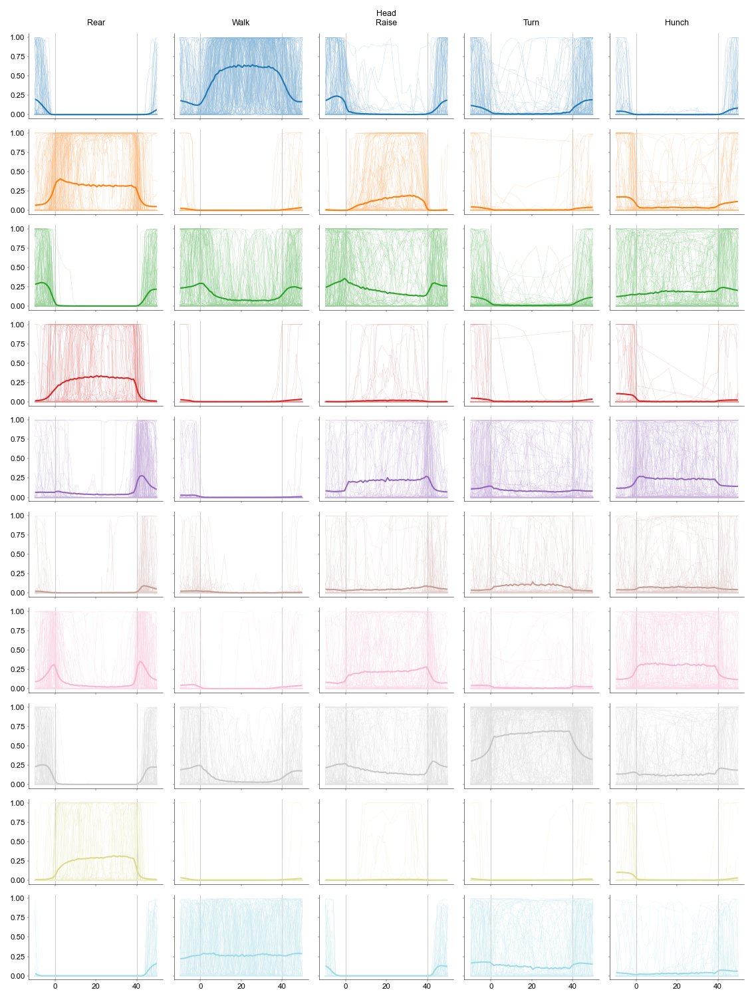

In [45]:
comp_pal = Colormap('tab20')(np.linspace(0, 1, n_components))
fig, ax = plt.subplots(n_components, n_etho, figsize = (1.5 * n_etho, 1 * n_components), dpi = 150, sharex=True, sharey=True)
res, buffer = 40, 10
bins = np.linspace(-buffer - 1e-2, res + buffer + 1e-2, res + 2 * buffer + 1)
bin_centers = (bins[:-1] + bins[1:]) / 2
with tqdm.tqdm(total = len(bhv_order) * n_components) as pbar:
    for i, k in enumerate(bhv_order):
        for j in range(n_components):
            for _, df in examples[k].query("n % 20 == 0").groupby('n'):
                ax[j, i].plot(df['x'], df[j], color = viz.util.lighten(comp_pal[j], 0.5), lw = 0.1)
            y = [examples[k].query("x > @x1 and x <= @x2")[j].mean() for x1, x2 in zip(bins[:-1], bins[1:])]
            ax[j, i].plot(bin_centers, y, color = comp_pal[j], lw = 1)
            ax[j, i].axvline(0, color = '.8', lw = 0.5, zorder = -1)
            ax[j, i].axvline(res, color = '.8', lw = 0.5, zorder = -1)
            pbar.update()
        ax[0, i].set_title(bhv_names[k])
plotter.finalize(fig, None)

#### Based on pre-ethogram bouts

In [83]:

sup_bhv_intervals = {
    k: {
        s: sup_bhv["intervals"][bhv_keys[k]][s]
        for s in dataset_feats.sessions
    }
    for k in bhv_order
}
examples = compute_bhv_example_dataframes(
    pose_logprobs, sup_bhv_intervals, 40, 10
)

100%|██████████| 30/30 [00:04<00:00,  7.14it/s]


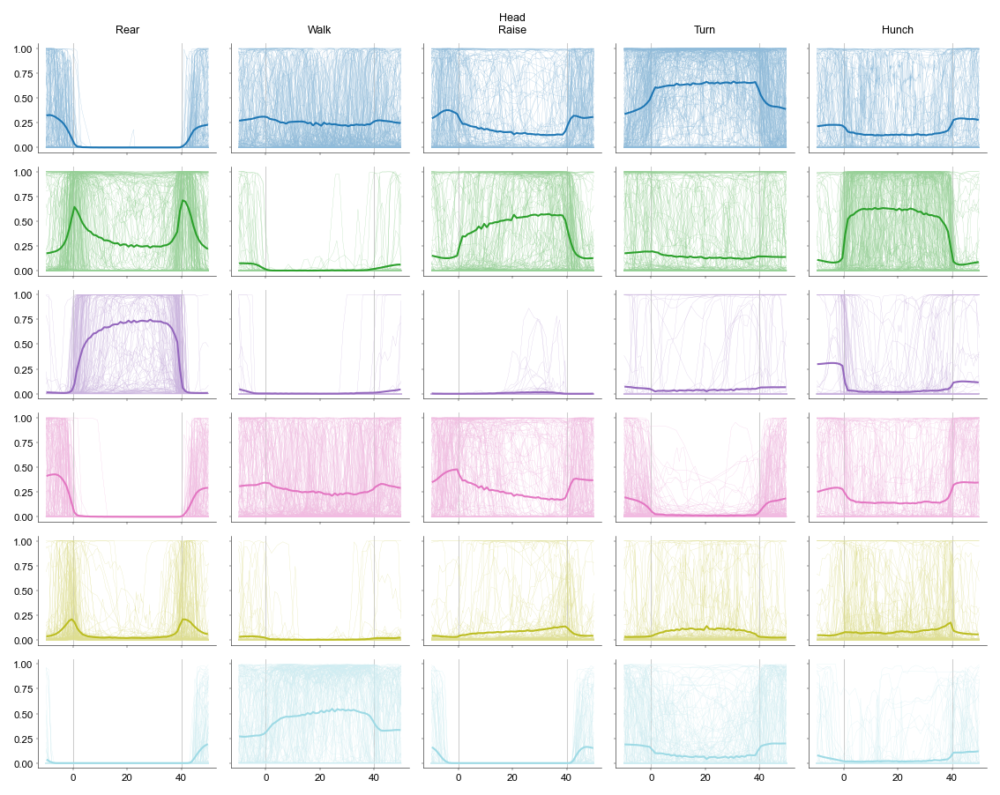

In [84]:
comp_pal = Colormap('tab20')(np.linspace(0, 1, n_components))
fig, ax = plt.subplots(n_components, n_etho, figsize = (1.5 * n_etho, 1 * n_components), dpi = 150, sharex=True, sharey=True)
bins = np.linspace(-buffer - 1e-2, res + buffer + 1e-2, res + 2 * buffer + 1)
bin_centers = (bins[:-1] + bins[1:]) / 2
with tqdm.tqdm(total = len(bhv_order) * n_components) as pbar:
    for i, k in enumerate(bhv_order):
        for j in range(n_components):
            for _, df in examples[k].query("n % 20 == 0").groupby('n'):
                ax[j, i].plot(df['x'], df[j], color = viz.util.lighten(comp_pal[j], 0.5), lw = 0.1)
            y = [examples[k].query("x > @x1 and x <= @x2")[j].mean() for x1, x2 in zip(bins[:-1], bins[1:])]
            ax[j, i].plot(bin_centers, y, color = comp_pal[j], lw = 1)
            ax[j, i].axvline(0, color = '.8', lw = 0.5, zorder = -1)
            ax[j, i].axvline(res, color = '.8', lw = 0.5, zorder = -1)
            pbar.update()
        ax[0, i].set_title(bhv_names[k])
plotter.finalize(fig, None)

#### Classifiers: supporting funcs

In [46]:
def create_classification_dataset(XYdf, s_trn, s_val, i_trn, i_val, trn_max = 10000, val_max = 10000, seed = 42):
    if isinstance(seed, int):
        rng = np.random.default_rng(seed)
    else:
        rng = seed

    trn_df = XYdf.loc[XYdf['s'].isin(s_trn) & (XYdf['i'] >= i_trn[0]) & (XYdf['i'] < i_trn[1])]
    x_trn = trn_df[list(range(n_components))].values
    y_trn = trn_df['label'].values
    if len(x_trn) > trn_max:
        subsample = rng.choice(len(x_trn), trn_max, replace = False)
        x_trn = x_trn[subsample]
        y_trn = y_trn[subsample]
    
    val_df = XYdf.loc[XYdf['s'].isin(s_val) & (XYdf['i'] >= i_val[0]) & (XYdf['i'] < i_val[1])]
    x_val = val_df[list(range(n_components))].values
    y_val = val_df['label'].values
    if len(x_val) > val_max:
        subsample = rng.choice(len(x_val), val_max, replace = False)
        x_val = x_val[subsample]
        y_val = y_val[subsample]
    
    return x_trn, y_trn, x_val, y_val

def fit_and_score(classifier, X_trn, y_trn, X_val, y_val):
    classifier.fit(X_trn, y_trn)
    trn_yhat = classifier.predict(X_trn)
    val_yhat = classifier.predict(X_val)
    trn_acc = metrics.accuracy_score(y_trn, trn_yhat)
    val_acc = metrics.accuracy_score(y_val, val_yhat)
    val_confusion = metrics.confusion_matrix(y_val, val_yhat)
    return trn_acc, val_acc, val_confusion


#### Clasifiers: basic tests

In [234]:
XYdf = pd.concat([examples[k].assign(label = i) for i, k in enumerate(bhv_order)])

# XYdf = XYdf.query("x >= 0 and x <= @res")   
Xydf = XYdf.query("on")
Xt, yt, Xv, yv = create_classification_dataset(XYdf, dataset_feats.sessions, dataset_feats.sessions, (0, 0.5), (0.5, 1))
classifier = RandomForestClassifier(max_depth=5, n_estimators=20, max_features=2, random_state=43, class_weight='balanced')
trn_acc, val_acc, val_confusion = fit_and_score(classifier, Xt, yt, Xv, yv)

In [235]:
trn_acc, val_acc

(0.5998, 0.5631)

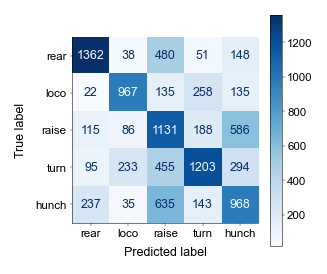

In [236]:
fig, ax = plt.subplots(1, 1, figsize = (2, 2), dpi = 150)
ConfusionMatrixDisplay(val_confusion, display_labels = bhv_order).plot(ax = ax, cmap = 'Blues')

In [252]:
XYdf = pd.concat([examples[k].assign(label = i) for i, k in enumerate(bhv_order)])
XYdf = XYdf.query("on")
XYdf = XYdf.groupby('n').agg({c: ('first' if c in ['s', 'label'] else 'mean') for c in XYdf.columns})
Xt, yt, Xv, yv = create_classification_dataset(XYdf, dataset_feats.sessions, dataset_feats.sessions, (0, 0.5), (0.5, 1))
classifier = RandomForestClassifier(max_depth=5, n_estimators=20, max_features=2, random_state=43, class_weight='balanced')
print(len(Xt), len(Xv))
trn_acc, val_acc, val_confusion = fit_and_score(classifier, Xt, yt, Xv, yv)

9821 9630


In [253]:
trn_acc, val_acc

(0.8072497708990938, 0.7538940809968847)

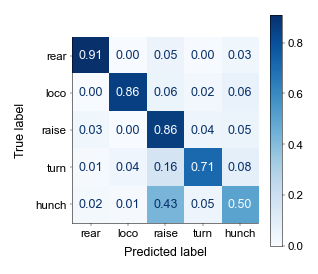

In [255]:
fig, ax = plt.subplots(1, 1, figsize = (2, 2), dpi = 150)
ConfusionMatrixDisplay(val_confusion / val_confusion.sum(axis = 1, keepdims=True), display_labels = bhv_order).plot(ax = ax, cmap = 'Blues', values_format = '.2f')

In [163]:
XYdf = pd.concat([examples[k].assign(label = i) for i, k in enumerate(bhv_order)])
XYdf = XYdf.query("x >= 0 and x <= @res")
XYdf = XYdf.groupby('n').agg({c: ('first' if c in ['s', 'label'] else 'median') for c in XYdf.columns})
Xt, yt, Xv, yv = create_classification_dataset(XYdf, dataset_feats.sessions, dataset_feats.sessions, (0, 0.5), (0.5, 1))
classifier = RandomForestClassifier(max_depth=5, n_estimators=20, max_features=2, random_state=43, class_weight='balanced')
print(len(Xt), len(Xv))
trn_acc, val_acc, val_confusion = fit_and_score(classifier, Xt, yt, Xv, yv)

9822 9629


In [164]:
trn_acc, val_acc

(0.853390348197923, 0.8069373766746287)

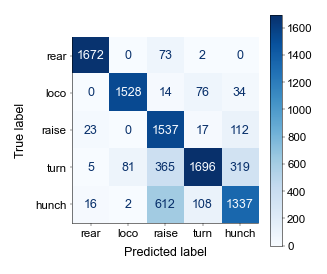

In [165]:
fig, ax = plt.subplots(1, 1, figsize = (2, 2), dpi = 150)
ConfusionMatrixDisplay(val_confusion, display_labels = bhv_order).plot(ax = ax, cmap = 'Blues')

#### Classifiers: held out cohorts

In [67]:
scores = {"out": [], "trn_acc": [], "val_acc": [], "trn_null": []}
n_iter = 5
rng = np.random.default_rng(48)

XYdf = pd.concat([examples[k].assign(label = i) for i, k in enumerate(bhv_order)])
XYdf = XYdf.query("on")
XYdf = XYdf.groupby('n').agg({c: ('first' if c in ['s', 'label'] else 'median') for c in XYdf.columns})
print(XYdf.shape)

with tqdm.tqdm(total = len(age_groups) * n_iter) as pbar:
    for a, age_group in age_groups.items():
        for i in range(n_iter):
            trn_s = [s for s in dataset_feats.sessions if s not in age_group]
            val_s = age_group

            Xt, yt, Xv, yv = create_classification_dataset(XYdf, trn_s, val_s, (0, 1), (0, 1), trn_max=5000, val_max=1000, seed=rng)
            classifier = RandomForestClassifier(max_depth=5, n_estimators=20, max_features=2, random_state=43, class_weight='balanced')
            trn_acc, val_acc, val_confusion = fit_and_score(classifier, Xt, yt, Xv, yv)
            scores["out"].append(a)
            scores["trn_acc"].append(trn_acc)
            scores["val_acc"].append(val_acc)

            shuf_yt = rng.permutation(yt)
            trn_acc, val_acc, val_confusion = fit_and_score(classifier, Xt, shuf_yt, Xv, yv)
            scores["trn_null"].append(trn_acc)
            pbar.update()

scores = pd.DataFrame(scores)
    

(19451, 16)


100%|██████████| 30/30 [00:04<00:00,  7.45it/s]


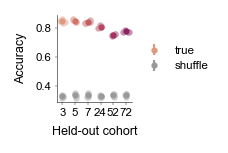

In [68]:
fig, ax = plt.subplots(1, 1, figsize = (1.5, 1), dpi = 150)
age_order = sorted(age_groups.keys(), key=lambda x: int(x))
for i, a in enumerate(age_order):
    viz.util.grouped_stripplot(
        [scores.query("out == @a")['val_acc'].values],
        x = [i],
        ax = ax,
        colors = age_pal[a],
        points_kw={'ms': 2},
        jitter = 0.25,
        lighten_points=0.5,
        errorbar_kw={'lw': 0.5, 'ms': 2},
        labels='true'
    )
    viz.util.grouped_stripplot(
        [scores.query("out == @a")['trn_null'].values],
        x = [i],
        ax = ax,
        colors = '.6',
        points_kw={'ms': 2},
        lighten_points=0.5,
        errorbar_kw={'lw': 0.5, 'ms': 2},
        labels='shuffle'
    )

ax.set_xticks(range(len(age_order)))
ax.set_xticklabels(age_order)
ax.set_xlabel("Held-out cohort")
ax.set_ylabel("Accuracy")
viz.util.legend(ax, viz.util.unique_handles(ax))
plotter.finalize(fig, None)

#### Classifiers: individual pre-ethogram behaviors

In [ ]:
scores = {"out": [], "trn_acc": [], "val_acc": [], "trn_null": []}
n_iter = 5
rng = np.random.default_rng(48)

XYdf = pd.concat([examples[k].assign(label = i) for i, k in enumerate(bhv_order)])
XYdf = XYdf.query("on")
XYdf = XYdf.groupby('n').agg({c: ('first' if c in ['s', 'label'] else 'median') for c in XYdf.columns})

with tqdm.tqdm(total = len(age_groups) * n_iter) as pbar:
    for a, age_group in age_groups.items():
        for i in range(n_iter):
            trn_s = [s for s in dataset_feats.sessions if s not in age_group]
            val_s = age_group

            Xt, yt, Xv, yv = create_classification_dataset(XYdf, trn_s, val_s, (0, 1), (0, 1), trn_max=5000, val_max=5000, seed=rng)
            classifier = RandomForestClassifier(max_depth=5, n_estimators=20, max_features=2, random_state=43, class_weight='balanced')
            trn_acc, val_acc, val_confusion = fit_and_score(classifier, Xt, yt, Xv, yv)
            scores["out"].append(a)
            scores["trn_acc"].append(trn_acc)
            scores["val_acc"].append(val_acc)

            shuf_yt = rng.permutation(yt)
            trn_acc, val_acc, val_confusion = fit_and_score(classifier, Xt, shuf_yt, Xv, yv)
            scores["trn_null"].append(trn_acc)
            pbar.update()

scores = pd.DataFrame(scores)
    

100%|██████████| 30/30 [00:03<00:00,  8.18it/s]


In [139]:
def create_singlebhv_classification_dataset(feats_dict, masks, trn_sessions, val_sessions, trn_frac, val_frac, seed=49):
    """


    feats_dict : dict[str : array (n_frames, ...)]
        Dictionary of features for each session
    masks : dict[str : array (n_frames)]
        Dictionary of boolean masks for each session
    trn_sessions, val_sessions : list[str]
        List of sessions to use for training and validation datasets
    trn_frac, val_frac : float
        Fraction of frames to use for training and validation datasets.
        Whichever of Positive/negative examples has more frames will be will be
        used to determine the number of 
        examples to include, and the number will be matched
        for other class. E.g. if trn_frac = (0, 0.5) and and there are 66
        frames, with every third frame being positive, the training dataset will
        include 11 positive and 11 negative examples. Training and validation
        fractions should not sum to more than 1 or frames will be duplicated
        between the sets.


    Returns:
    --------
    X_trn, y_trn, X_val, y_val
    """
    rng = np.random.default_rng(seed)
    
    
    Xt, yt, Xv, yv = [], [], [], []
    for session in set(trn_sessions + val_sessions):
        feats = feats_dict[session]
        mask = masks[session]
        pos_indices = np.where(mask)[0]
        neg_indices = np.where(~mask)[0]
        nmin = min(len(pos_indices), len(neg_indices))
        ntrn = int(nmin * trn_frac)
        nval = int(nmin * val_frac)
        
        pos_indices = rng.permutation(pos_indices)
        neg_indices = rng.permutation(neg_indices)
        if session in trn_sessions:
            Xt.append(feats[pos_indices[:ntrn]])
            Xt.append(feats[neg_indices[:ntrn]])
            yt.append(np.ones(ntrn))
            yt.append(np.zeros(ntrn))
        if session in val_sessions:
            Xv.append(feats[pos_indices[ntrn:ntrn + nval]])
            Xv.append(feats[neg_indices[ntrn:ntrn + nval]])
            yv.append(np.ones(nval))
            yv.append(np.zeros(nval))
        
    
    return np.concatenate(Xt), np.concatenate(yt), np.concatenate(Xv), np.concatenate(yv)


In [140]:
sup_bhv_masks = {
    k: sup_bhv['masks'][bhv_keys[k]]
    for k in bhv_order
}
prob_feats = {
    s: np.exp(pose_logprobs[s]) / np.exp(pose_logprobs[s]).sum(axis = 1, keepdims = True)
    for s in dataset_feats.sessions
}
classifier = RandomForestClassifier(max_depth=5, n_estimators=20, max_features=2, random_state=43, class_weight='balanced')
trn_acc, val_acc, cm = {}, {}, {}
for k in bhv_order:
    print(k)
    Xt, yt, Xv, yv = create_singlebhv_classification_dataset(prob_feats, sup_bhv_masks[k], dataset_feats.sessions, dataset_feats.sessions, 0.5, 0.5)
    t, v, c = fit_and_score(classifier, Xt, yt, Xv, yv)
    trn_acc[k] = t
    val_acc[k] = v
    cm[k] = c


rear
loco
raise
turn
hunch


In [141]:
prob_feats = {
    s: np.exp(pose_logprobs[s]) / np.exp(pose_logprobs[s]).sum(axis = 1, keepdims = True)
    for s in dataset_feats.sessions
}
classifier = RandomForestClassifier(max_depth=5, n_estimators=20, max_features=2, random_state=43, class_weight='balanced')
trn_acc_etho, val_acc_etho, cm_etho = {}, {}, {}
for k in bhv_order:
    print(k)
    Xt, yt, Xv, yv = create_singlebhv_classification_dataset(prob_feats, bhv_masks[k], dataset_feats.sessions, dataset_feats.sessions, 0.5, 0.5)
    t, v, c = fit_and_score(classifier, Xt, yt, Xv, yv)
    trn_acc_etho[k] = t
    val_acc_etho[k] = v
    cm_etho[k] = c

rear
loco
raise
turn
hunch


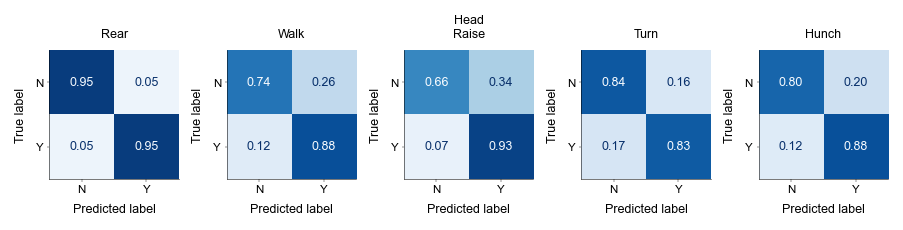

In [94]:
from sklearn.metrics import ConfusionMatrixDisplay

fig, ax = plt.subplots(1, 5, figsize = (6, 1.5), dpi = 150)
for i, k in enumerate(bhv_order):
    ConfusionMatrixDisplay(cm[k] / cm[k].sum(axis = 1, keepdims=True), display_labels = "NY").plot(ax = ax[i], cmap = 'Blues', values_format = '.2f', colorbar=False, im_kw = dict(vmin=0, vmax=1))
    ax[i].set_title(bhv_names[k])
plotter.finalize(fig, None)

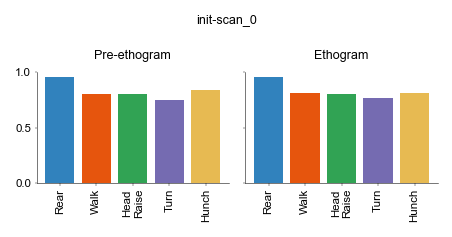

In [142]:
fig, ax = plt.subplots(1, 2, figsize = (3, 1.5), dpi = 150, sharex=True, sharey=True)
for i, k in enumerate(bhv_order):
    ax[0].bar(i, val_acc[k], color = bhv_pal[k], bottom=0)
    ax[1].bar(i, val_acc_etho[k], color = bhv_pal[k], bottom=0)
for a in ax:
    a.set_xticks(range(len(bhv_order)))
    a.set_xticklabels(bhv_names.values(), rotation = 90)
ax[0].set_title("Pre-ethogram")
ax[1].set_title("Ethogram")
fig.suptitle(model_name)
plotter.finalize(fig, None)

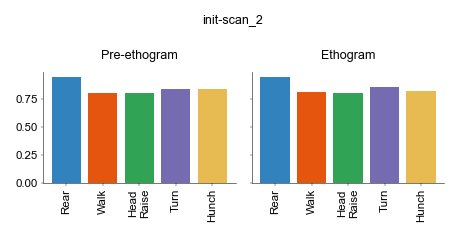

In [133]:
fig, ax = plt.subplots(1, 2, figsize = (3, 1.5), dpi = 150, sharex=True, sharey=True)
for i, k in enumerate(bhv_order):
    ax[0].bar(i, val_acc[k], color = bhv_pal[k], bottom=0)
    ax[1].bar(i, val_acc_etho[k], color = bhv_pal[k], bottom=0)
for a in ax:
    a.set_xticks(range(len(bhv_order)))
    a.set_xticklabels(bhv_names.values(), rotation = 90)
ax[0].set_title("Pre-ethogram")
ax[1].set_title("Ethogram")
fig.suptitle(model_name)
plotter.finalize(fig, None)

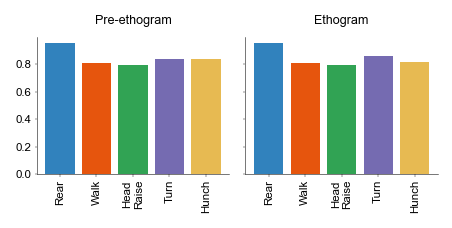

In [99]:
fig, ax = plt.subplots(1, 2, figsize = (3, 1.5), dpi = 150, sharex=True, sharey=True)
for i, k in enumerate(bhv_order):
    ax[0].bar(i, val_acc[k], color = bhv_pal[k], bottom=0)
    ax[1].bar(i, val_acc_etho[k], color = bhv_pal[k], bottom=0)
for a in ax:
    a.set_xticks(range(len(bhv_order)))
    a.set_xticklabels(bhv_names.values(), rotation = 90)
ax[0].set_title("Pre-ethogram")
ax[1].set_title("Ethogram")
plotter.finalize(fig, None)

#### Noise / temperature

In [113]:

sup_bhv_intervals = {
    k: {
        s: sup_bhv["intervals"][bhv_keys[k]][s]
        for s in dataset_feats.sessions
    }
    for k in bhv_order
}
invtemp = 0.2
pose_temp_probs = {
    s: np.exp(pose_logprobs[s] * invtemp) / np.exp(pose_logprobs[s] * invtemp).sum(axis = 1, keepdims = True)
    for s in dataset_feats.sessions
}
examples = compute_bhv_example_dataframes(
    pose_temp_probs, sup_bhv_intervals, 40, 10, probs_are_log=False
)

100%|██████████| 30/30 [00:03<00:00,  8.88it/s]


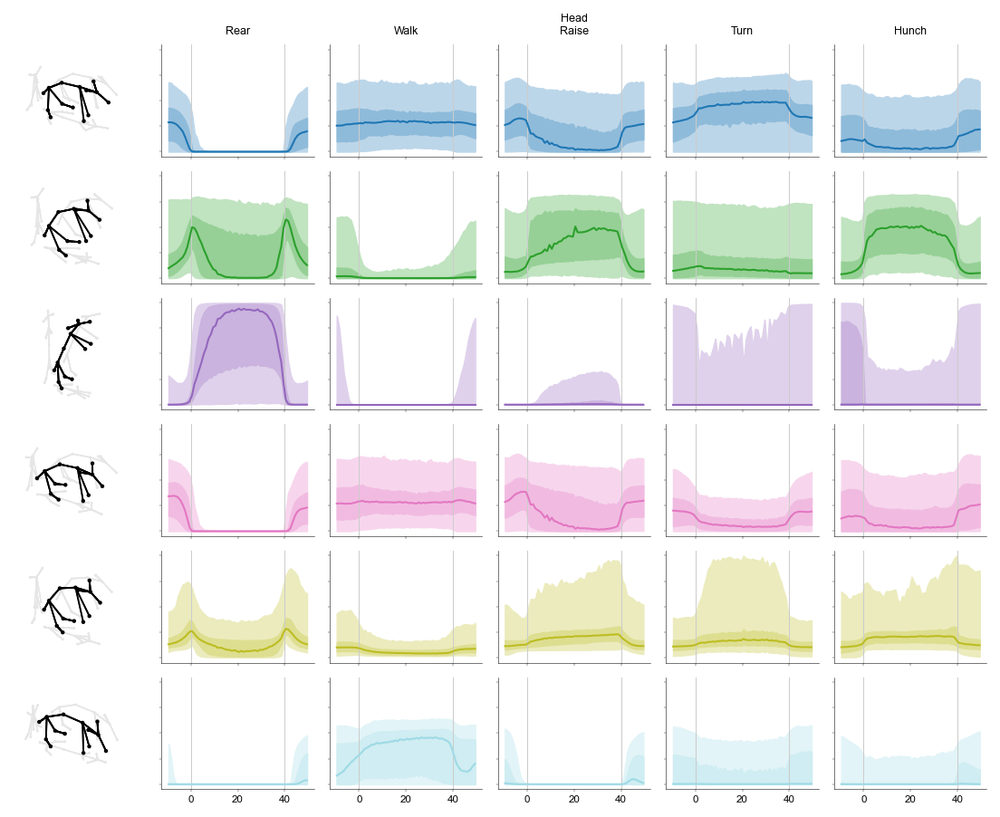

In [124]:
comp_pal = Colormap('tab20')(np.linspace(0, 1, n_components))
fig, axes = plt.subplots(n_components, n_etho + 1, figsize = (1.5 * n_etho, 1 * n_components), dpi = 150, sharex=True, sharey=True)
for ax in axes[:, 0]:
    ax.set_visible(False)

col0 = [fig.add_subplot(n_components, n_etho + 1, 1+i*(n_etho + 1), projection='3d') for i in range(n_components)]
for i, ax in enumerate(col0):
    mean = params.pose.means[i]
    mean = features.inflate(mean[None], cfg['features'])[0]
    plotdrop(mean, ax, 'k', 0.3, 0.6)


ax = axes[:, 1:]
bins = np.linspace(-buffer - 1e-2, res + buffer + 1e-2, res + 2 * buffer + 1)
bin_centers = (bins[:-1] + bins[1:]) / 2
with tqdm.tqdm(total = len(bhv_order) * n_components) as pbar:
    for i, k in enumerate(bhv_order):
        for j in range(n_components):
            # for _, df in examples[k].query("n % 20 == 0").groupby('n'):
            #     ax[j, i].plot(df['x'], df[j], color = viz.util.lighten(comp_pal[j], 0.5), lw = 0.1)
            y, lo, hi, lo50, hi50 = np.zeros([5, len(bin_centers)])
            for l, (x1, x2) in enumerate(zip(bins[:-1], bins[1:])):
                d = examples[k].query("x > @x1 and x <= @x2")[j]
                # y[l] = d.mean()
                # ci = viz.util.ci(d.values, level=0.95, n=1000, absolute=True)
                lo[l], hi[l] = np.nanquantile(d.values, [0.025, 0.975])
                lo50[l], hi50[l] = np.nanquantile(d.values, [0.25, 0.75])
                y[l] = np.nanmedian(d.values)
                # lo[l] = ci[0]
                # hi[l] = ci[1]
            
            ax[j, i].plot(bin_centers, y, color = comp_pal[j], lw = 1)
            ax[j, i].fill_between(bin_centers, lo, hi, color = viz.util.lighten(comp_pal[j], 0.7), zorder = -3)
            ax[j, i].fill_between(bin_centers, lo50, hi50, color = viz.util.lighten(comp_pal[j], 0.5), zorder = -2)
            ax[j, i].axvline(0, color = '.8', lw = 0.5, zorder = 1)
            ax[j, i].axvline(res, color = '.8', lw = 0.5, zorder = 1)
            pbar.update()
        ax[0, i].set_title(bhv_names[k])
plotter.finalize(fig, None)

#### Held out cohort across models

In [49]:
def heldout_cohort_scores(examples, bhv_order, age_groups, ref_group, classifier, n_iter = 5, seed = 48, nframes=1000):
    scores = {"out": [], "trn_acc": [], "val_acc": [], "trn_null": []}
    rng = np.random.default_rng(seed)
    # all_sessions = np.concatenate(list(age_groups.values()))
    trn_s = age_groups[ref_group]

    XYdf = pd.concat([examples[k].assign(label = i) for i, k in enumerate(bhv_order)])
    XYdf = XYdf.query("on")
    XYdf = XYdf.groupby('n').agg({c: ('first' if c in ['s', 'label'] else 'median') for c in XYdf.columns})

    with tqdm.tqdm(total = (len(age_groups) - 1) * n_iter) as pbar:
        for a, age_group in age_groups.items():
            if a == ref_group:
                continue
            for i in range(n_iter):
                # trn_s = [s for s in all_sessions if s not in age_group]
                val_s = age_group

                Xt, yt, Xv, yv = create_classification_dataset(XYdf, trn_s, val_s, (0, 1), (0, 1), trn_max=nframes, val_max=nframes, seed=rng)
                trn_acc, val_acc, val_confusion = fit_and_score(classifier, Xt, yt, Xv, yv)
                scores["out"].append(a)
                scores["trn_acc"].append(trn_acc)
                scores["val_acc"].append(val_acc)

                shuf_yt = rng.permutation(yt)
                trn_acc, val_acc, val_confusion = fit_and_score(classifier, Xt, shuf_yt, Xv, yv)
                scores["trn_null"].append(trn_acc)
                pbar.update()

    return pd.DataFrame(scores)

In [50]:
model_names = [f'init-scan_{i}' for i in range(3)]
model_ckpts = [methods.load_fit(project.model(m)) for m in model_names]
model_params = [c['params'] for c in model_ckpts]
model_cfgs = [c['config'] for c in model_ckpts]
stiffs = [p.morph.dist_var for p in model_params]
selected_model_ix = model_names.index(model_name)

laodfing model config /Users/kaifox/projects/mph/generative_api/test/projects/o2-ont/fit03-2_frames-many_gmm10/models/init-scan_0/model.yml
project path /Users/kaifox/projects/mph/generative_api/test/projects/o2-ont/fit03-2_frames-many_gmm10/models/init-scan_0/../../project.yml
laodfing model config /Users/kaifox/projects/mph/generative_api/test/projects/o2-ont/fit03-2_frames-many_gmm10/models/init-scan_0/model.yml
project path /Users/kaifox/projects/mph/generative_api/test/projects/o2-ont/fit03-2_frames-many_gmm10/models/init-scan_0/../../project.yml
laodfing model config /Users/kaifox/projects/mph/generative_api/test/projects/o2-ont/fit03-2_frames-many_gmm10/models/init-scan_1/model.yml
project path /Users/kaifox/projects/mph/generative_api/test/projects/o2-ont/fit03-2_frames-many_gmm10/models/init-scan_1/../../project.yml
laodfing model config /Users/kaifox/projects/mph/generative_api/test/projects/o2-ont/fit03-2_frames-many_gmm10/models/init-scan_1/model.yml
project path /Users/kai

In [51]:
sup_etho_intervals = {
    k: {
        s: sup_etho["intervals"][s][sup_etho["behaviors"].index(bhv_keys[k])]
        for s in dataset_feats.sessions
    }
    for k in bhv_order
}

scores = []
classifier = RandomForestClassifier(max_depth=2, n_estimators=40, max_features=2, random_state=43, class_weight='balanced')
for m, p in zip(model_names, model_params):
    canonicalized_full, _, _ = canonicalized_and_raw(scan_dataset_full, p.morph, rescale=False, scale_to=ref_session)
    pose_logprobs = pose.gmm.pose_logprob(params.pose, features.reduce_to_features(canonicalized_full, cfg['features']))
    pose_logprobs = {s: pose_logprobs[slice(*scan_dataset_full.get_slice(s))] for s in dataset_feats.sessions}

    examples = compute_bhv_example_dataframes(
        pose_logprobs, sup_etho_intervals, 40, 10, temp=0.2
    )
    scores.append(
        heldout_cohort_scores(examples, bhv_order, age_groups, ref_age, classifier).assign(model=m)
    )

scores = pd.concat(scores)



100%|██████████| 25/25 [00:01<00:00, 16.99it/s]


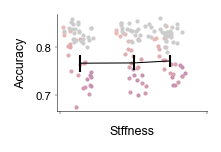

In [52]:
fig, ax = plt.subplots(1, 1, figsize = (1.5, 1), dpi = 150)
age_order = sorted(age_groups.keys(), key=lambda x: int(x))
kw_points = lambda c: dict(colors = c,
        points_kw={'ms': 1},
        jitter = 0.25,
        lighten_points=0.5,
        errorbar=False)
kw_err = lambda l: dict(colors = 'k',
        points=False,
        error=lambda a: viz.util.ci(a, level=0.95, n=1000),
        errorbar_kw={'ms': 0},
        labels=l)

m = model_name
ymean = []
for stiff, m in zip(stiffs, model_names):
    df = scores.query("model == @m")
    for i, a in enumerate([a_ for a_ in age_order if a_ != str(ref_age)]):
        viz.util.grouped_stripplot(
            [df.query("out == @a")['val_acc'].values],
            x = [-np.log10(stiff) + viz.util.get_offsets(len(age_groups) - 1, i)],
            ax = ax,
            **kw_points(age_pal[a]),
        )

        viz.util.grouped_stripplot(
            [df.query("out == @a")['trn_acc'].values],
            x = [-np.log10(stiff) + viz.util.get_offsets(len(age_groups) - 1, i)],
            ax = ax,
            **kw_points('.6'),
        )

    y = np.concatenate([df.query("out == @a")['val_acc'].values for a in age_order])
    viz.util.grouped_stripplot(
        [y],
        x = [-np.log10(stiff)],
        ax = ax,
        **kw_err(None)
    )
    ymean.append(y.mean())

ax.plot(-np.log10(stiffs), ymean, color = 'k', lw = 0.5)

ax.set_xlabel("Stffness")
ax.set_ylabel("Accuracy")
ax.set_xticks([-1, 3])
plotter.finalize(fig, None)

#### raw GMM

In [234]:
from sklearn.mixture import GaussianMixture as GMM
raw, _ = unalign_scales(_align_meta, dataset_versions['aligned'], None, None)
raw_full, _ = unalign_scales(_align_meta, dataset_versions_full['aligned'], None, None)
nfeat = arms.n_kpts * 3
raw_feats = raw._data.reshape(-1, nfeat)
rawgmm = GMM(n_components=params.pose.n_components).fit(raw_feats)
pose_logprobs = {s: rawgmm.predict_proba(raw_full.get_session(s).reshape(-1, nfeat)) for s in dataset_feats.sessions}

In [235]:
examples = compute_bhv_example_dataframes(
    pose_logprobs, sup_etho_intervals, 40, 10
)
scores_raw = heldout_cohort_scores(examples, bhv_order, age_groups, ref_age, classifier, nframes=1000).assign(model='raw')

100%|██████████| 25/25 [00:01<00:00, 18.32it/s]


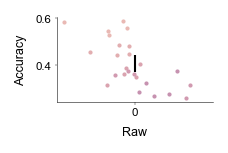

In [236]:
fig, ax = plt.subplots(1, 1, figsize = (1.5, 1), dpi = 150)
age_order = sorted(age_groups.keys(), key=lambda x: int(x))
kw_points = lambda c: dict(colors = c,
        points_kw={'ms': 1},
        jitter = 0.25,
        lighten_points=0.5,
        errorbar=False)
kw_err = lambda l: dict(colors = 'k',
        points=False,
        error=lambda a: viz.util.ci(a, level=0.95, n=1000),
        errorbar_kw={'ms': 0},
        labels=l)


for i, a in enumerate([a_ for a_ in age_order if a_ != str(ref_age)]):
    viz.util.grouped_stripplot(
        [scores_raw.query("out == @a")['val_acc'].values],
        x = [0 + viz.util.get_offsets(len(age_groups) - 1, i)],
        ax = ax,
        **kw_points(age_pal[a]),
    )

y = np.concatenate([scores_raw.query("out == @a")['val_acc'].values for a in age_order])
viz.util.grouped_stripplot(
    [y],
    x = [0],
    ax = ax,
    **kw_err(None)
)

ax.set_xlabel("Raw")
ax.set_ylabel("Accuracy")
ax.set_xticks([0])
ax.set_xlim(-0.5, 0.5)
plotter.finalize(fig, None)

In [237]:
from sklearn.mixture import GaussianMixture as GMM
_, rigid, _ = canonicalized_and_raw(scan_dataset, p.morph, rescale=False)
_, rigid_full, _ = canonicalized_and_raw(scan_dataset_full, p.morph, rescale=False)
nfeat = arms.n_kpts * 3
rigid_feats = rigid._data.reshape(-1, nfeat)
rigidgmm = GMM(n_components=params.pose.n_components).fit(rigid_feats)
pose_logprobs = {s: rigidgmm.predict_proba(rigid_full.get_session(s).reshape(-1, nfeat)) for s in dataset_feats.sessions}

In [238]:
examples = compute_bhv_example_dataframes(
    pose_logprobs, sup_etho_intervals, 40, 10
)
scores_rigid = heldout_cohort_scores(examples, bhv_order, age_groups, ref_age, classifier, nframes=1000).assign(model='raw')

100%|██████████| 25/25 [00:01<00:00, 16.68it/s]


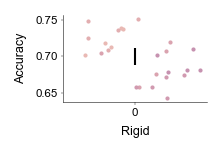

In [239]:
fig, ax = plt.subplots(1, 1, figsize = (1.5, 1), dpi = 150)
age_order = sorted(age_groups.keys(), key=lambda x: int(x))
kw_points = lambda c: dict(colors = c,
        points_kw={'ms': 1},
        jitter = 0.25,
        lighten_points=0.5,
        errorbar=False)
kw_err = lambda l: dict(colors = 'k',
        points=False,
        error=lambda a: viz.util.ci(a, level=0.95, n=1000),
        errorbar_kw={'ms': 0},
        labels=l)


for i, a in enumerate([a_ for a_ in age_order if a_ != str(ref_age)]):
    viz.util.grouped_stripplot(
        [scores_rigid.query("out == @a")['val_acc'].values],
        x = [0 + viz.util.get_offsets(len(age_groups) - 1, i)],
        ax = ax,
        **kw_points(age_pal[a]),
    )

y = np.concatenate([scores_rigid.query("out == @a")['val_acc'].values for a in age_order])
viz.util.grouped_stripplot(
    [y],
    x = [0],
    ax = ax,
    **kw_err(None)
)

ax.set_xlabel("Rigid")
ax.set_ylabel("Accuracy")
ax.set_xticks([0])
ax.set_xlim(-0.5, 0.5)
plotter.finalize(fig, None)

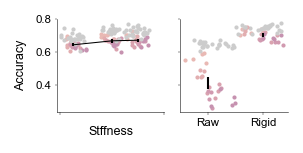

In [252]:
fig, axes = plt.subplots(1, 2, figsize = (2, 1), dpi = 150, sharey=True)
age_order = sorted(age_groups.keys(), key=lambda x: int(x))
kw_points = lambda c: dict(colors = c,
        points_kw={'ms': 1},
        jitter = 0.25,
        lighten_points=0.5,
        errorbar=False)
kw_err = lambda l: dict(colors = 'k',
        points=False,
        error=lambda a: viz.util.ci(a, level=0.95, n=1000),
        errorbar_kw={'ms': 0},
        labels=l)

m = model_name
ymean = []
ax = axes[0]
for stiff, m in zip(stiffs, model_names):
    df = scores.query("model == @m")
    for i, a in enumerate([a_ for a_ in age_order if a_ != str(ref_age)]):
        viz.util.grouped_stripplot(
            [df.query("out == @a")['val_acc'].values],
            x = [-np.log10(stiff) + viz.util.get_offsets(len(age_groups) - 1, i)],
            ax = ax,
            **kw_points(age_pal[a]),
        )

        viz.util.grouped_stripplot(
            [df.query("out == @a")['trn_acc'].values],
            x = [-np.log10(stiff) + viz.util.get_offsets(len(age_groups) - 1, i)],
            ax = ax,
            **kw_points('.6'),
        )

    y = np.concatenate([df.query("out == @a")['val_acc'].values for a in age_order])
    viz.util.grouped_stripplot(
        [y],
        x = [-np.log10(stiff)],
        ax = ax,
        **kw_err(None)
    )
    ymean.append(y.mean())

ax.plot(-np.log10(stiffs), ymean, color = 'k', lw = 0.5)

ax.set_xlabel("Stffness")
ax.set_ylabel("Accuracy")
ax.set_xticks([-1, 3])

ax = axes[1]

# ------ rigid
for i, a in enumerate([a_ for a_ in age_order if a_ != str(ref_age)]):
    viz.util.grouped_stripplot(
        [scores_rigid.query("out == @a")['val_acc'].values],
        x = [1 + viz.util.get_offsets(len(age_groups) - 1, i)],
        ax = ax,
        **kw_points(age_pal[a]),
    )
    viz.util.grouped_stripplot(
        [scores_rigid.query("out == @a")['trn_acc'].values],
        x = [1 + viz.util.get_offsets(len(age_groups) - 1, i)],
        ax = ax,
        **kw_points('.6'),
    )

y = np.concatenate([scores_rigid.query("out == @a")['val_acc'].values for a in age_order])
viz.util.grouped_stripplot(
    [y],
    x = [1],
    ax = ax,
    **kw_err(None)
)

# ------ raw
for i, a in enumerate([a_ for a_ in age_order if a_ != str(ref_age)]):
    viz.util.grouped_stripplot(
        [scores_raw.query("out == @a")['val_acc'].values],
        x = [0 + viz.util.get_offsets(len(age_groups) - 1, i)],
        ax = ax,
        **kw_points(age_pal[a]),
    )
    viz.util.grouped_stripplot(
        [scores_raw.query("out == @a")['trn_acc'].values],
        x = [0 + viz.util.get_offsets(len(age_groups) - 1, i)],
        ax = ax,
        **kw_points('.6'),
    )

y = np.concatenate([scores_raw.query("out == @a")['val_acc'].values for a in age_order])
viz.util.grouped_stripplot(
    [y],
    x = [0],
    ax = ax,
    **kw_err(None)
)

ax.set_xticks([0, 1])
ax.set_xticklabels(["Raw", "Rigid"])

plotter.finalize(fig, None)

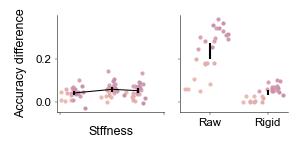

In [251]:
fig, axes = plt.subplots(1, 2, figsize = (2, 1), dpi = 150, sharey=True)
age_order = sorted(age_groups.keys(), key=lambda x: int(x))
kw_points = lambda c: dict(colors = c,
        points_kw={'ms': 1},
        jitter = 0.25,
        lighten_points=0.5,
        errorbar=False)
kw_err = lambda l: dict(colors = 'k',
        points=False,
        error=lambda a: viz.util.ci(a, level=0.95, n=1000),
        errorbar_kw={'ms': 0},
        labels=l)

m = model_name
ymean = []
ax = axes[0]
for stiff, m in zip(stiffs, model_names):
    df = scores.query("model == @m")
    for i, a in enumerate([a_ for a_ in age_order if a_ != str(ref_age)]):
        viz.util.grouped_stripplot(
            [df.query("out == @a")['trn_acc'].values - df.query("out == @a")['val_acc'].values],
            x = [-np.log10(stiff) + viz.util.get_offsets(len(age_groups) - 1, i)],
            ax = ax,
            **kw_points(age_pal[a]),
        )

        # viz.util.grouped_stripplot(
        #     [df.query("out == @a")['trn_acc'].values],
        #     x = [-np.log10(stiff) + viz.util.get_offsets(len(age_groups) - 1, i)],
        #     ax = ax,
        #     **kw_points('.6'),
        # )

    y = np.concatenate([df.query("out == @a")['trn_acc'].values - df.query("out == @a")['val_acc'].values for a in age_order])
    viz.util.grouped_stripplot(
        [y],
        x = [-np.log10(stiff)],
        ax = ax,
        **kw_err(None)
    )
    ymean.append(y.mean())

ax.plot(-np.log10(stiffs), ymean, color = 'k', lw = 0.5)

ax.set_xlabel("Stffness")
ax.set_ylabel("Accuracy difference")
ax.set_xticks([-1, 3])

ax = axes[1]
# ------ rigid
for i, a in enumerate([a_ for a_ in age_order if a_ != str(ref_age)]):
    viz.util.grouped_stripplot(
        [scores_rigid.query("out == @a")['trn_acc'].values - scores_rigid.query("out == @a")['val_acc'].values],
        x = [1 + viz.util.get_offsets(len(age_groups) - 1, i)],
        ax = ax,
        **kw_points(age_pal[a]),
    )
    # viz.util.grouped_stripplot(
    #     [scores_rigid.query("out == @a")['trn_acc'].values],
    #     x = [1 + viz.util.get_offsets(len(age_groups) - 1, i)],
    #     ax = ax,
    #     **kw_points('.6'),
    # )

y = np.concatenate([scores_rigid.query("out == @a")['trn_acc'].values - scores_rigid.query("out == @a")['val_acc'].values for a in age_order])
viz.util.grouped_stripplot(
    [y],
    x = [1],
    ax = ax,
    **kw_err(None)
)

# ------ raw
for i, a in enumerate([a_ for a_ in age_order if a_ != str(ref_age)]):
    viz.util.grouped_stripplot(
        [scores_raw.query("out == @a")['trn_acc'].values - scores_raw.query("out == @a")['val_acc'].values],
        x = [0 + viz.util.get_offsets(len(age_groups) - 1, i)],
        ax = ax,
        **kw_points(age_pal[a]),
    )
    # viz.util.grouped_stripplot(
    #     [scores_raw.query("out == @a")['trn_acc'].values],
    #     x = [0 + viz.util.get_offsets(len(age_groups) - 1, i)],
    #     ax = ax,
    #     **kw_points('.6'),
    # )

y = np.concatenate([scores_raw.query("out == @a")['trn_acc'].values - scores_raw.query("out == @a")['val_acc'].values for a in age_order])
viz.util.grouped_stripplot(
    [y],
    x = [0],
    ax = ax,
    **kw_err(None)
)

ax.set_xticks([0, 1])
ax.set_xticklabels(["Raw", "Rigid"])

plotter.finalize(fig, None)

#### Basic rearing example

/Users/kaifox/projects/mph/generative_api/shape_norm/viz/_style.py:89: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


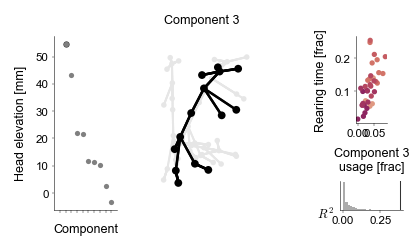

PosixPath('/Users/kaifox/projects/mph/generative_api/test/projects/o2-ont/fit03-2_frames-many_gmm10/models/init-scan_1/panel-plots/g-rearing-example.pdf')

In [56]:
head_ix = arms.keypoint_names.inverse['head']
means = features.inflate(params.pose.means, cfg['features'])
heat_ht = means[:, head_ix, 2]
head_ord = np.argsort(heat_ht)[::-1]
ordnum = 1
rear_usages = {s: bhv_masks['rear'][s].mean() for s in dataset.sessions}


kws = lambda c, ps, ls: dict(
    armature = arms,
    elev = 30, 
    rot = -70,
    colors = np.array([c] * arms.n_kpts),
    point_size = ps,
    line_size = ls,
    boundary=False,
)
dropz = lambda x, z: np.concatenate([x[:, :2], np.broadcast_to(z, x.shape[:-1] + (1,))], axis = -1) 
dropy = lambda x, y: np.concatenate([x[:, :1], np.broadcast_to(y, x.shape[:-1] + (1,)), x[:, 2:]], axis = -1)
dropx = lambda x, xx: np.concatenate([np.broadcast_to(xx, x.shape[:-1] + (1,)), x[:, 1:]], axis = -1)
plotdrop = lambda f, a, c, sm=1, shad=True: [
    plot_mouse_3d(f, a, **kws(c, sm * 14, 1.5))] + ([
    plot_mouse_3d(dropz(f, -5), a, **kws('.9', sm * 7, 1)),
    plot_mouse_3d(dropy(f, 15), a, **kws('.9', sm * 7, 1)),
    plot_mouse_3d(dropx(f, -5), a, **kws('.9', sm * 7, 1)),
] if shad else [])

fig = plt.figure(figsize = (3, 1.5), dpi=150)
gs = plt.GridSpec(2, 4, width_ratios = [1, 3, 1, 1], wspace=-0.1, hspace = 1, height_ratios = [3, 1])
ax = fig.add_subplot(gs[:, 0])
ax.plot([ordnum], heat_ht[head_ord[ordnum]], 'o', mfc = '.2', mew = 0, ms = 3.)
ax.plot(np.arange(1, params.pose.n_components), heat_ht[head_ord[1:]], 'o', mfc = '.5', mew = 0, ms = 2.5)
ax.set_xticks(np.arange(params.pose.n_components))
ax.set_xticklabels([""] * params.pose.n_components)
ax.set_ylabel("Head elevation [mm]")
ax.set_xlabel("Component")
ax.set_xlim(-1, params.pose.n_components - 1 + 1)

ax = fig.add_subplot(gs[:, 1], projection = '3d')
plotdrop(means[head_ord[ordnum]], ax, 'k')
ax.set_title(f"Component {head_ord[ordnum]}")



ax = fig.add_subplot(gs[0, 3])
corr_x = [
    params.pose.subj_weights[dataset.session_id(s), head_ord[ordnum]]
    for s in dataset.sessions
]
corr_y = [
    rear_usages[s]
    for s in dataset.sessions
]
age_clr = [age_pal[re.search(r"(\d+)wk", s).group(1)] for s in dataset.sessions]
ax.scatter(corr_x, corr_y, c = age_clr, s = 3)
vmin = min(ax.get_xlim()[0], ax.get_ylim()[0])
vmax = max(ax.get_xlim()[1], ax.get_ylim()[1])
vmin, vmax = vmin - 0.05 * (vmax - vmin), vmax + 0.05 * (vmax - vmin)
# ax.set_xlim(vmin, vmax)
# ax.set_ylim(vmin, vmax)
# ax.plot([vmin, vmax], [vmin, vmax], 'k--', lw = 0.3)
# ax.set_xticks([0.05, 0.15])
# ax.set_yticks([0.05, 0.15])
ax.set_aspect(1.)
ax.set_xlabel(f"Component {head_ord[ordnum]}\nusage [frac]")
ax.set_ylabel("Rearing time [frac]")

ax = fig.add_subplot(gs[1, 3])
corr = lambda x, y: np.corrcoef(x, y)[0, 1] ** 2
ax.axvline(corr(corr_x, corr_y), color = '.2', lw = 0.5)
rng = np.random.default_rng(623)
shuf = [corr(rng.permutation(corr_x), corr_y) for _ in range(1000)]
ax.hist(shuf, bins = 20, color = '.67', density = True)
ax.set_yticks([])
ax.spines['left'].set_visible(False)
ax.text(-0.1, 0.1, f"$R^2$", math_fontfamily = 'cm', ha = 'right', va = 'top', fontsize = 6, transform = ax.transAxes)



plotter.finalize(fig, 'g-rearing-example')
